In [1]:
# CBF imports
import scipy
import numpy as np
import matplotlib.patches as pat
import matplotlib.pyplot  as plt
from data      import make_rectangle, insert_shape, plot_data, plot_angle_data, get_gparams
from agent     import Agent
from controls  import hjb_controls, hjb_controls_parallel
from rbf       import get_h, get_h_curr
from optim     import get_learning_cbfs_lagrangian_hj, get_learning_cbfs_lagrangian_hj_optim, cvx_train_cbf, clarabel_solve_cbf, fit_cbf_w_inv, gradient_descent
from utils     import plot_cbf, plot_angles, _plot_angles, quad_plot, union, intersection, difference

# HJB imports 
import jax
import jax.numpy            as jnp
import matplotlib.animation as anim
import matplotlib.pyplot    as plt
import plotly.graph_objects as go
import hj_reachability      as hj
from IPython.display import HTML

%load_ext autoreload
%autoreload 2

x,y spacing: 0.12297297297297297
theta spacing: 0.2617993877991494
X_0 GRID INFORMATION
 domain: [ -2.275 , 2.275 ]
 n: 38 
 density: 0.11973684210526316
X_1 GRID INFORMATION
 domain: [ -2.275 , 2.275 ]
 n: 38 
 density: 0.11973684210526316
X_2 GRID INFORMATION
 domain: [ 0 , 6.283185307179586 ]
 n: 24 
 density: 0.2617993877991494


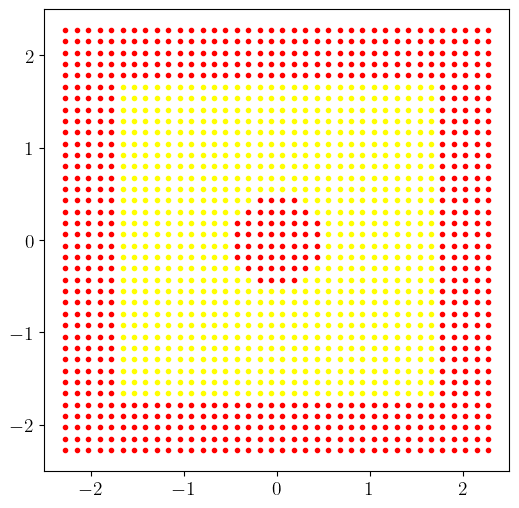

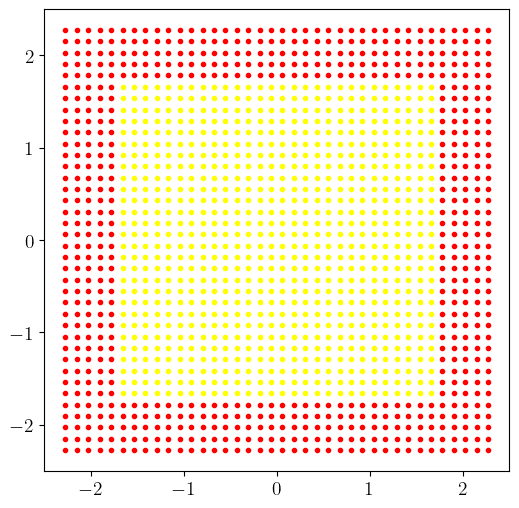

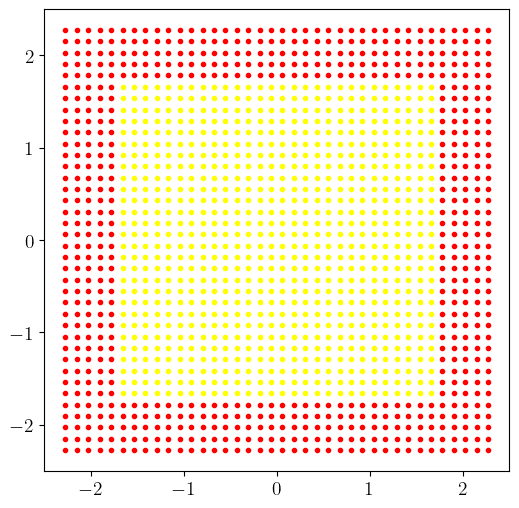

In [2]:
#########################
### Data Construction ###
#########################

width         = 3.5
density       = 72
unsafe_margin = 0.3
thn           = 24 #20

# make grid and obstacles
obs_funcs = []
grid, params, obs_dict, is_obs_grid = make_rectangle(height=width, width=width, density=density, unsafe_margin=unsafe_margin, center=(0,0), return_params=True)
#obs_dict = insert_shape(np.array([0,  1.5]), grid, obs_dict, shape='circle', scale=0.75, theta=0)
obs_dict, is_obs_circ = insert_shape(np.array([0, 0]), grid, obs_dict, shape='circle', scale=0.50, theta=0)
obstacles = np.array([pt for pt in grid if obs_dict[tuple(np.round(pt, 3))] != 0])
obs_funcs.append(is_obs_grid)
obs_funcs.append(is_obs_circ)

#### DEBUG: USE TO VALIDATE CHECK_OBS ###
'''
from data import check_obs
for pt in grid:
    if check_obs(pt, obs_funcs):
        plt.plot(pt[0], pt[1], marker='.', color="r", linestyle="none")
    else:
        plt.plot(pt[0], pt[1], marker='.', color="yellow", linestyle="none")
plt.show()
'''

# grids for centers and unsafe samples
c_grid, c_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0))
s_grid, s_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0))


# initialize hjb grid
lo, hi, n, spacing = params
print("x,y spacing:", spacing)
lo = lo + (0       ,)
hi = hi + (2*jnp.pi,)
n  = n  + (thn     ,)
print("theta spacing:", 2*jnp.pi / thn)

for i in range(len(lo)):
    print("X_" + str(i) + " GRID INFORMATION\n", 
          "domain: [", lo[i], ",", hi[i], "]\n", 
          "n:", n[i],"\n", 
          "density:", (hi[i]-lo[i])/n[i])


hjb_grid = hj.Grid.from_lattice_parameters_and_boundary_conditions(hj.sets.Box(lo, hi), n, periodic_dims=2)

plot_data(  grid,   obs_dict, size=6)
plot_data(c_grid, c_obs_dict, size=6)
plot_data(s_grid, s_obs_dict, size=6)

(1444, 2)
(38, 38, 24)


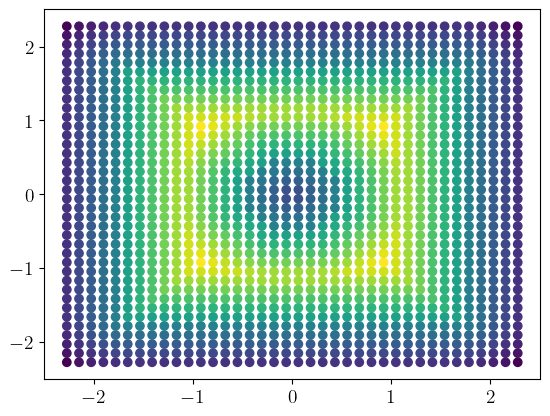

In [3]:
#####################################
### Make Signed Distance Function ###
#####################################

l = np.empty(hjb_grid.states.shape[:-1])

obs_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] != 0])
fre_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] == 0])

for i in range(n[0]):
    for j in range(n[1]):
        for k in range(n[2]):
            if obs_dict[tuple(np.round(np.array(hjb_grid.states[i, j, k, :-1]), 3))] != 0:
                l[i, j, k] = -np.min(np.linalg.norm(fre_coords - hjb_grid.states[i, j, k, :2], axis=1))
            else:
                l[i, j, k] =  np.min(np.linalg.norm(obs_coords - hjb_grid.states[i, j, k, :2], axis=1))

print(grid.shape)
print(l.shape)
plt.scatter(grid[:,0], grid[:,1], c=l[...,0].reshape(-1, 1))
plt.show()

In [4]:
############################
### Configure HJB Solver ###
############################

gamma  = 0.20
cbvf   = True
umax   = 0.40
utype  ="box"
V      = 0.10
l      = jnp.array(l)
values = l 
solver_settings = hj.SolverSettings.with_accuracy("very_high",
                                                  hamiltonian_postprocessor=hj.solver.backwards_reachable_tube,
                                                  value_postprocessor      =hj.solver.static_obstacle(l))

In [ ]:
####################################
### Solver PDE for final surface ###
####################################

dynamics = hj.systems.Bicycle(gamma=gamma, V=V, umax=umax)
time = 0.
target_time = -500
target_values = hj.step(solver_settings, dynamics, hjb_grid, time, values, target_time)

  8%|##5                             | 40.3300/500.0 [00:00<00:04, 96.17sim_s/s]

In [ ]:
##########################
### Plot final surface ###
##########################

plt.jet()
plt.figure(figsize=(13, 8))
plt.contourf(hjb_grid.coordinate_vectors[0], hjb_grid.coordinate_vectors[1], target_values[:, :, 0].T, levels=30)
plt.colorbar()
plt.contour(hjb_grid.coordinate_vectors[0],
            hjb_grid.coordinate_vectors[1],
            target_values[:, :, 0].T,
            levels=0,
            colors="black",
            linewidths=3)

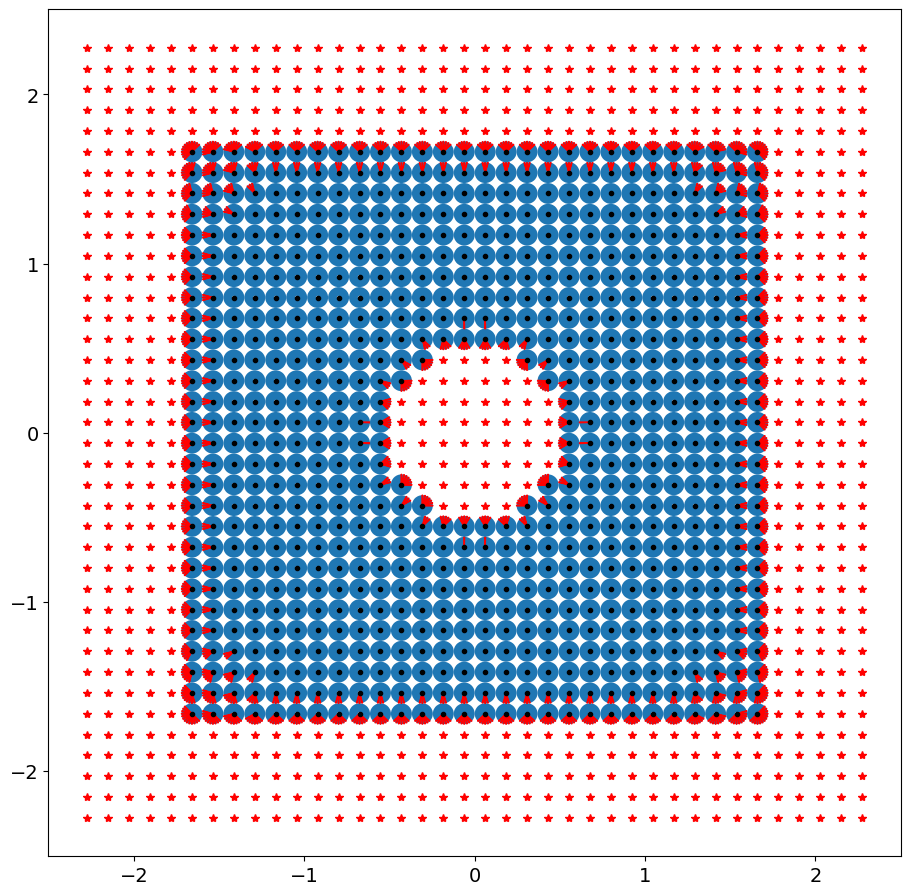

In [7]:
#######################################
### Plot V at each x,y using arrows ###
#######################################
ddegrees = 2

fig, ax = plt.subplots(figsize=(11,11))

plt.rc('xtick', labelsize=14)                                                
plt.rc('ytick', labelsize=14)                                                

for x in grid:                                                               
    if obs_dict[tuple(np.round(x, 3))] == 0:                               
        ax.plot(x[0], x[1], color="black", marker=".", linestyle="none")   
        A = pat.Annulus(x, spacing/2, spacing/2-0.01)
        ax.add_patch(A)
        pt = np.array([x[0], x[1], 0])
        idx = hjb_grid.nearest_index(pt)[:2]
        for i, Vtheta in enumerate(target_values[idx[0], idx[1]]):
            theta = hjb_grid.states[idx[0], idx[1], i][-1]
            if Vtheta <= 0:
                B = pat.Wedge(x, spacing/2, 360/(2*np.pi)*theta - ddegrees, 360/(2*np.pi)*theta + ddegrees, width=spacing/2, color='r')  
                ax.add_patch(B)
            #else:
            #    B = pat.Wedge(  x, s/2, 360/(2*np.pi)*theta - 1, 360/(2*np.pi)*theta + 1, width=s/2, color='b')  
            #    ax.add_patch(B)
    else:
        ax.plot(x[0], x[1], color="red"   , marker="*", linestyle="none") 

plt.show()

In [8]:
##############################
### Plot V(x, y, theta(t)) ###
##############################

vmin, vmax = target_values.min(), target_values.max()
levels = np.linspace(round(vmin), round(vmax), 5*(round(vmax) - round(vmin) + 1))
fig = plt.figure(figsize=(13, 8))

def render_frame(i, colorbar=False):
    plt.contourf(hjb_grid.coordinate_vectors[0],
                 hjb_grid.coordinate_vectors[1],
                 target_values[:, :, i].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.contour(hjb_grid.coordinate_vectors[0],
                hjb_grid.coordinate_vectors[1],
                target_values[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, target_values.shape[-1], interval=50).to_html5_video())
plt.close(); animation

In [9]:
##########################################
### Solve for backwards reachable tube ###
##########################################

times = np.linspace(0, -500, 100)
initial_values = l
all_values = hj.solve(solver_settings, dynamics, hjb_grid, times, initial_values)

100%|##############################| 500.0000/500.0 [00:04<00:00, 107.52sim_s/s]


In [10]:
##########################################
### Visualize backwards reachable tube ###
##########################################

vmin, vmax = all_values.min(), all_values.max()
levels = np.linspace(round(vmin), round(vmax), 15*(round(vmax) - round(vmin) + 1))
fig = plt.figure(figsize=(13, 8))

def render_frame(i, colorbar=False):
    plt.contourf(hjb_grid.coordinate_vectors[0],
                 hjb_grid.coordinate_vectors[1],
                 all_values[i, :, :, 10].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    if colorbar:
        plt.colorbar()
    plt.contour(hjb_grid.coordinate_vectors[0],
                hjb_grid.coordinate_vectors[1],
                target_values[:, :, 10].T,
                levels=0,
                colors="black",
                linewidths=3)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, all_values.shape[0], interval=50).to_html5_video())
plt.close(); animation

In [11]:
###########################
### Agent Configuration ###
###########################

bf    = 31    # csrbf order
b     =-0.5 #-0.5 #-0.5   # offset (-0.5)
s     = 1.00#1.00  #0.75# csrbf zeroing
nm    = 0.20  # nm * n_safe = number of neighbors to consider
pct   = 0.40  # num neighber percentile under which boundary
mult  = 4
utype = utype # defined w/ hjb above
umax  = umax  # defined w/ hjb above
gamma = gamma # defined w/ hjb above
jax_f = True
solver        ='CLARABEL'
sensor_radius = 1.1
rx            = sensor_radius + 0.2 # sample radius
rc            = sensor_radius # radius around scan in which centers are chosen
init_x        =-1.1
init_y        =-1.1
init_theta    = 0

# CHECK GAMMA -> 1/GAMMA
a = Agent(dynamics, np.array([init_x, init_y, init_theta]), grid, obs_dict, width         = width, 
                                                                            sensor_radius = sensor_radius,
                                                                            bf            = bf, 
                                                                            b             = b, 
                                                                            s             = s,
                                                                            utype         = utype,
                                                                            umax          = umax,
                                                                            gamma         = gamma,
                                                                            jax_f         = jax_f,
                                                                            solver        = solver,
                                                                            spacing       = spacing,
                                                                            obstacles     = obstacles)

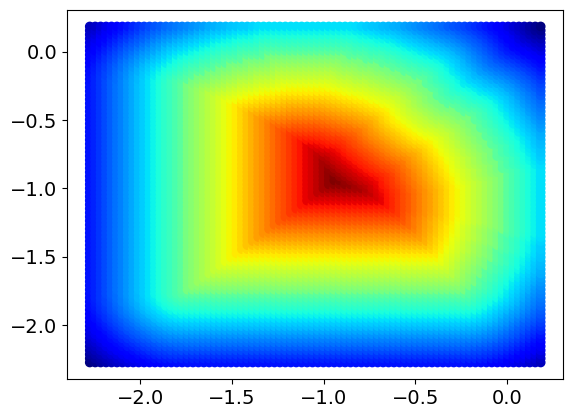

100%|###############################| 500.0000/500.0 [00:38<00:00, 12.83sim_s/s]


<Figure size 640x480 with 0 Axes>

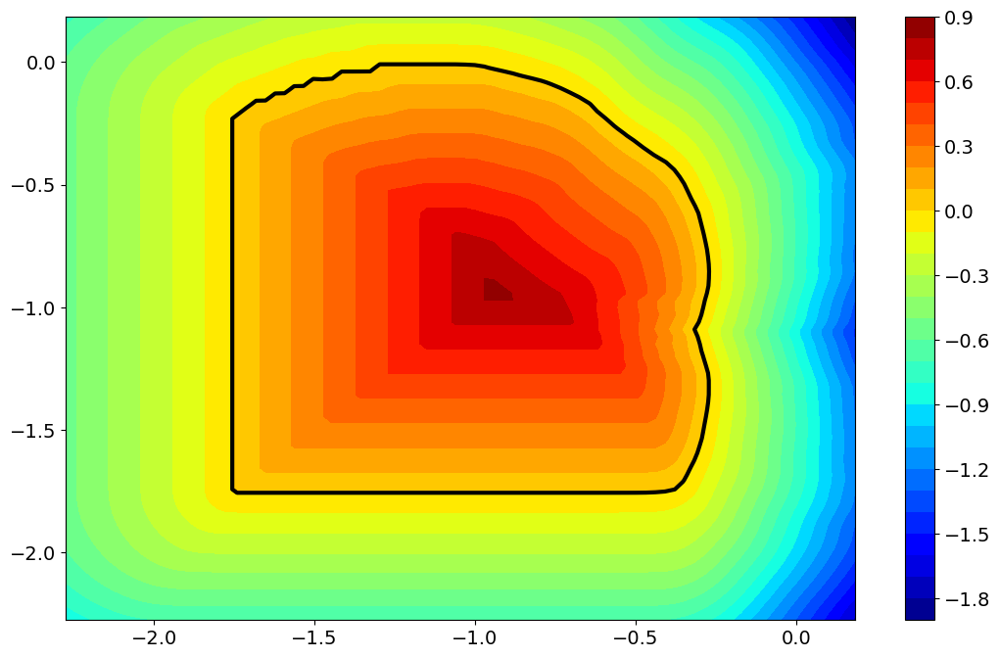

In [12]:
####################
### Initial scan ###
####################

# scan states 
pts_safe, pts_unsafe,\
             in_scan_f = a.scan(ret_in_scan_f=True) 
scan_funcs = [in_scan_f]
samples, gparams,\
is_obs_sample, x2pi_samp, x0_samp = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True, bicycle=True, boundary_condition=True)
sample_funcs = [is_obs_sample]
loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], thn, rx=rx, T=500, mult=mult)

In [13]:
vmin, vmax = loc_V.min(), loc_V.max()
#levels = np.linspace(round(vmin), round(vmax), 10*(round(vmax) - round(vmin) + 1))
levels = np.linspace(vmin, vmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(loc_hjb_grid.coordinate_vectors[0],
                 loc_hjb_grid.coordinate_vectors[1],
                 loc_V[:, :, i].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.contour(loc_hjb_grid.coordinate_vectors[0],
                loc_hjb_grid.coordinate_vectors[1],
                loc_V[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, loc_V.shape[-1], interval=50).to_html5_video())
plt.close()
animation

In [14]:
scan_safe, scan_unsafe,\
x2pi_scan, x0_scan = a.scan_hjb(loc_V, loc_hjb_grid, bicycle=True, boundary_condition=True)
n_safe             = len(scan_safe) #len(pts_safe)
x_buffer, x_safe   = a.make_buffer(scan_safe, int(nm * n_safe), pct, bicycle=True)

x2pi = np.vstack((x2pi_samp, x2pi_scan))
x0   = np.vstack((x0_samp, x0_scan))

# unsafe states 
if scan_unsafe.shape[0] != 0:
    x_unsafe = np.vstack((scan_unsafe, samples))
else: 
    x_unsafe = samples    

counts [408 405 408 ... 489 464 443]
pct 0.4


In [15]:
#######################
### Collect centers ###
#######################

C = []
for x in c_grid:
    if np.linalg.norm(x[:2] - a.pos[:2]) <= rc:
        C.append(x)
C = np.array(C)

tmp = []
for p in C:
    c = np.repeat(p.reshape(1, -1), hjb_grid.states.shape[2], axis=0)
    c = np.hstack((c, np.array(hjb_grid.coordinate_vectors[2]).reshape(-1, 1)))
    cend = np.array([p[0], p[1], 2*np.pi]).astype(np.float32)
    tmp.append(np.vstack((c,cend)))
C = np.vstack(tmp) 

a.centers.append(C)

dx = params[-1]
dth = abs(loc_hjb_grid.states[0,0,0,2]-hjb_grid.states[0,0,1,2])
print("ratio of subsequent theta gridpt dist to csrbf zeroing dist:\n",s/dth)
print("ratio of subsequent x gridpt dist to csrbf zeroing dist:\n",s/dx)
for i in range(2):
    print("X_" + str(i) + " GRID INFORMATION\n", 
          "domain: [", loc_hjb_grid.domain.lo[i], ",", loc_hjb_grid.domain.hi[i], "]\n", 
          "n:", (loc_hjb_grid.domain.hi[i] - loc_hjb_grid.domain.lo[i]) / spacing,"\n", 
          "density:", hjb_grid.states.shape[i]/(hjb_grid.domain.hi[i]-hjb_grid.domain.lo[i]))
print("X_" + str(2) + " GRID INFORMATION\n", 
      "domain: [", hjb_grid.domain.lo[2], ",", hjb_grid.domain.hi[2], "]\n", 
      "n:", (hjb_grid.domain.hi[2] - hjb_grid.domain.lo[2]) / spacing,"\n", 
      "density:", hjb_grid.states.shape[2]/(hjb_grid.domain.hi[2]-hjb_grid.domain.lo[2]))

sth = s/dx * dth
print("theta zeroing dist should be:", sth)
print("ratio of subsequent theta gridpt dist to modified csrbf zeroing dist:\n",sth/dth)
theta_scale = (n[2] * (hi[0] - lo[0])) / (n[0] * 2*np.pi)
print(theta_scale)
a.theta_scale = theta_scale / 1
print(a.theta_scale)
#1 / 2*np.pi 

#from optim import get_phiT
#phi = get_phiT(a)
#phi(np.array([0, 0, 0]), C)

ratio of subsequent theta gridpt dist to csrbf zeroing dist:
 3.8197186
ratio of subsequent x gridpt dist to csrbf zeroing dist:
 8.131868131868133
X_0 GRID INFORMATION
 domain: [ -2.275 , 0.18445946 ]
 n: 20.0 
 density: 8.351648351648352
X_1 GRID INFORMATION
 domain: [ -2.275 , 0.18445946 ]
 n: 20.0 
 density: 8.351648351648352
X_2 GRID INFORMATION
 domain: [ 0 , 6.283185307179586 ]
 n: 51.09403436607576 
 density: 3.819718634205488
theta zeroing dist should be: 2.1289182
ratio of subsequent theta gridpt dist to modified csrbf zeroing dist:
 8.131868
0.457361046990394
0.457361046990394


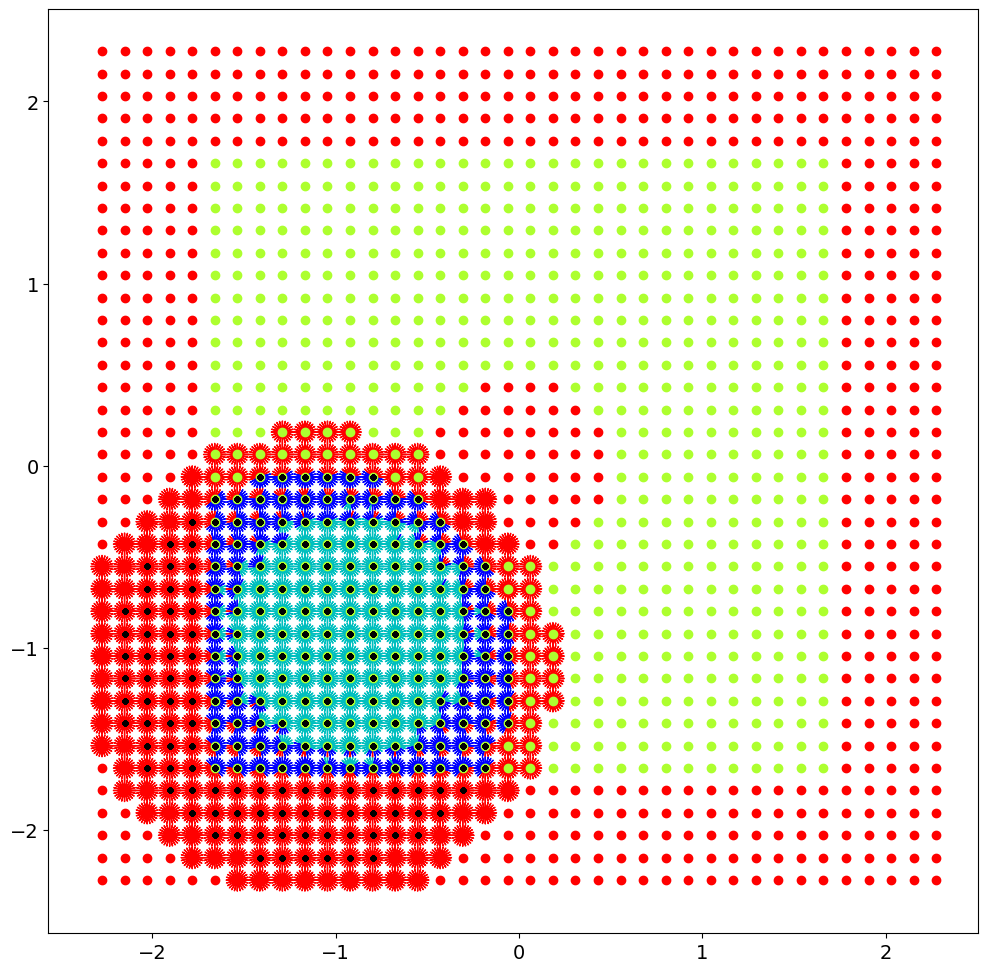

In [16]:
#############################
### Plot Initial CBF data ###
#############################

plot_angle_data(C, grid, obs_dict, spacing, safe=x_safe, buffer=x_buffer, unsafe=scan_unsafe, samples=samples)

In [17]:
###########################################
### Obtain controls from Value Function ###
###########################################

from tqdm import tqdm

u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
else:
    u_buffer = np.array([]) 

'''
u_buffer = []
for x in tqdm(x_buffer):
    u_buffer.append(hjb_controls(a, x, loc_hjb_grid, loc_V))
u_buffer = np.array(u_buffer)

u_safe = []
for x in tqdm(x_safe):
    u_safe.append(hjb_controls(a, x, loc_hjb_grid, loc_V))
u_safe = np.array(u_safe)
'''

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Aug 21 08:32:38 AM: Your problem has 2292 variables, 1 constraints, and 0 parameters.
(CVXPY) Aug 21 08:32:38 AM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Aug 21 08:32:38 AM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Aug 21 08:32:38 AM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Aug 21 08:32:38 AM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Aug 21 08:32:38 AM: Compiling problem (target solver=CLARABEL)

'\nu_buffer = []\nfor x in tqdm(x_buffer):\n    u_buffer.append(hjb_controls(a, x, loc_hjb_grid, loc_V))\nu_buffer = np.array(u_buffer)\n\nu_safe = []\nfor x in tqdm(x_safe):\n    u_safe.append(hjb_controls(a, x, loc_hjb_grid, loc_V))\nu_safe = np.array(u_safe)\n'

In [21]:
##############################
### Initial CBF Parameters ###
##############################
    
gamma_safe   = 0.3#0.3
gamma_unsafe =-0.3#-0.3
gamma_dyn    = 0.01#0.1
lam_safe     = 1
lam_dyn      = 0.1
lam_unsafe   = 1
lam_dh       = 1e-4#0.0
lam_th       = 0.0
lam_sp       = 0

In [22]:

print(loc_hjb_grid.states.shape)
print(loc_V.shape)
print(loc_hjb_grid.interpolate(loc_V, C[0]))




(84, 84, 24, 3)
(84, 84, 24)
-0.41040382


[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10


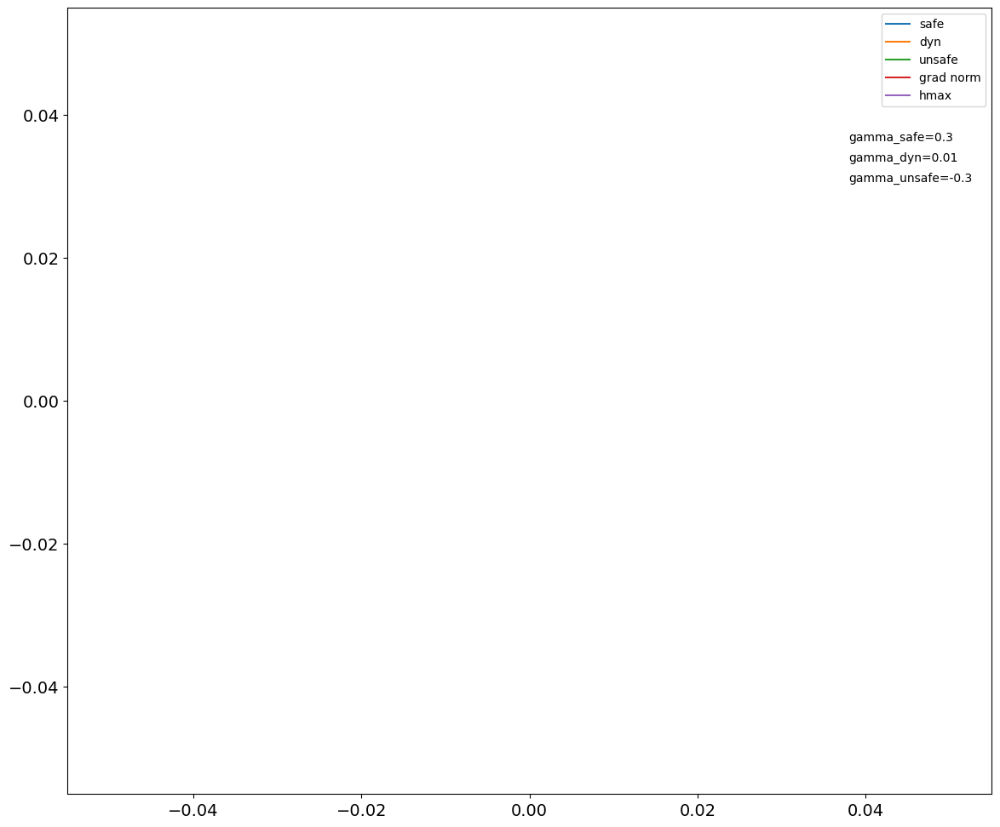

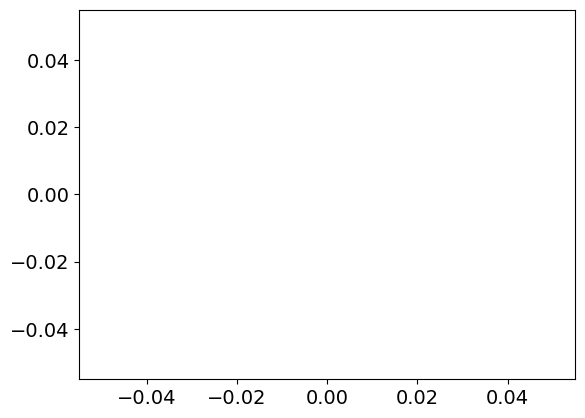

position is [-1.1 -1.1  0. ]
start time is 1600


 78%|██████████████████████████████▎        | 3113/4000 [04:52<01:27, 10.11it/s]

val [0.4        0.00156742] max 0.4
val [0.4        0.00111196] max 0.4


 98%|██████████████████████████████████████ | 3901/4000 [06:14<00:11,  8.41it/s]

val [0.4        0.00158079] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:25<00:00, 10.37it/s]

### PLOTTING h(x(t)) ###


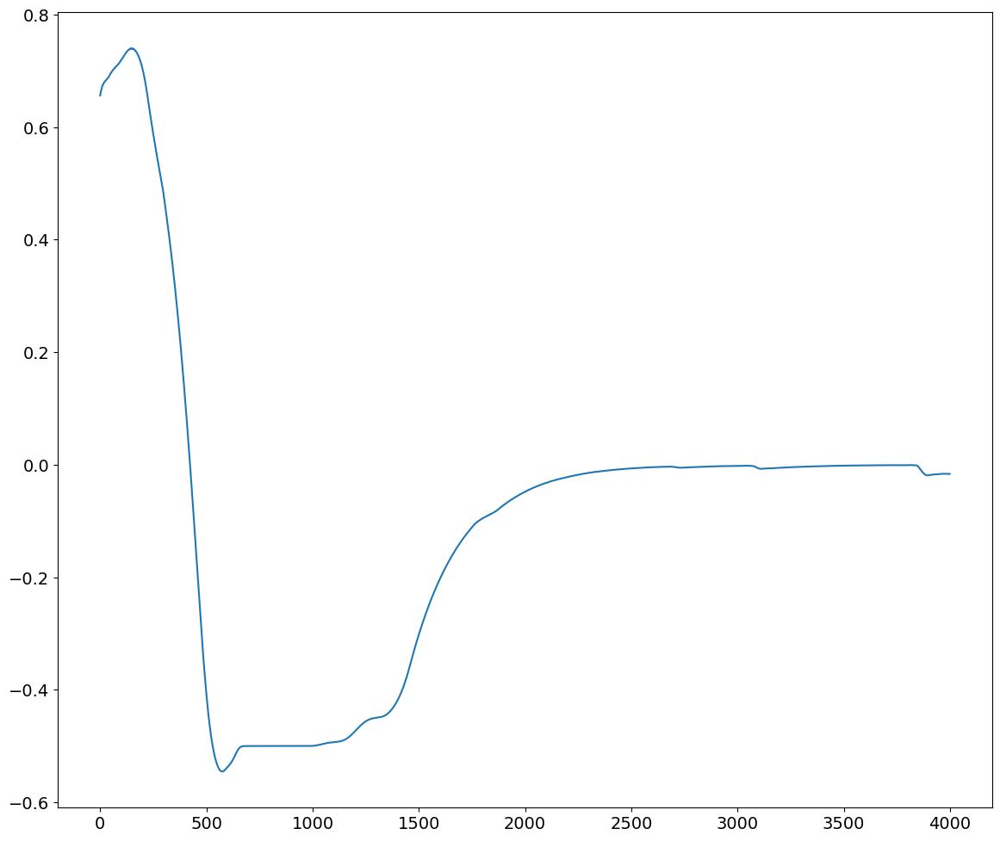

### PLOTTING CONTROL SIGNAL ###


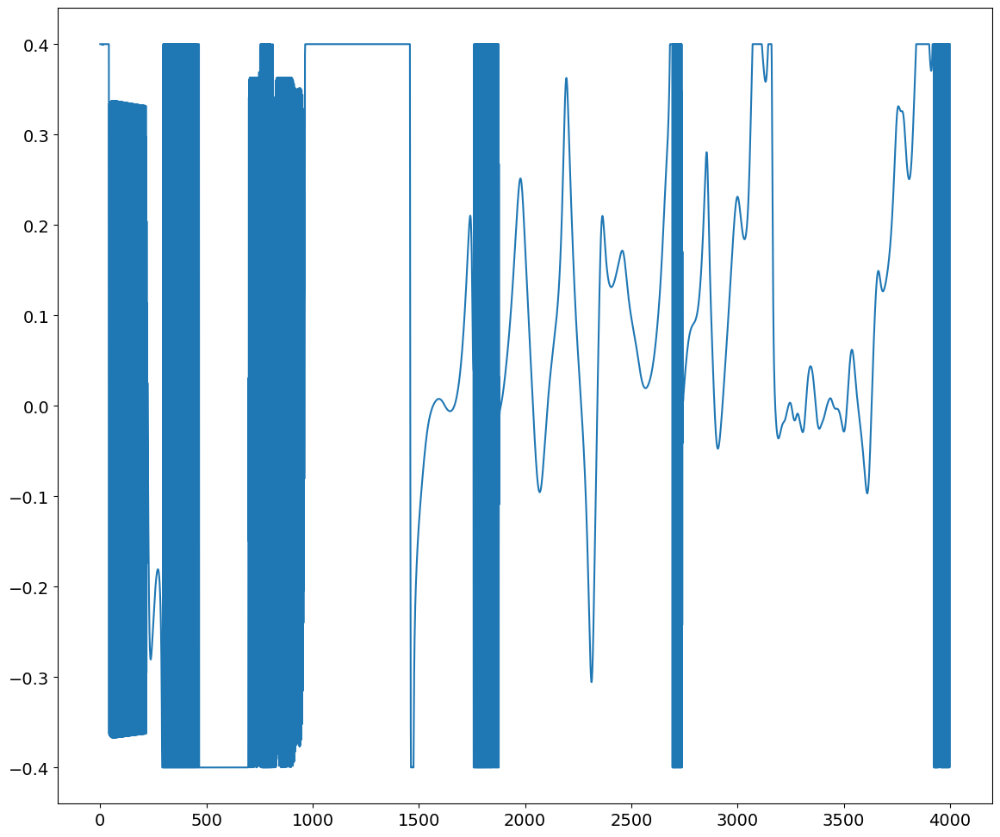

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:19<00:00,  3.08it/s]


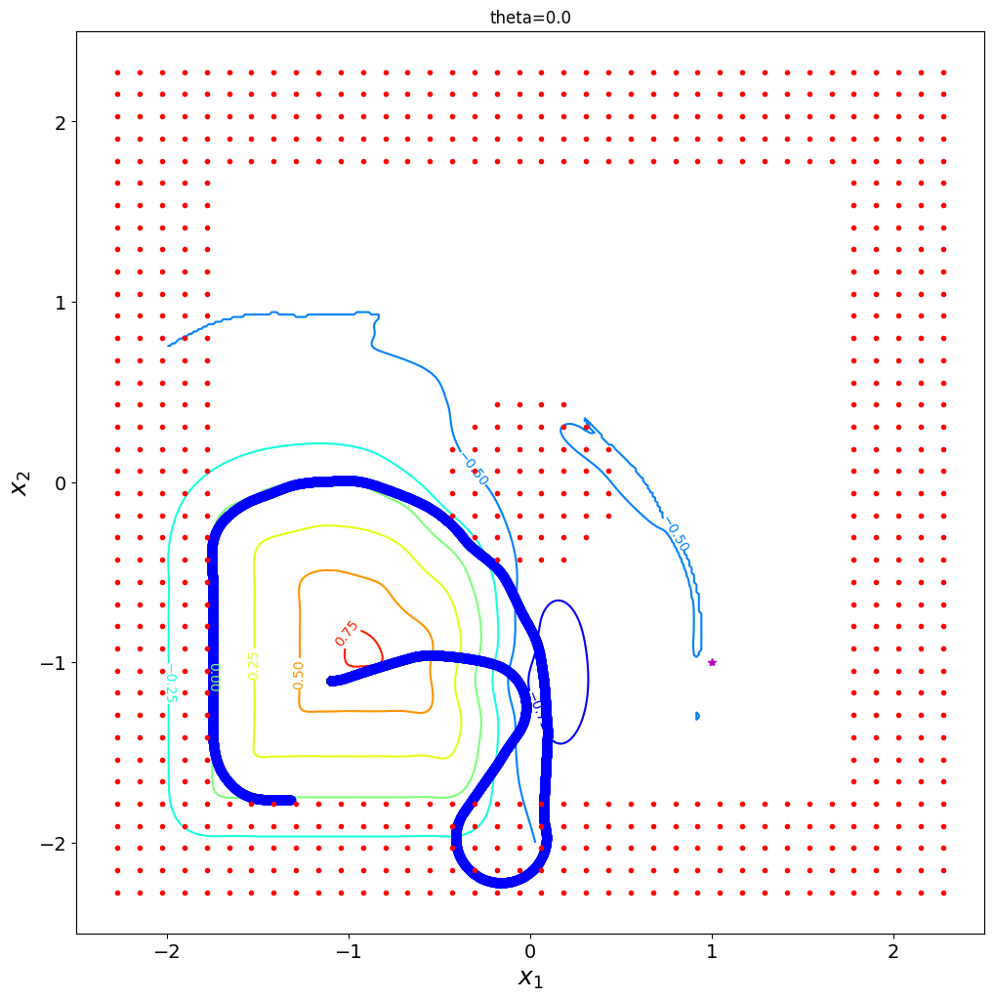

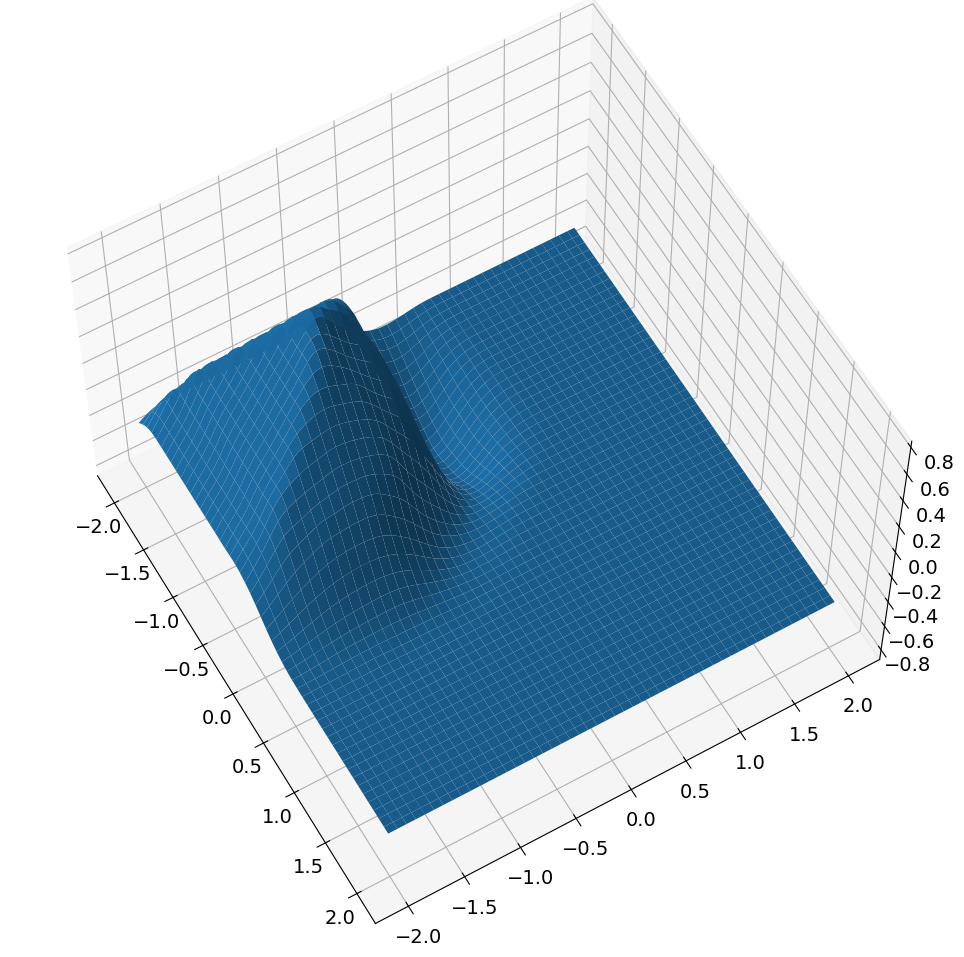

max h 0.8100009
percent violation: 0.37325
new position is [-1.1 -1.1  0. ]
new time is 1680
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019


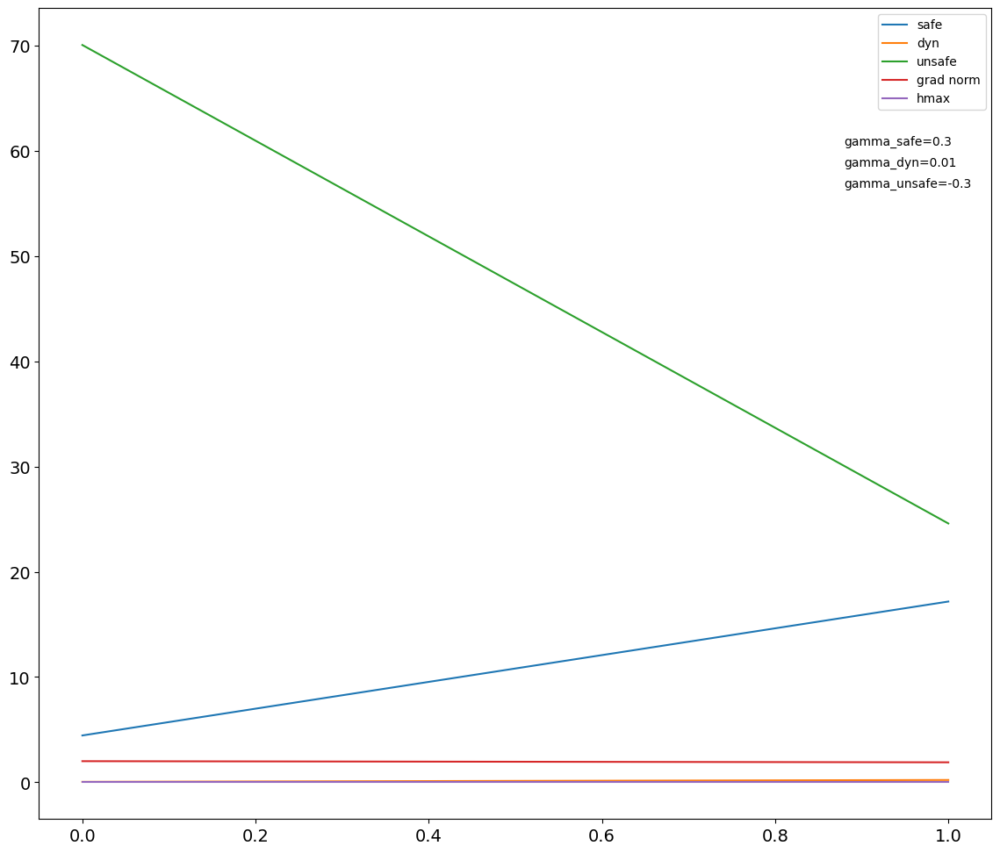

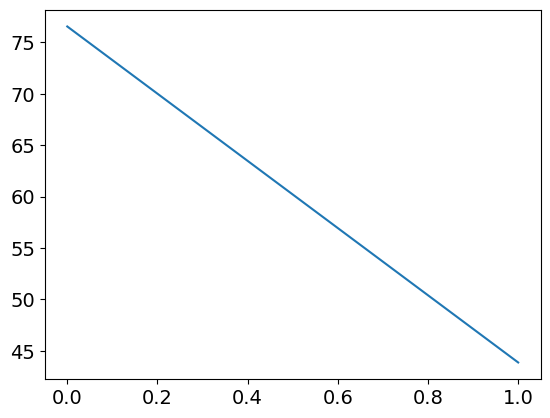

position is [-1.1 -1.1  0. ]
start time is 1680


100%|███████████████████████████████████████| 4000/4000 [06:58<00:00,  9.55it/s]


### PLOTTING h(x(t)) ###


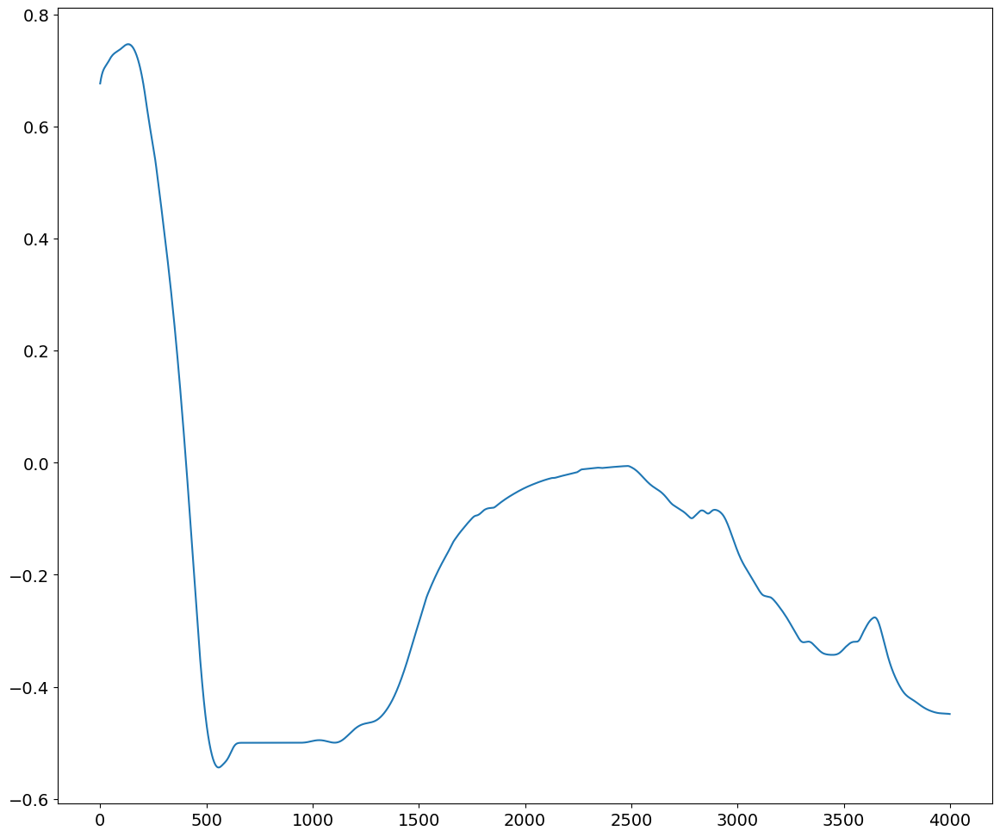

### PLOTTING CONTROL SIGNAL ###


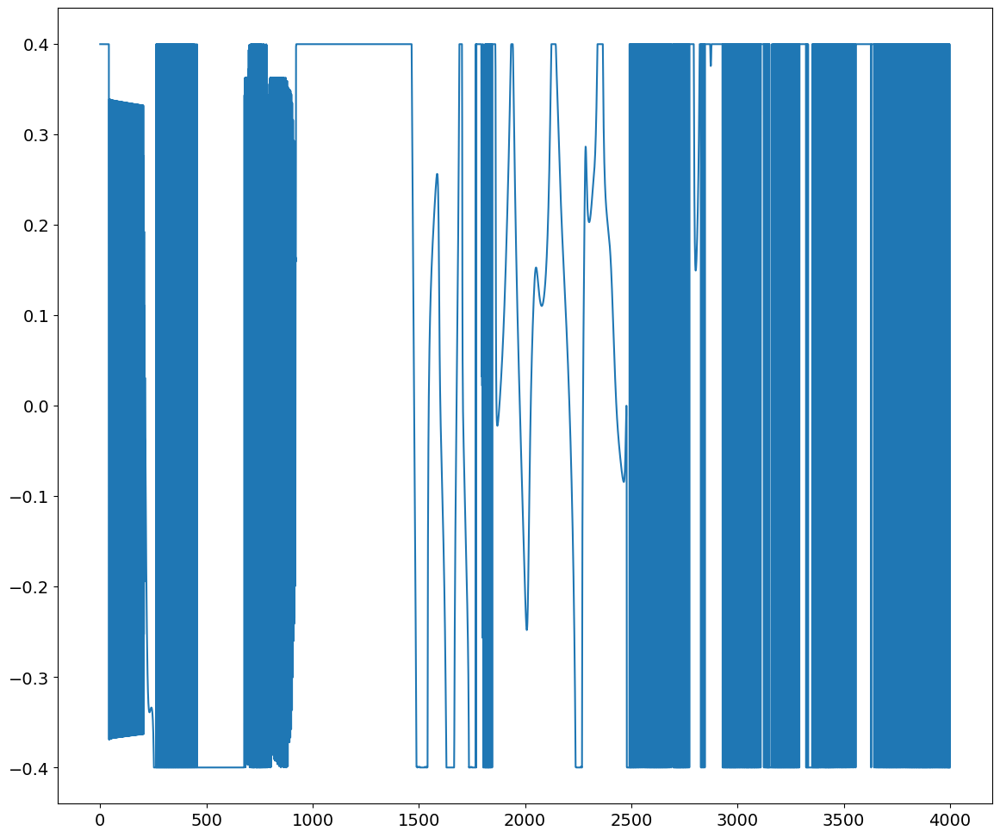

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:19<00:00,  3.01it/s]


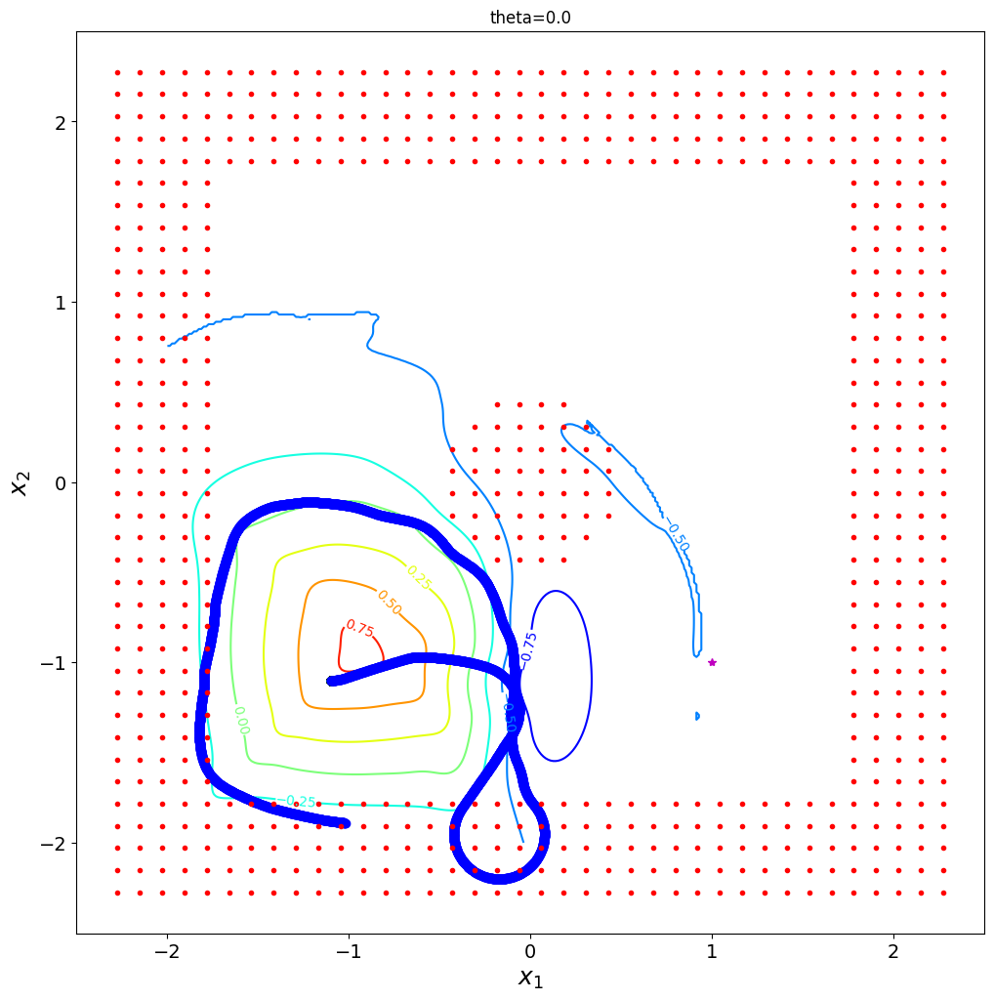

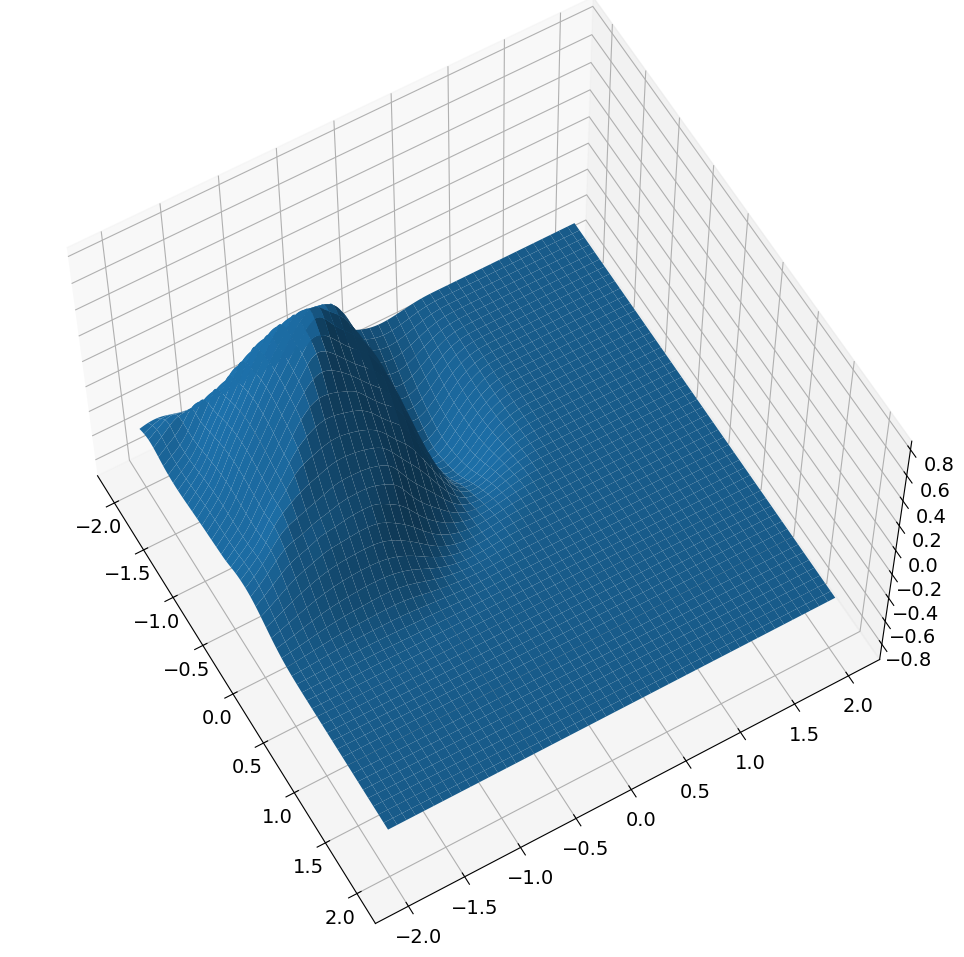

max h 0.8290374
percent violation: 0.708
new position is [-1.1 -1.1  0. ]
new time is 1760
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019


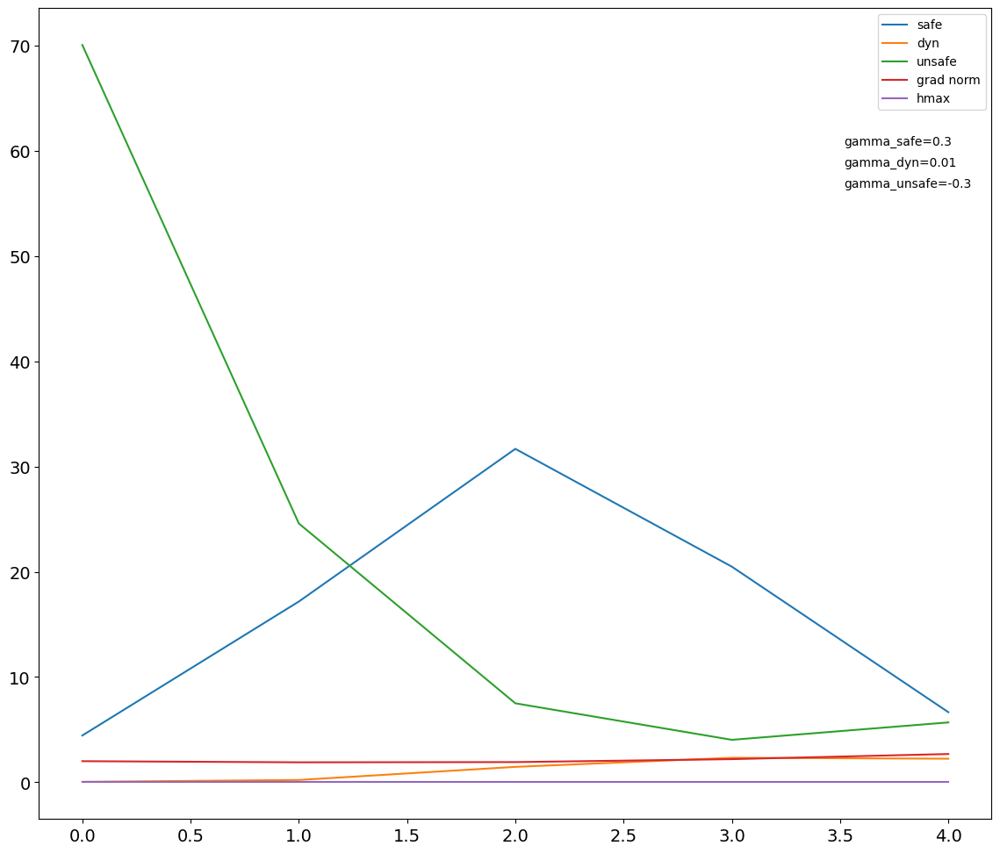

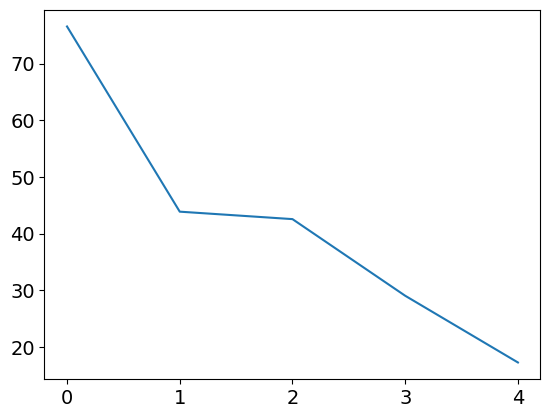

position is [-1.1 -1.1  0. ]
start time is 1760


  6%|██▎                                     | 237/4000 [00:25<08:35,  7.29it/s]

val [0.4        0.00074754] max 0.4
val [0.4        0.00150813] max 0.4


 26%|██████████                             | 1030/4000 [01:46<03:41, 13.39it/s]

val [0.4        0.00131363] max 0.4


 26%|██████████▎                            | 1054/4000 [01:48<03:45, 13.05it/s]

val [0.4        0.00166093] max 0.4


 91%|███████████████████████████████████▌   | 3647/4000 [06:07<00:31, 11.13it/s]

val [0.4        0.00132791] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:45<00:00,  9.87it/s]


### PLOTTING h(x(t)) ###


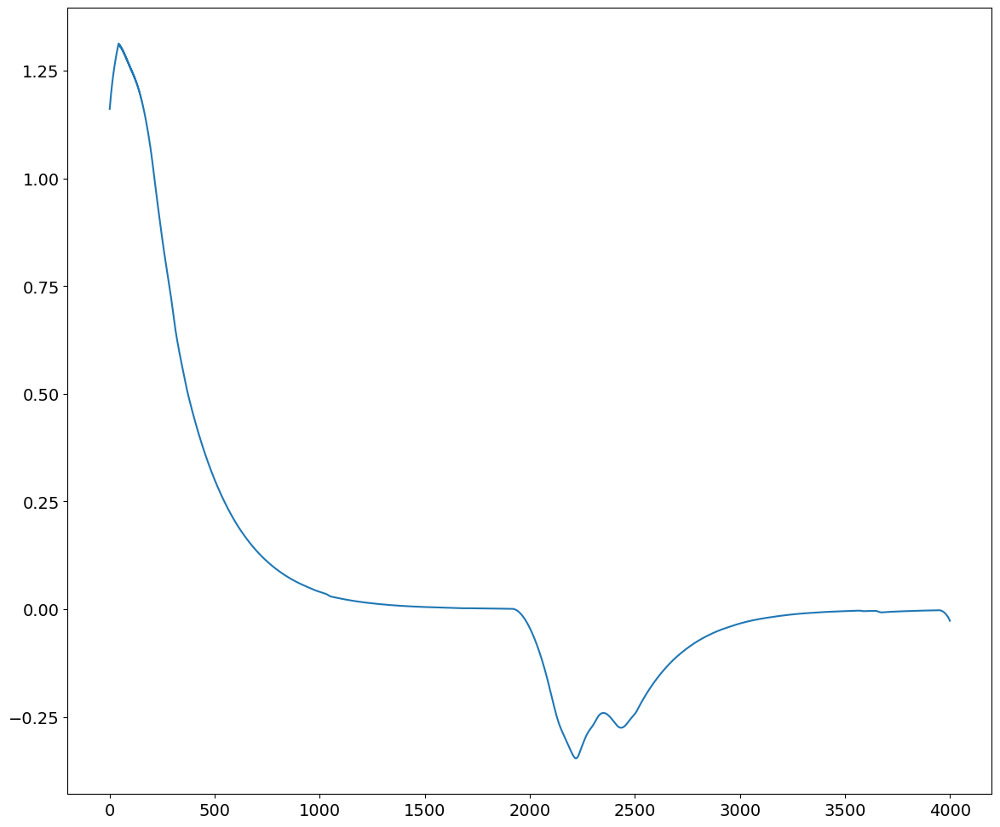

### PLOTTING CONTROL SIGNAL ###


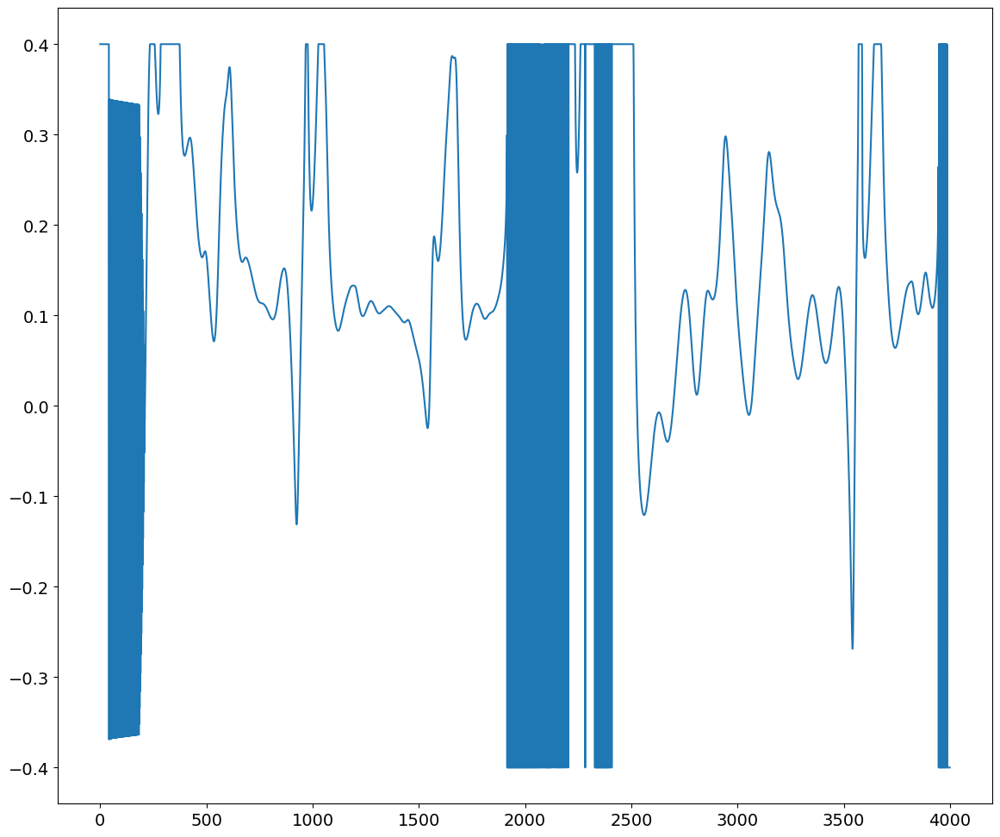

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:19<00:00,  3.04it/s]


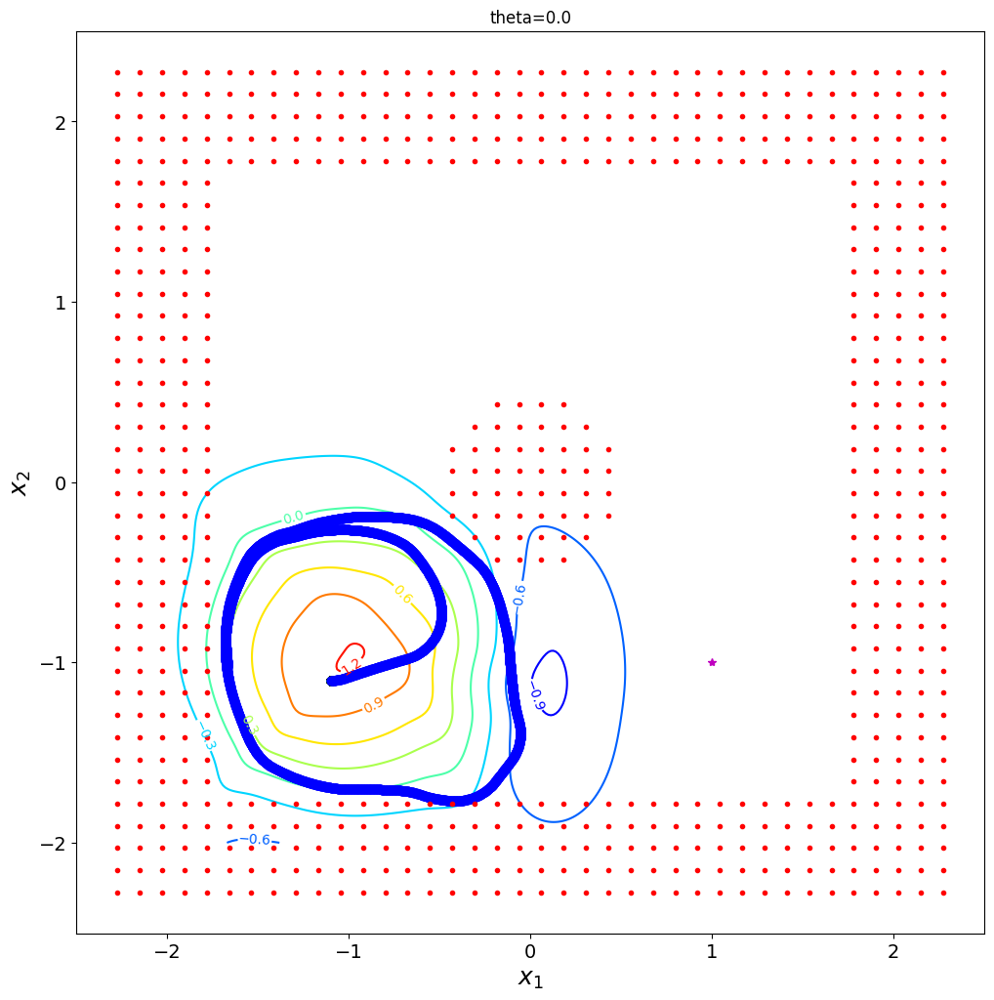

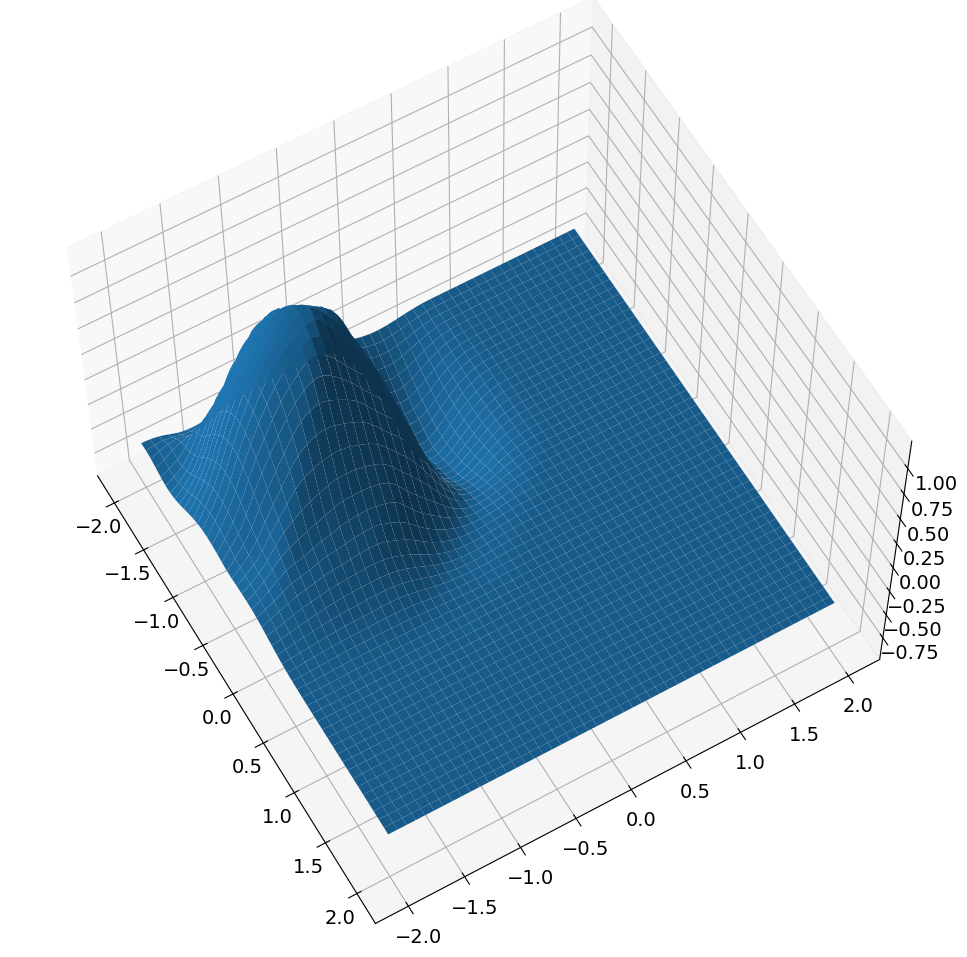

max h 1.2186375
percent violation: 0.20175
new position is [-1.1 -1.1  0. ]
new time is 1840
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019


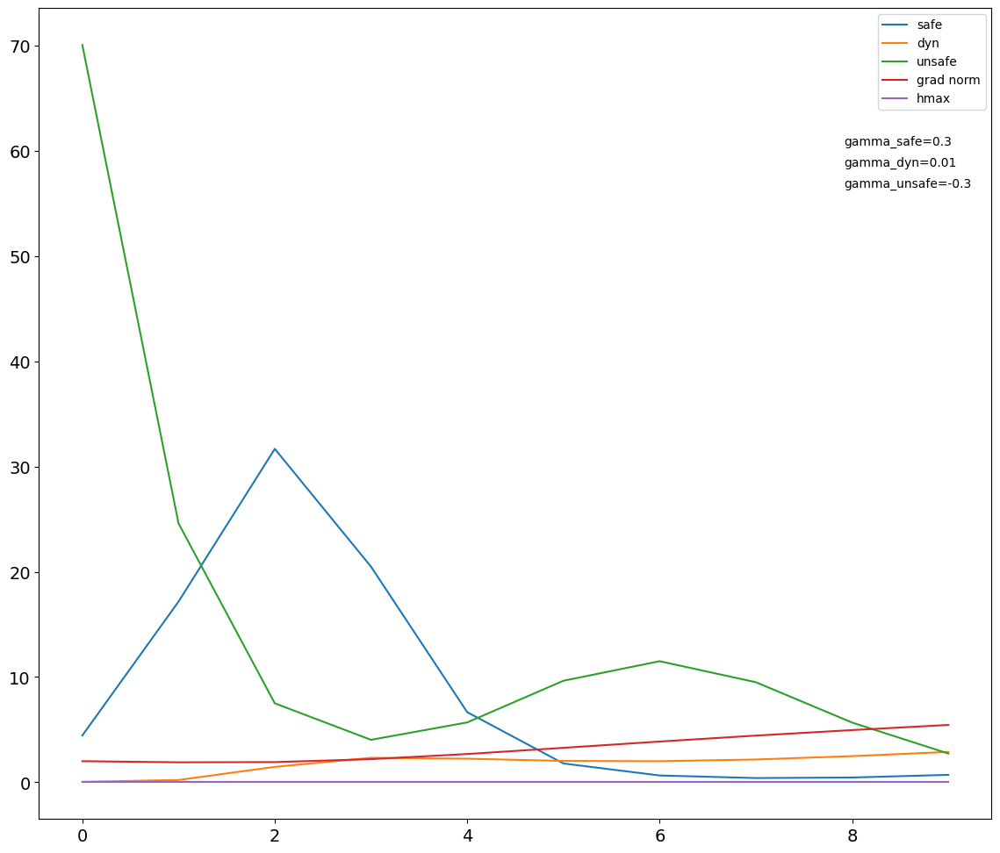

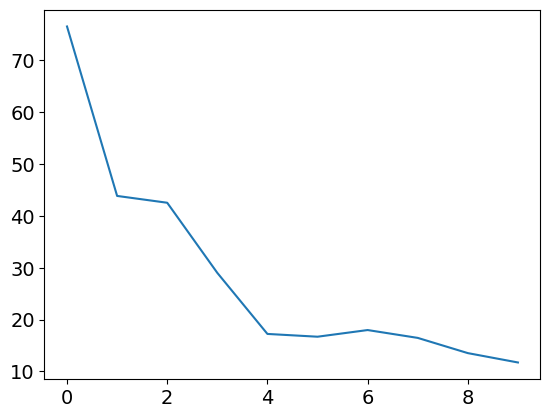

position is [-1.1 -1.1  0. ]
start time is 1840


  7%|██▉                                     | 288/4000 [00:26<06:49,  9.07it/s]

val [0.4       0.0106236] max 0.4
val [0.4        0.01525697] max 0.4
val [0.4        0.02041722] max 0.4


  7%|██▉                                     | 292/4000 [00:26<05:44, 10.75it/s]

val [0.4        0.02607974] max 0.4
val [0.4        0.03217627] max 0.4
val [0.4        0.03855734] max 0.4


  7%|██▉                                     | 294/4000 [00:27<05:46, 10.70it/s]

val [0.4        0.04499717] max 0.4
val [0.4        0.05123064] max 0.4
val [0.4       0.0570391] max 0.4


  7%|██▉                                     | 298/4000 [00:27<05:42, 10.82it/s]

val [0.4        0.06228798] max 0.4


  8%|███▎                                    | 326/4000 [00:30<05:31, 11.08it/s]

val [0.4        0.05631922] max 0.4
val [0.4        0.05502164] max 0.4
val [0.4        0.05379986] max 0.4


  8%|███▎                                    | 328/4000 [00:30<05:25, 11.28it/s]

val [0.4       0.0526486] max 0.4


  8%|███▎                                    | 330/4000 [00:30<08:25,  7.25it/s]

val [0.4        0.05155894] max 0.4
val [0.4        0.05051945] max 0.4
val [0.4        0.04952079] max 0.4


  8%|███▎                                    | 334/4000 [00:31<06:34,  9.30it/s]

val [0.4        0.04855508] max 0.4
val [0.4        0.04761277] max 0.4
val [0.4        0.04668792] max 0.4


  8%|███▎                                    | 336/4000 [00:31<06:03, 10.08it/s]

val [0.4        0.04577742] max 0.4
val [0.4        0.04487794] max 0.4
val [0.4        0.04398938] max 0.4


  8%|███▍                                    | 340/4000 [00:31<05:41, 10.73it/s]

val [0.4        0.04311406] max 0.4
val [0.4        0.04225559] max 0.4
val [0.4        0.04141497] max 0.4


  9%|███▍                                    | 342/4000 [00:31<05:30, 11.07it/s]

val [0.4        0.04060172] max 0.4


 10%|███▊                                    | 384/4000 [00:35<04:54, 12.29it/s]

val [0.4        0.00091541] max 0.4


100%|███████████████████████████████████████| 4000/4000 [05:54<00:00, 11.28it/s]


### PLOTTING h(x(t)) ###


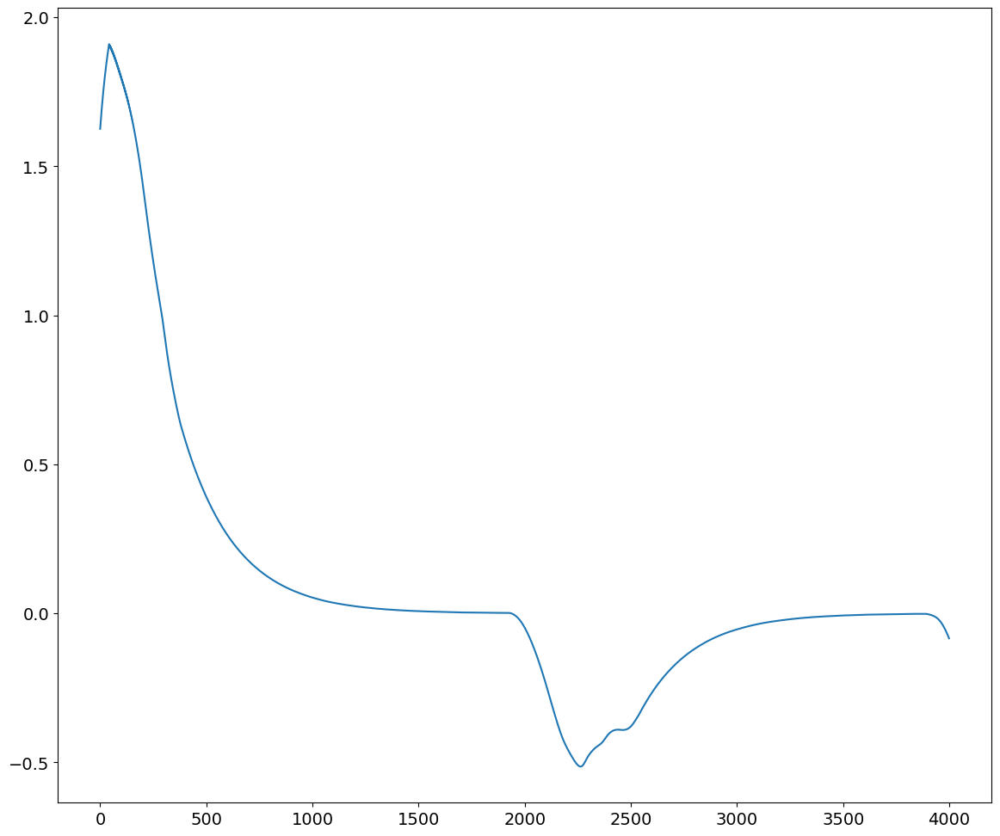

### PLOTTING CONTROL SIGNAL ###


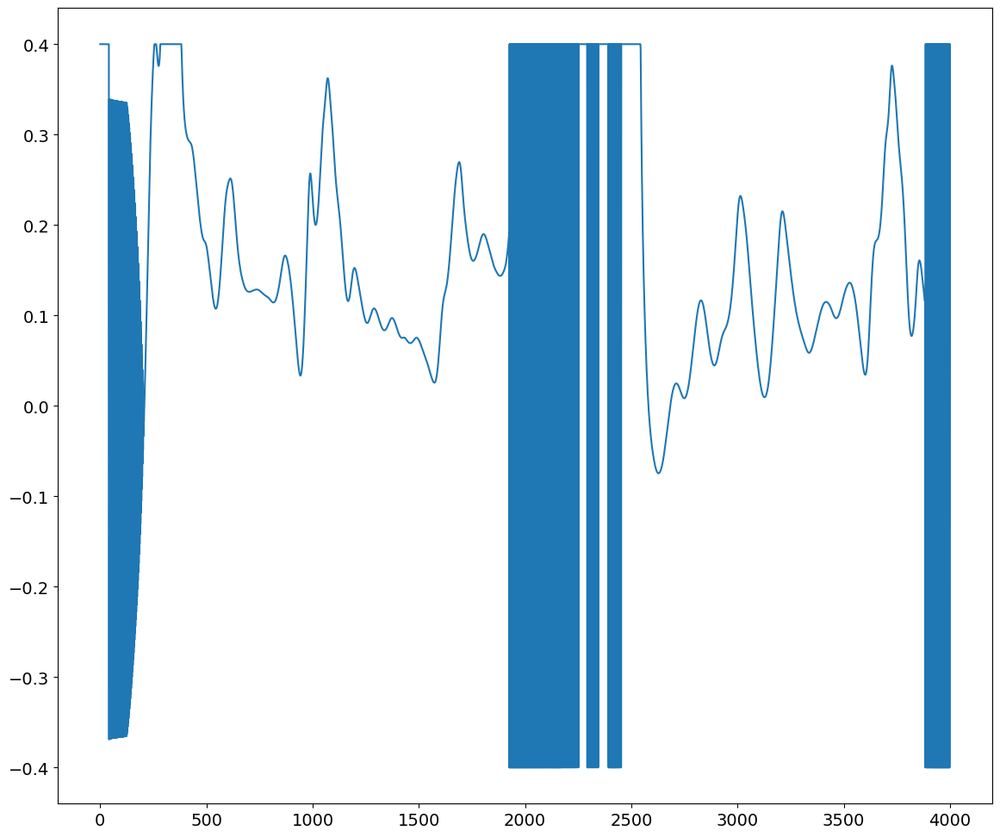

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.47it/s]


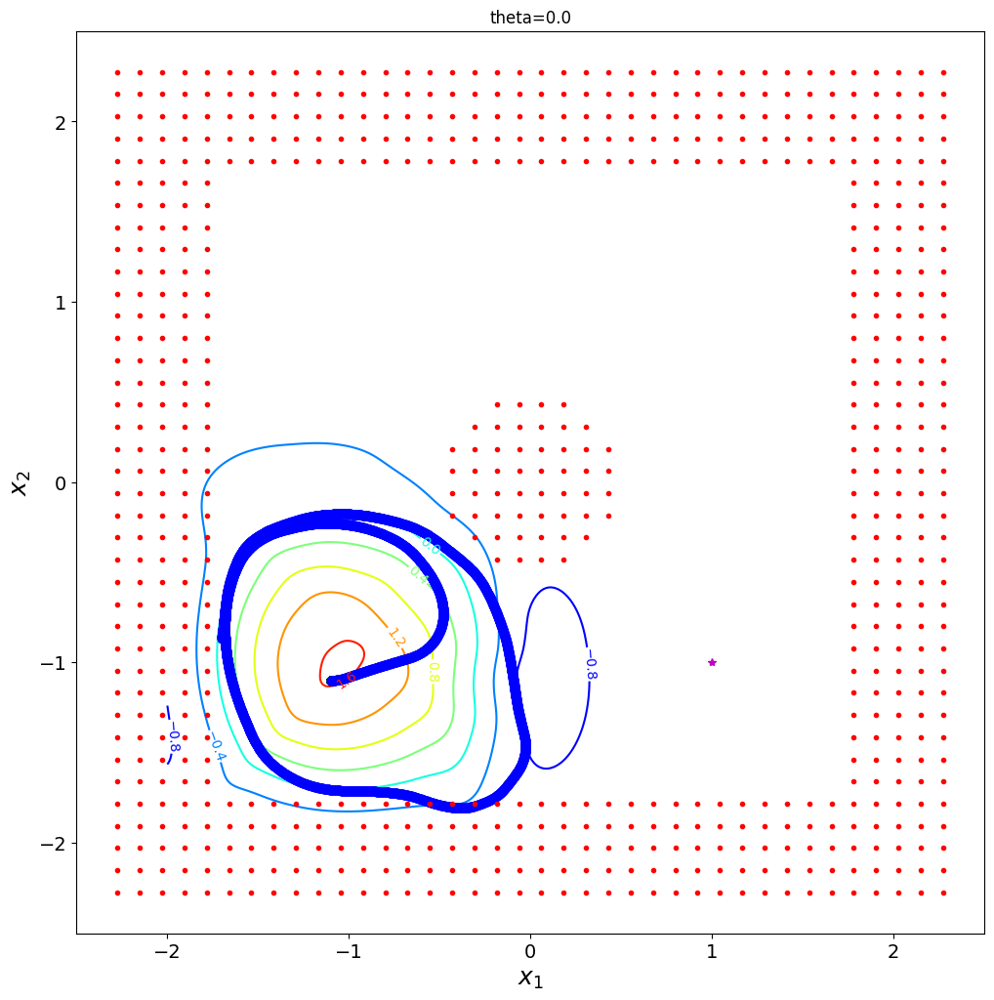

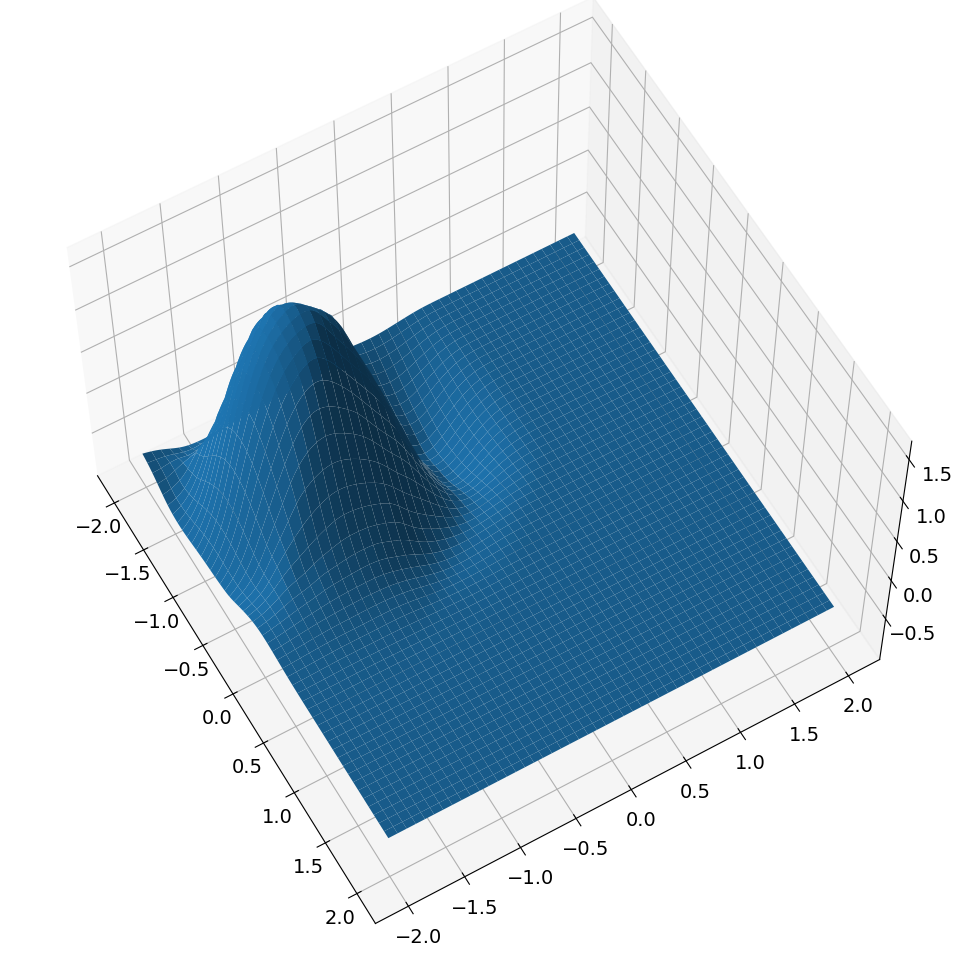

max h 1.6610312
percent violation: 0.20825
new position is [-1.1 -1.1  0. ]
new time is 1920
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278


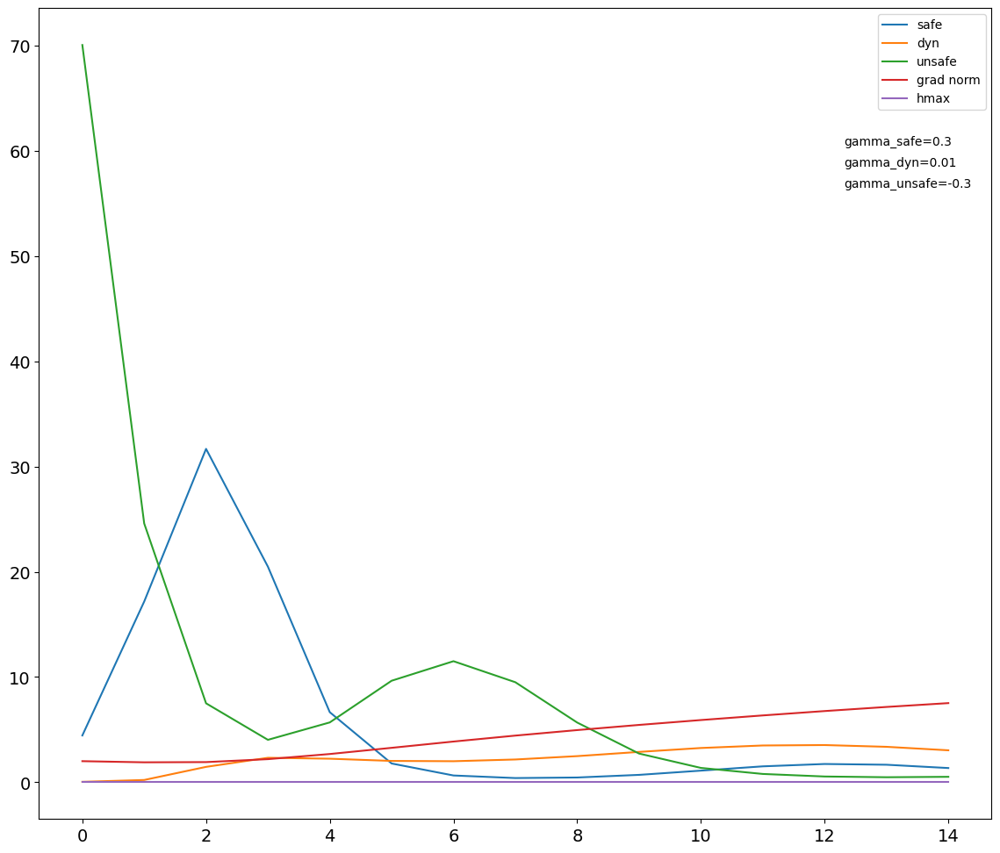

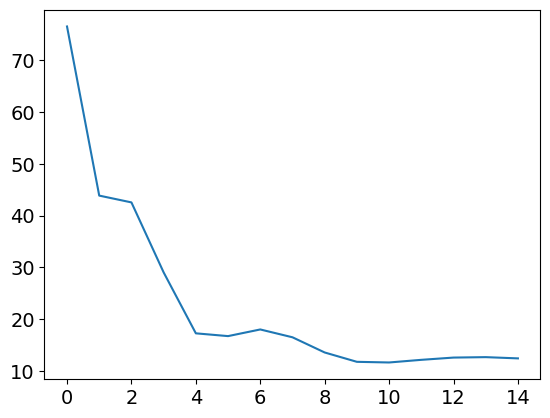

position is [-1.1 -1.1  0. ]
start time is 1920


  7%|██▉                                     | 294/4000 [00:28<05:17, 11.66it/s]

val [0.4        0.00402839] max 0.4
val [0.4        0.00875494] max 0.4
val [0.4        0.01392063] max 0.4


  7%|██▉                                     | 296/4000 [00:28<05:06, 12.07it/s]

val [0.4        0.01949727] max 0.4
val [0.4        0.02541852] max 0.4
val [0.4        0.03157746] max 0.4


  8%|███                                     | 300/4000 [00:29<07:14,  8.51it/s]

val [0.4        0.03782559] max 0.4
val [0.4        0.04398547] max 0.4
val [0.4        0.04988581] max 0.4


  8%|███                                     | 302/4000 [00:29<06:28,  9.52it/s]

val [0.4        0.05538589] max 0.4
val [0.4        0.06039062] max 0.4
val [0.4        0.06485291] max 0.4


  8%|███                                     | 306/4000 [00:29<05:39, 10.87it/s]

val [0.4        0.06875669] max 0.4
val [0.4        0.07210741] max 0.4
val [0.4        0.07492456] max 0.4


  8%|███                                     | 308/4000 [00:30<05:30, 11.17it/s]

val [0.4        0.07723789] max 0.4
val [0.4        0.07908068] max 0.4
val [0.4        0.08048929] max 0.4


  8%|███                                     | 312/4000 [00:30<05:06, 12.02it/s]

val [0.4        0.08150018] max 0.4
val [0.4        0.08215273] max 0.4
val [0.4        0.08248184] max 0.4


  8%|███▏                                    | 314/4000 [00:30<05:20, 11.51it/s]

val [0.4        0.08252644] max 0.4
val [0.4        0.08231974] max 0.4
val [0.4        0.08189294] max 0.4


  9%|███▌                                    | 350/4000 [00:34<07:10,  8.47it/s]

val [0.4      0.044263] max 0.4
val [0.4        0.04314835] max 0.4
val [0.4        0.04208683] max 0.4


  9%|███▌                                    | 352/4000 [00:34<06:33,  9.28it/s]

val [0.4        0.04108601] max 0.4
val [0.4        0.04015149] max 0.4
val [0.4        0.03928793] max 0.4


  9%|███▌                                    | 356/4000 [00:34<05:57, 10.20it/s]

val [0.4        0.03849873] max 0.4
val [0.4        0.03778248] max 0.4
val [0.4        0.03713853] max 0.4


  9%|███▌                                    | 358/4000 [00:34<05:42, 10.63it/s]

val [0.4       0.0365637] max 0.4
val [0.4     0.03605] max 0.4
val [0.4        0.03559315] max 0.4


  9%|███▌                                    | 362/4000 [00:35<05:25, 11.17it/s]

val [0.4        0.03518291] max 0.4
val [0.4        0.03480408] max 0.4
val [0.4        0.03444876] max 0.4


  9%|███▋                                    | 364/4000 [00:35<05:23, 11.23it/s]

val [0.4        0.03409708] max 0.4
val [0.4        0.03373345] max 0.4
val [0.4       0.0333406] max 0.4


  9%|███▋                                    | 368/4000 [00:35<05:27, 11.08it/s]

val [0.4        0.03289883] max 0.4
val [0.4       0.0323899] max 0.4
val [0.4        0.03179464] max 0.4


  9%|███▋                                    | 370/4000 [00:35<05:20, 11.32it/s]

val [0.4        0.03109793] max 0.4
val [0.4        0.03028586] max 0.4


  9%|███▋                                    | 372/4000 [00:36<08:07,  7.44it/s]

val [0.4        0.02934571] max 0.4
val [0.4        0.02826992] max 0.4
val [0.4        0.02705384] max 0.4


  9%|███▊                                    | 376/4000 [00:36<06:29,  9.30it/s]

val [0.4        0.02569198] max 0.4
val [0.4        0.02418655] max 0.4
val [0.4        0.02253795] max 0.4


  9%|███▊                                    | 378/4000 [00:36<05:53, 10.25it/s]

val [0.4        0.02074889] max 0.4
val [0.4        0.01882652] max 0.4
val [0.4        0.01677409] max 0.4


 10%|███▊                                    | 382/4000 [00:37<05:22, 11.21it/s]

val [0.4        0.01459727] max 0.4
val [0.4       0.0123021] max 0.4


100%|███████████████████████████████████████| 4000/4000 [05:56<00:00, 11.22it/s]

### PLOTTING h(x(t)) ###


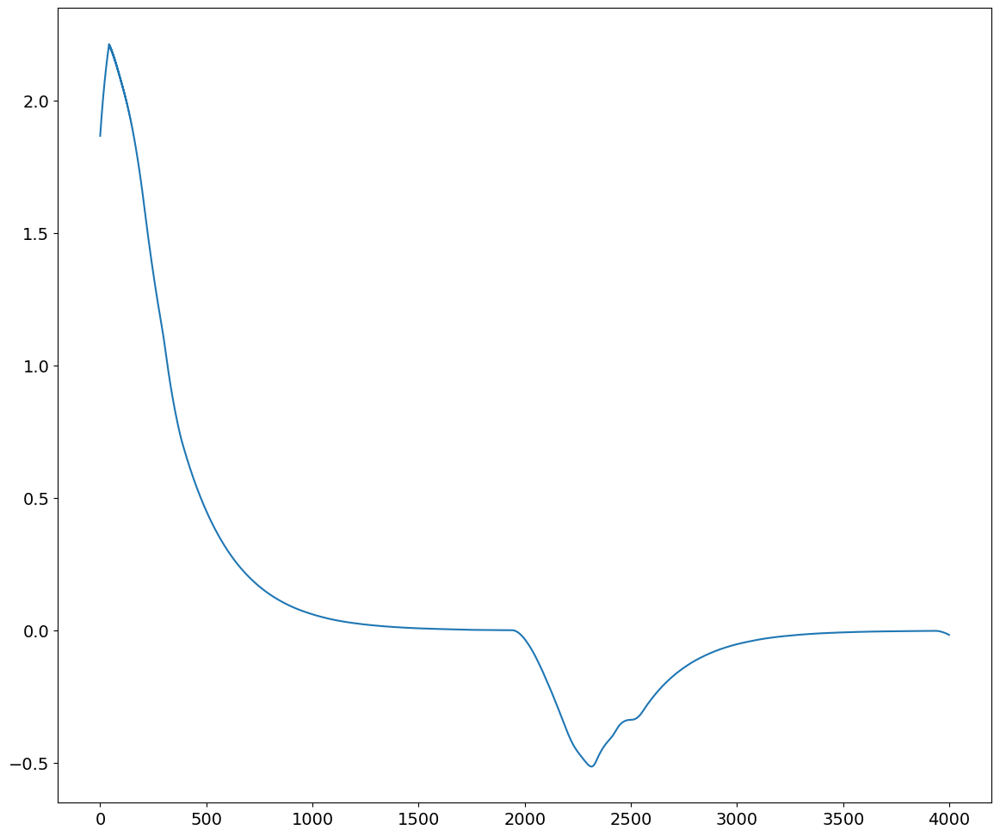

### PLOTTING CONTROL SIGNAL ###


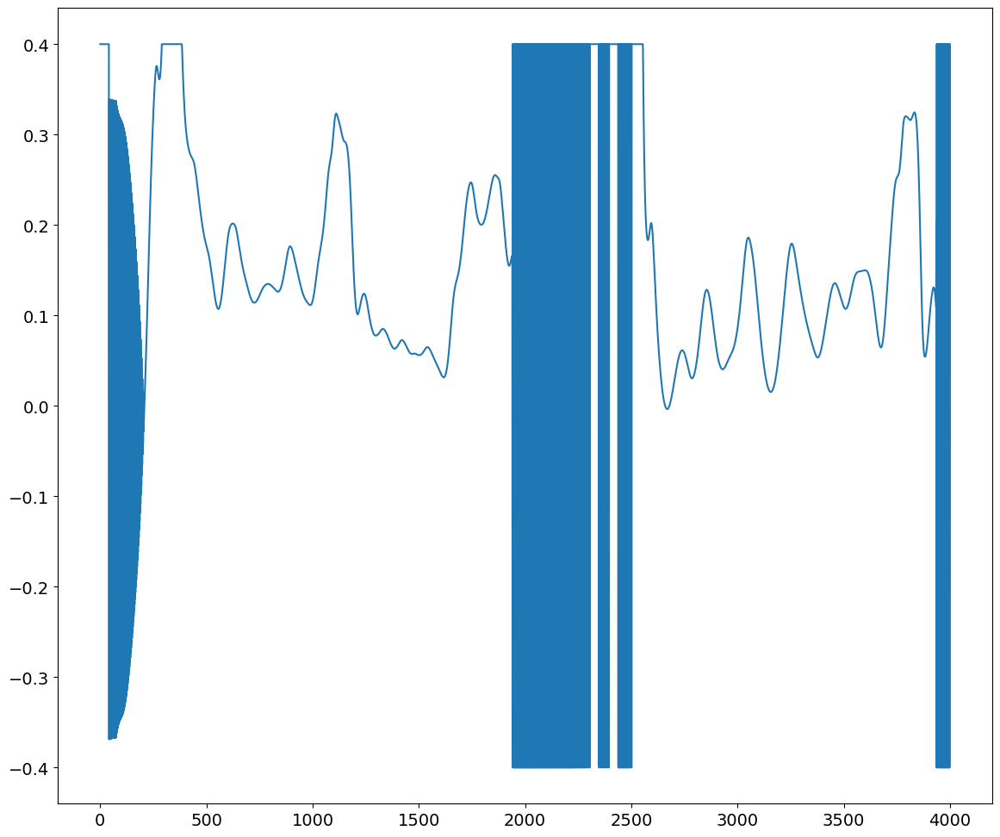

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.42it/s]


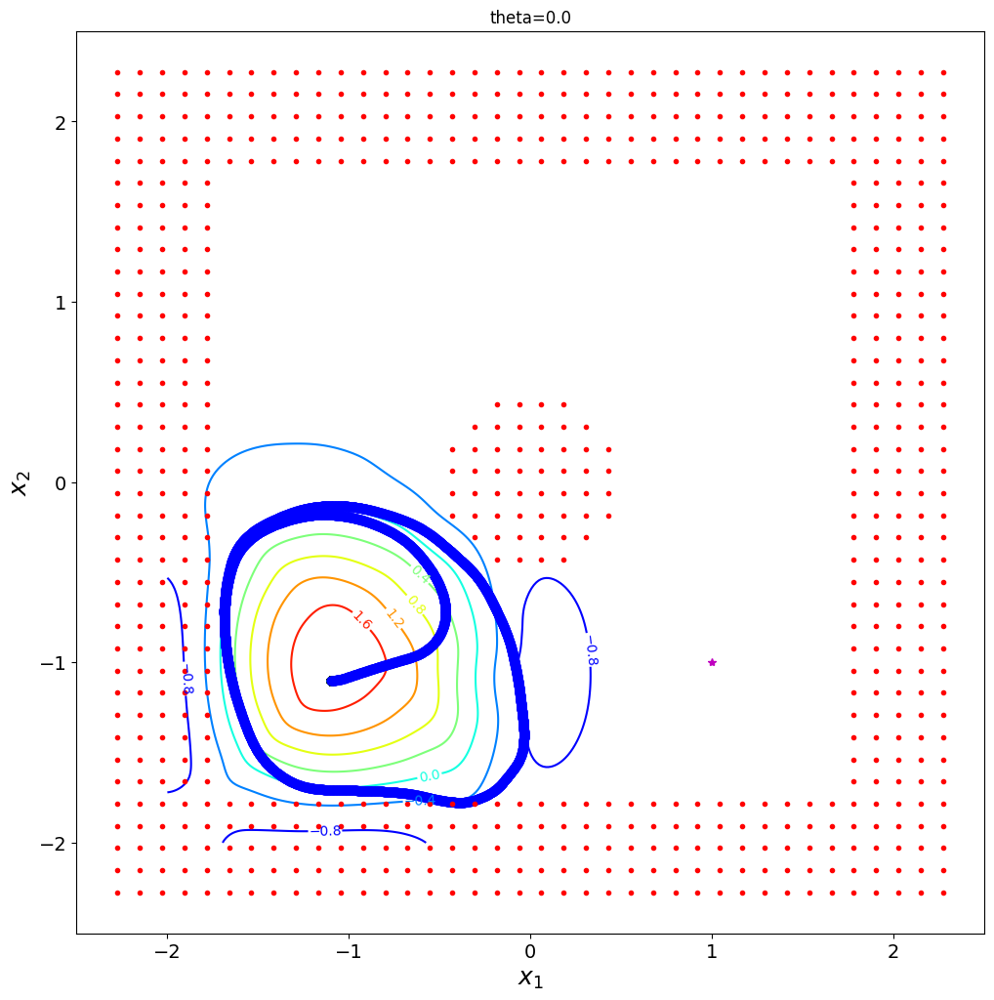

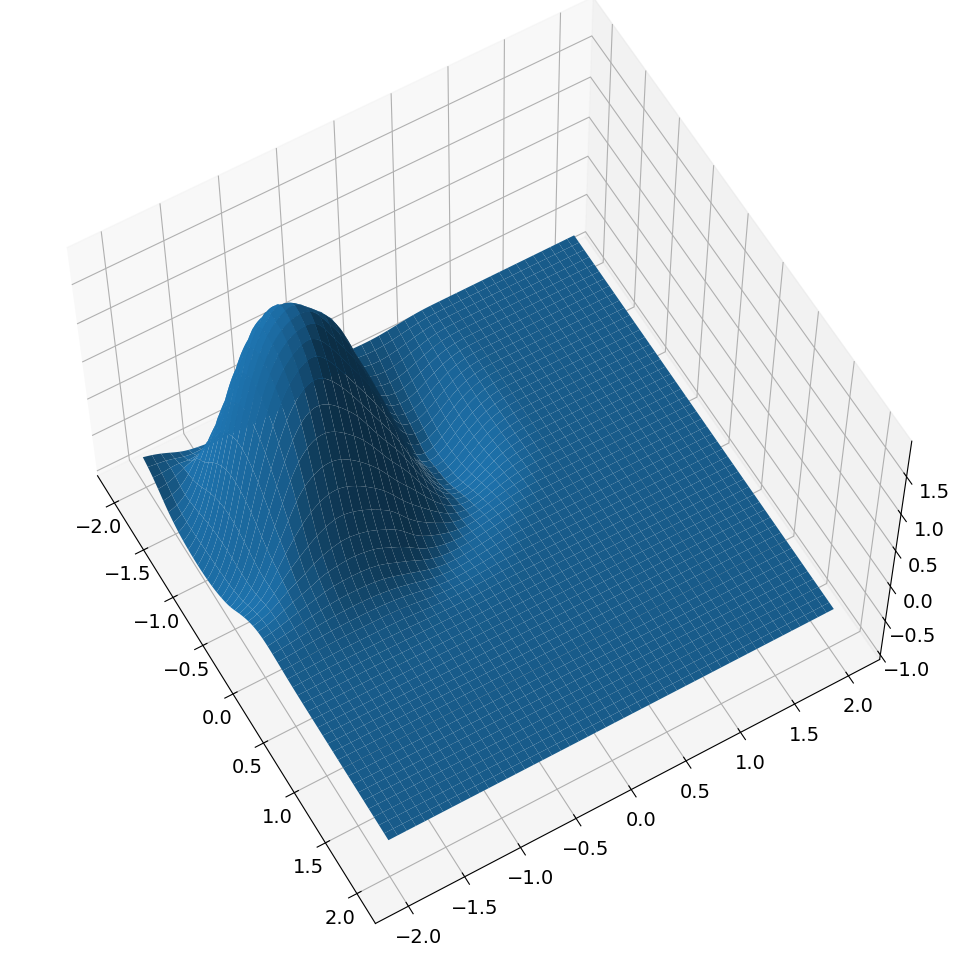

max h 1.9006383
percent violation: 0.191
new position is [-1.1 -1.1  0. ]
new time is 2000
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278


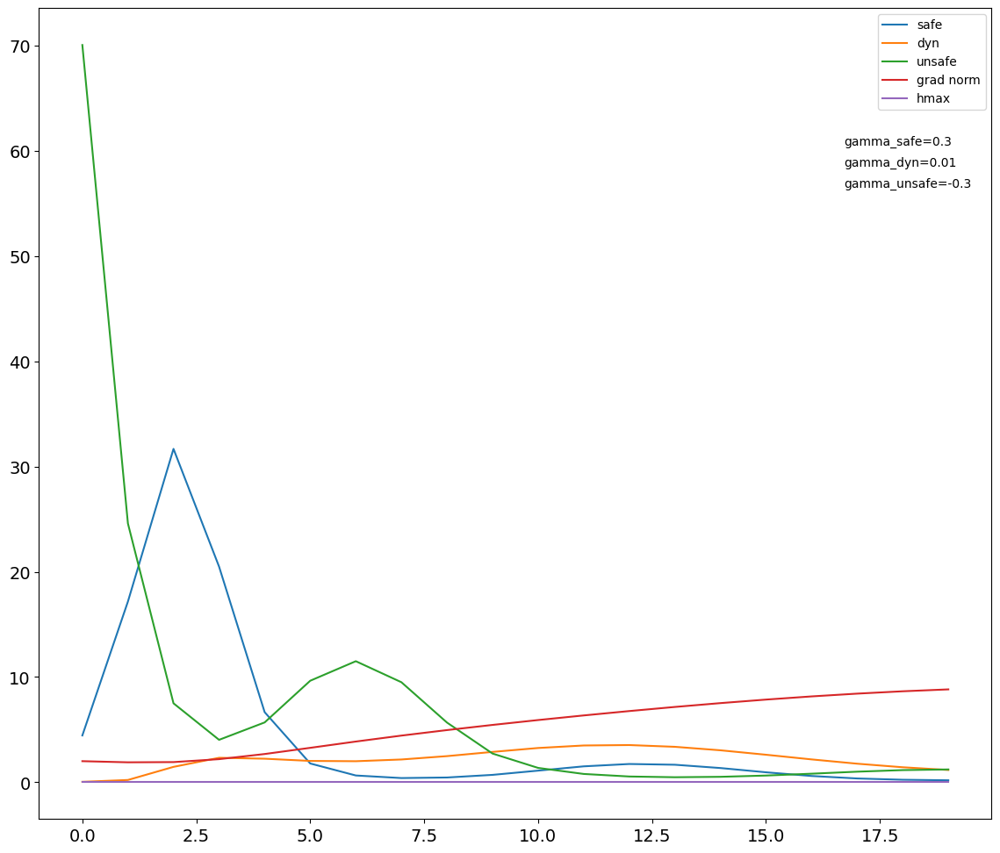

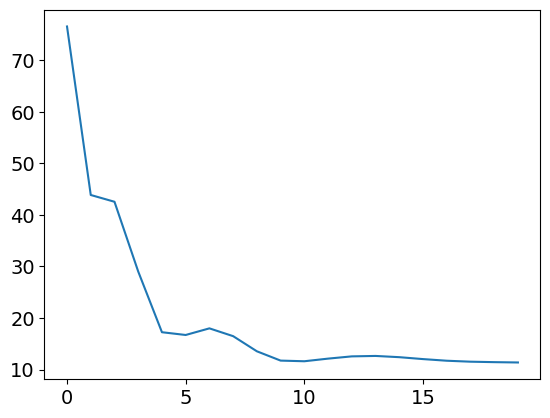

position is [-1.1 -1.1  0. ]
start time is 2000


  0%|                                                  | 0/4000 [00:00<?, ?it/s]/home/paul/.local/lib/python3.10/site-packages/cvxpy/problems/problem.py:1403: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
  8%|███                                     | 307/4000 [00:29<05:16, 11.66it/s]

val [0.4        0.00314658] max 0.4
val [0.4        0.00820283] max 0.4
val [0.4        0.01314923] max 0.4


  8%|███                                     | 309/4000 [00:30<05:18, 11.58it/s]

val [0.4        0.01789853] max 0.4
val [0.4        0.02238381] max 0.4
val [0.4        0.02654345] max 0.4


  8%|███▏                                    | 313/4000 [00:30<05:04, 12.12it/s]

val [0.4        0.03034138] max 0.4
val [0.4        0.03375483] max 0.4
val [0.4        0.03677679] max 0.4


  8%|███▏                                    | 315/4000 [00:30<04:57, 12.39it/s]

val [0.4        0.03941602] max 0.4
val [0.4        0.04168614] max 0.4


  8%|███▏                                    | 317/4000 [00:31<07:28,  8.21it/s]

val [0.4       0.0436108] max 0.4
val [0.4        0.04521573] max 0.4
val [0.4        0.04652848] max 0.4


  8%|███▏                                    | 321/4000 [00:31<06:03, 10.12it/s]

val [0.4        0.04757907] max 0.4
val [0.4        0.04839909] max 0.4
val [0.4        0.04901836] max 0.4


  8%|███▏                                    | 323/4000 [00:31<05:47, 10.57it/s]

val [0.4       0.0494605] max 0.4
val [0.4        0.04975317] max 0.4
val [0.4        0.04992029] max 0.4


  8%|███▎                                    | 327/4000 [00:31<05:31, 11.09it/s]

val [0.4        0.04998088] max 0.4
val [0.4        0.04995338] max 0.4
val [0.4        0.04985226] max 0.4


  8%|███▎                                    | 329/4000 [00:32<05:26, 11.25it/s]

val [0.4        0.04969076] max 0.4
val [0.4        0.04947672] max 0.4
val [0.4        0.04921843] max 0.4


  8%|███▎                                    | 333/4000 [00:32<05:13, 11.68it/s]

val [0.4        0.04892004] max 0.4
val [0.4        0.04858868] max 0.4
val [0.4       0.0482229] max 0.4


  8%|███▎                                    | 335/4000 [00:32<05:11, 11.77it/s]

val [0.4        0.04782206] max 0.4
val [0.4       0.0473856] max 0.4
val [0.4        0.04690781] max 0.4


  8%|███▎                                    | 337/4000 [00:32<05:05, 12.00it/s]

val [0.4        0.04638249] max 0.4
val [0.4        0.04580505] max 0.4


  9%|███▍                                    | 341/4000 [00:33<07:10,  8.50it/s]

val [0.4        0.04516659] max 0.4
val [0.4        0.04445835] max 0.4
val [0.4        0.04367309] max 0.4


  9%|███▍                                    | 343/4000 [00:33<06:30,  9.38it/s]

val [0.4       0.0428063] max 0.4
val [0.4        0.04185067] max 0.4
val [0.4        0.04080268] max 0.4


  9%|███▍                                    | 347/4000 [00:33<05:46, 10.55it/s]

val [0.4        0.03966198] max 0.4
val [0.4        0.03842799] max 0.4
val [0.4      0.037108] max 0.4


  9%|███▍                                    | 349/4000 [00:34<05:35, 10.88it/s]

val [0.4        0.03570686] max 0.4
val [0.4        0.03423869] max 0.4
val [0.4        0.03271604] max 0.4


  9%|███▌                                    | 353/4000 [00:34<05:18, 11.45it/s]

val [0.4        0.03115592] max 0.4
val [0.4        0.02957731] max 0.4
val [0.4        0.02800088] max 0.4


  9%|███▌                                    | 355/4000 [00:34<05:09, 11.79it/s]

val [0.4        0.02644306] max 0.4
val [0.4        0.02492207] max 0.4
val [0.4        0.02345307] max 0.4


  9%|███▌                                    | 357/4000 [00:34<05:07, 11.84it/s]

val [0.4       0.0220544] max 0.4


  9%|███▌                                    | 359/4000 [00:35<07:52,  7.71it/s]

val [0.4        0.02073123] max 0.4
val [0.4        0.01949492] max 0.4
val [0.4        0.01835235] max 0.4


  9%|███▋                                    | 363/4000 [00:35<06:19,  9.58it/s]

val [0.4        0.01730708] max 0.4
val [0.4        0.01635722] max 0.4
val [0.4        0.01550593] max 0.4


  9%|███▋                                    | 365/4000 [00:35<05:55, 10.22it/s]

val [0.4        0.01475058] max 0.4
val [0.4        0.01408749] max 0.4
val [0.4        0.01351136] max 0.4


  9%|███▋                                    | 369/4000 [00:35<05:20, 11.31it/s]

val [0.4        0.01301256] max 0.4
val [0.4        0.01258407] max 0.4
val [0.4        0.01221371] max 0.4


  9%|███▋                                    | 371/4000 [00:36<05:19, 11.36it/s]

val [0.4        0.01188726] max 0.4
val [0.4       0.0115892] max 0.4
val [0.4        0.01130428] max 0.4


  9%|███▊                                    | 375/4000 [00:36<05:05, 11.87it/s]

val [0.4        0.01100936] max 0.4
val [0.4        0.01068584] max 0.4
val [0.4        0.01030848] max 0.4


  9%|███▊                                    | 377/4000 [00:36<05:02, 11.96it/s]

val [0.4        0.00985511] max 0.4
val [0.4        0.00930568] max 0.4
val [0.4        0.00863924] max 0.4


 10%|███▊                                    | 381/4000 [00:36<04:55, 12.26it/s]

val [0.4        0.00783774] max 0.4
val [0.4        0.00689292] max 0.4
val [0.4        0.00579445] max 0.4


 10%|███▊                                    | 383/4000 [00:37<04:59, 12.08it/s]

val [0.4        0.00453628] max 0.4
val [0.4        0.00311844] max 0.4


100%|███████████████████████████████████████| 4000/4000 [05:59<00:00, 11.14it/s]

### PLOTTING h(x(t)) ###


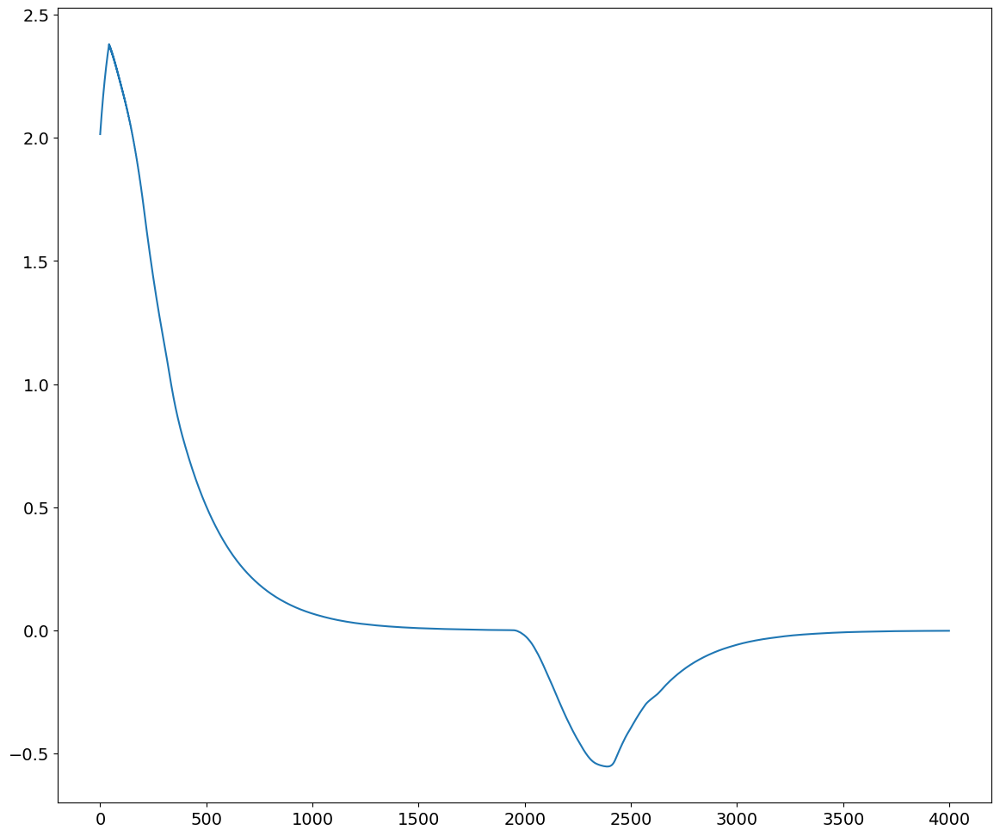

### PLOTTING CONTROL SIGNAL ###


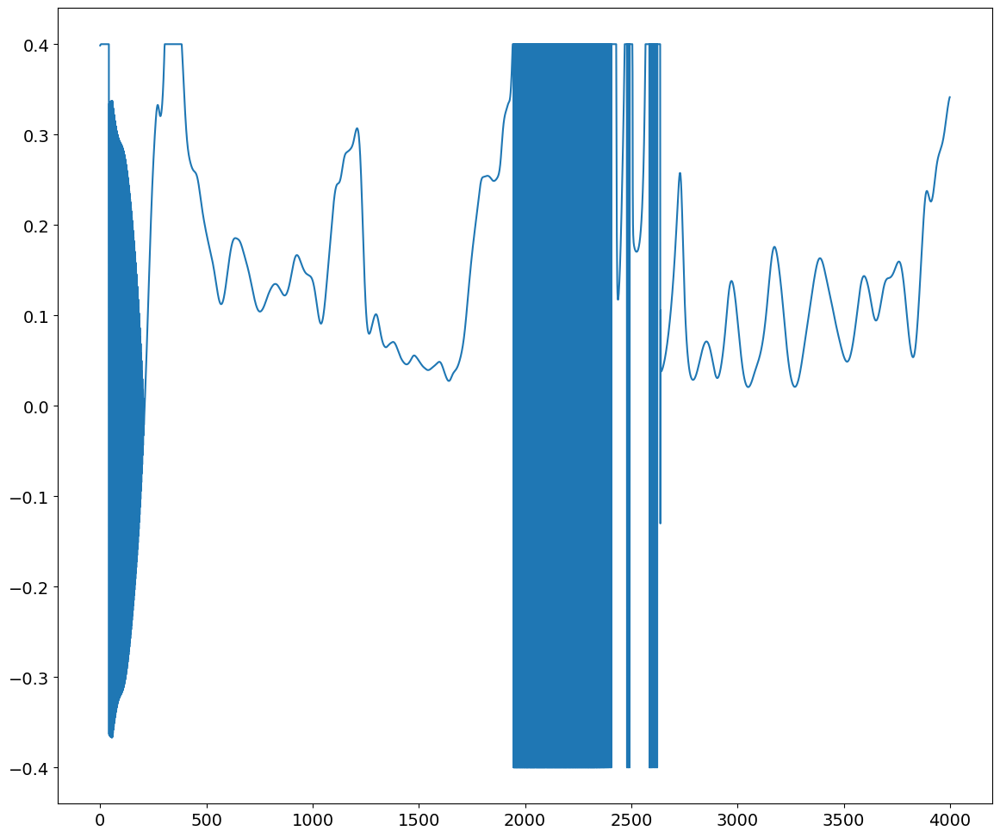

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.42it/s]


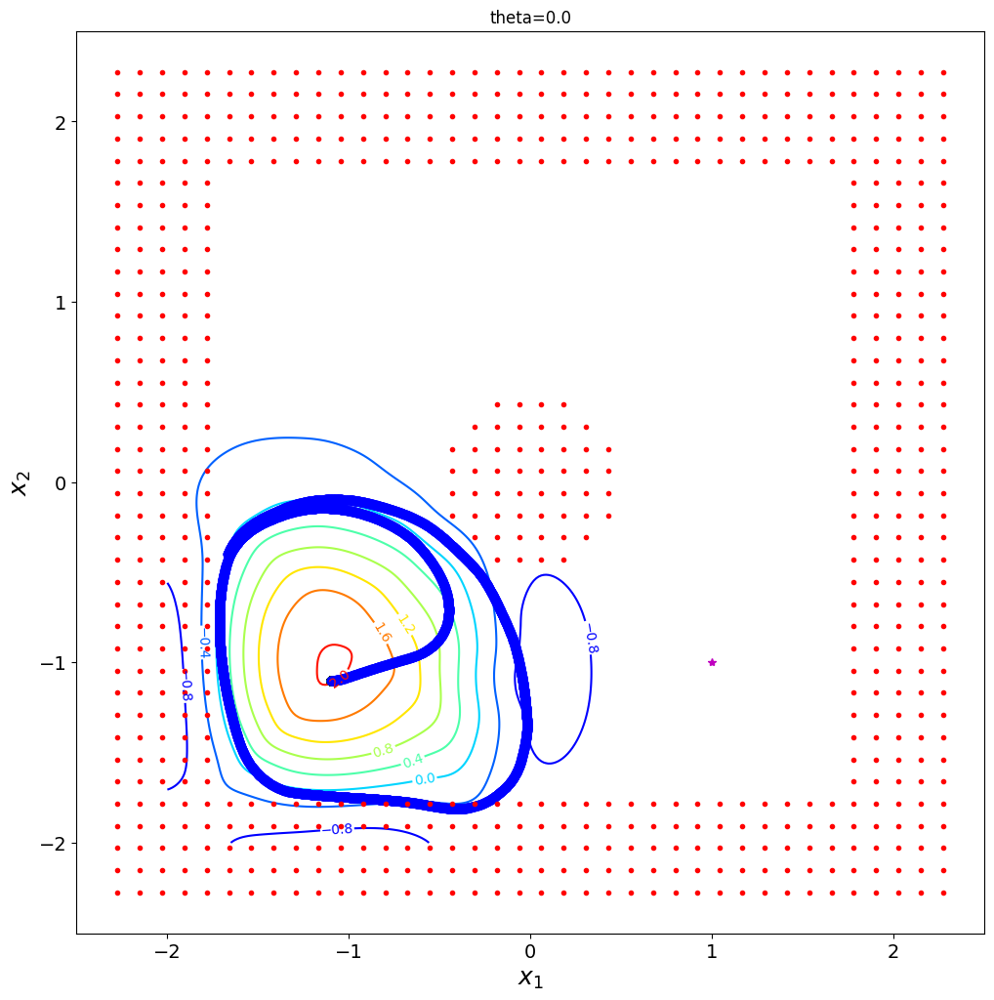

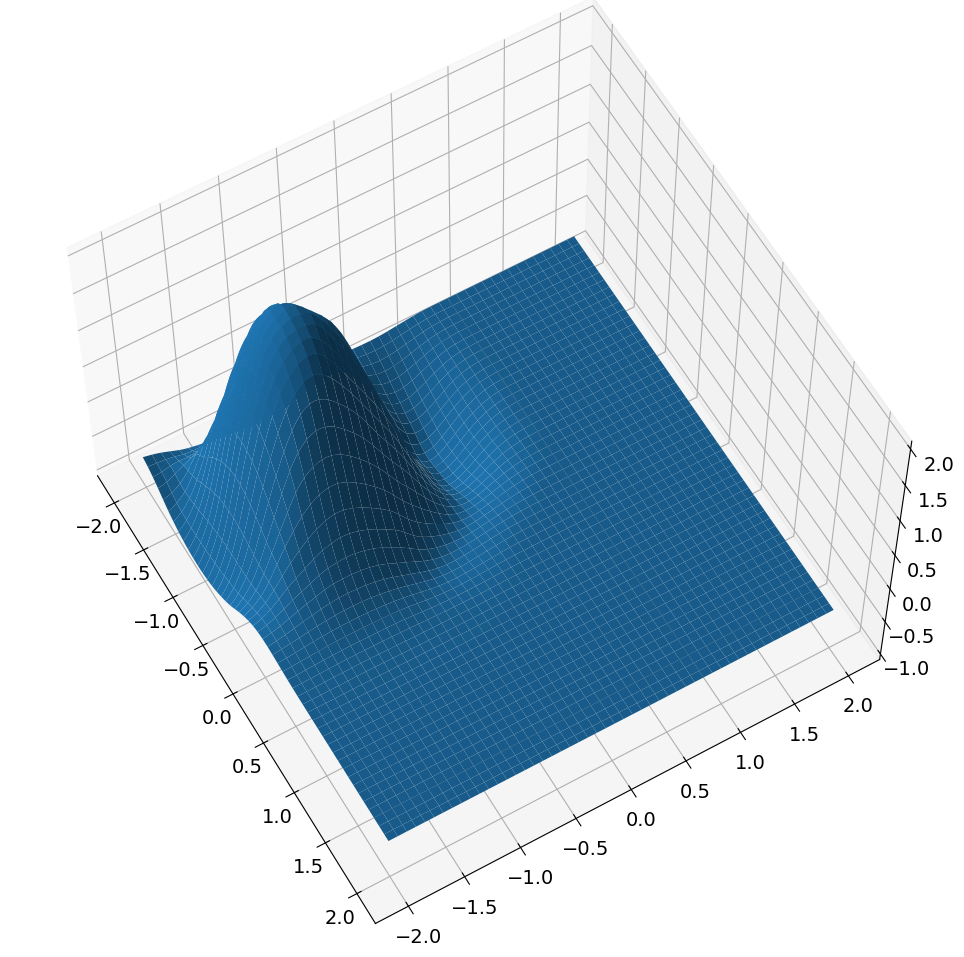

max h 2.04352
percent violation: 0.1665
new position is [-1.1 -1.1  0. ]
new time is 2080
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823


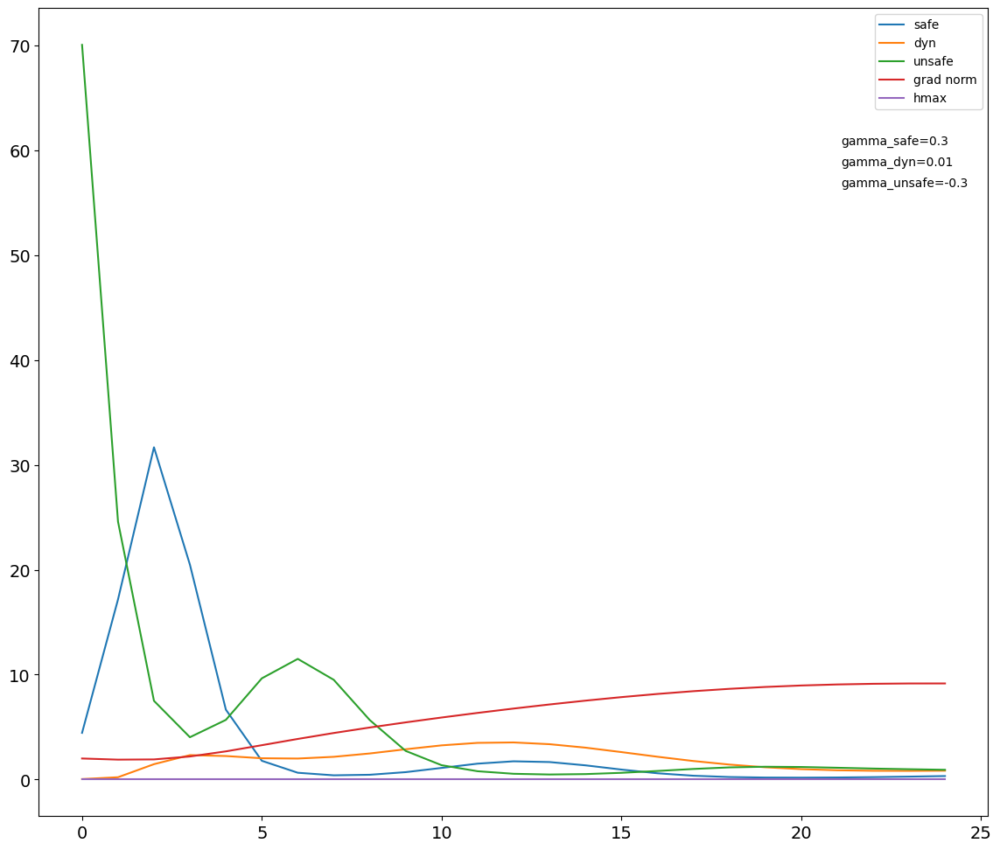

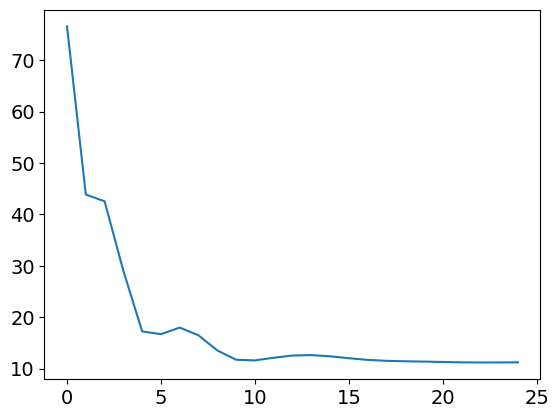

position is [-1.1 -1.1  0. ]
start time is 2080


  0%|                                                  | 0/4000 [00:00<?, ?it/s]/home/paul/.local/lib/python3.10/site-packages/cvxpy/problems/problem.py:1403: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
  8%|███                                     | 304/4000 [00:26<04:46, 12.89it/s]

val [0.4        0.00083811] max 0.4
val [0.4        0.00564398] max 0.4
val [0.4        0.01014703] max 0.4


  8%|███                                     | 308/4000 [00:26<04:33, 13.52it/s]

val [0.4        0.01427096] max 0.4
val [0.4        0.01796463] max 0.4
val [0.4        0.02120483] max 0.4


  8%|███                                     | 310/4000 [00:27<04:37, 13.29it/s]

val [0.4        0.02398339] max 0.4
val [0.4        0.02630829] max 0.4
val [0.4        0.02820336] max 0.4


  8%|███▏                                    | 314/4000 [00:27<04:56, 12.43it/s]

val [0.4        0.02969413] max 0.4
val [0.4        0.03080963] max 0.4
val [0.4        0.03158824] max 0.4
val [0.4        0.03205929] max 0.4


  8%|███▏                                    | 318/4000 [00:28<07:09,  8.56it/s]

val [0.4        0.03226479] max 0.4
val [0.4        0.03223484] max 0.4
val [0.4        0.03200032] max 0.4


  8%|███▏                                    | 320/4000 [00:28<06:36,  9.28it/s]

val [0.4        0.03159718] max 0.4
val [0.4        0.03104948] max 0.4
val [0.4        0.03038564] max 0.4


  8%|███▏                                    | 324/4000 [00:28<05:36, 10.93it/s]

val [0.4        0.02962645] max 0.4
val [0.4        0.02879436] max 0.4
val [0.4        0.02790703] max 0.4


  8%|███▎                                    | 326/4000 [00:28<05:15, 11.63it/s]

val [0.4        0.02698127] max 0.4
val [0.4        0.02602685] max 0.4
val [0.4        0.02505931] max 0.4


  8%|███▎                                    | 330/4000 [00:28<04:49, 12.67it/s]

val [0.4        0.02408473] max 0.4
val [0.4        0.02310712] max 0.4
val [0.4       0.0221322] max 0.4


  8%|███▎                                    | 332/4000 [00:29<04:43, 12.95it/s]

val [0.4        0.02116104] max 0.4
val [0.4        0.02019197] max 0.4
val [0.4        0.01922614] max 0.4


  8%|███▎                                    | 336/4000 [00:29<04:50, 12.61it/s]

val [0.4        0.01825661] max 0.4
val [0.4        0.01728011] max 0.4
val [0.4        0.01628878] max 0.4


  8%|███▍                                    | 338/4000 [00:29<05:09, 11.82it/s]

val [0.4        0.01527452] max 0.4
val [0.4        0.01423235] max 0.4
val [0.4        0.01315144] max 0.4


  9%|███▍                                    | 342/4000 [00:30<07:14,  8.43it/s]

val [0.4        0.01202923] max 0.4
val [0.4       0.0108576] max 0.4
val [0.4        0.00963521] max 0.4


  9%|███▍                                    | 344/4000 [00:30<06:29,  9.39it/s]

val [0.4       0.0083655] max 0.4
val [0.4        0.00704867] max 0.4
val [0.4        0.00569241] max 0.4


  9%|███▍                                    | 348/4000 [00:30<05:37, 10.81it/s]

val [0.4        0.00430399] max 0.4
val [0.4        0.00289428] max 0.4
val [0.4        0.00147628] max 0.4


  9%|███▌                                    | 350/4000 [00:30<05:21, 11.35it/s]

val [4.00000000e-01 6.59679602e-05] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:00<00:00, 11.10it/s]

### PLOTTING h(x(t)) ###


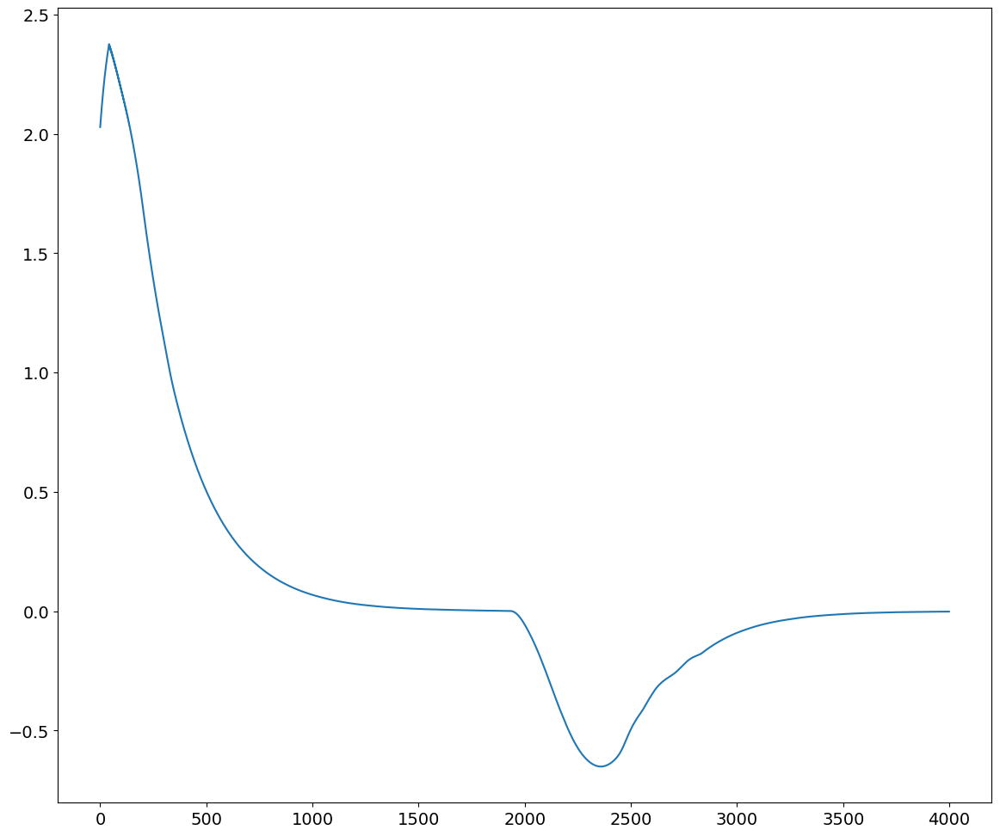

### PLOTTING CONTROL SIGNAL ###


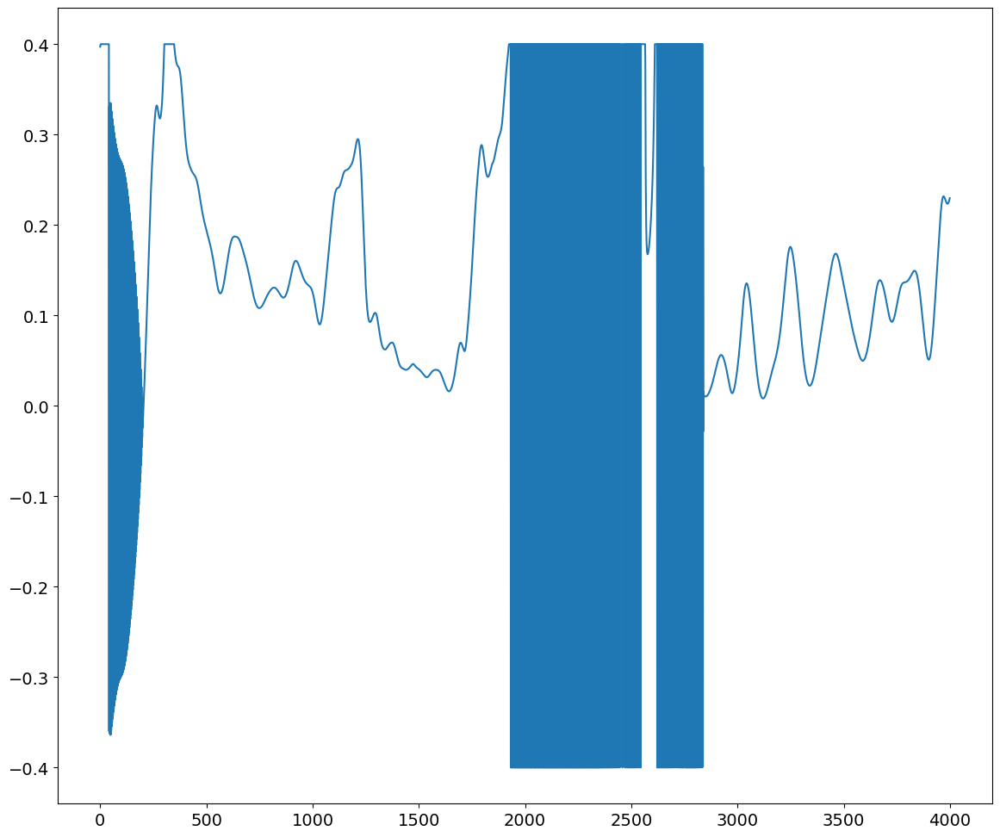

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:16<00:00,  3.53it/s]


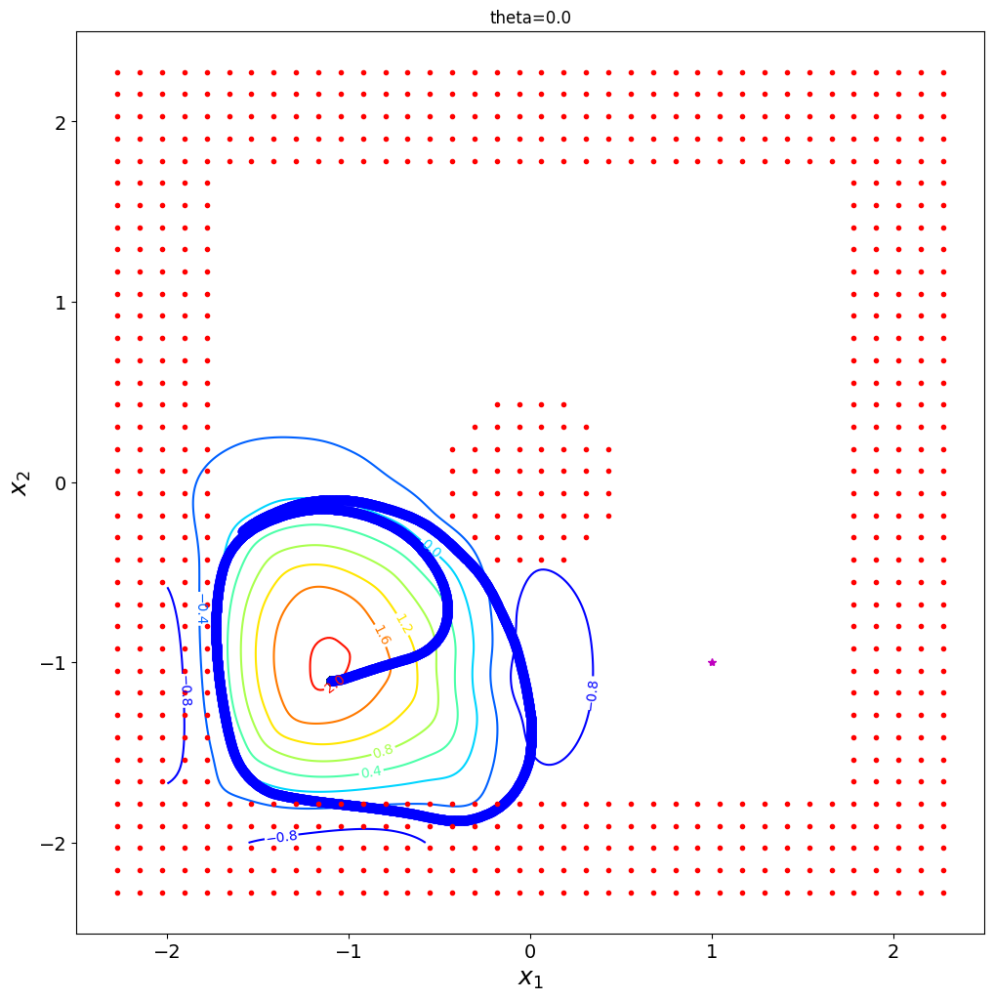

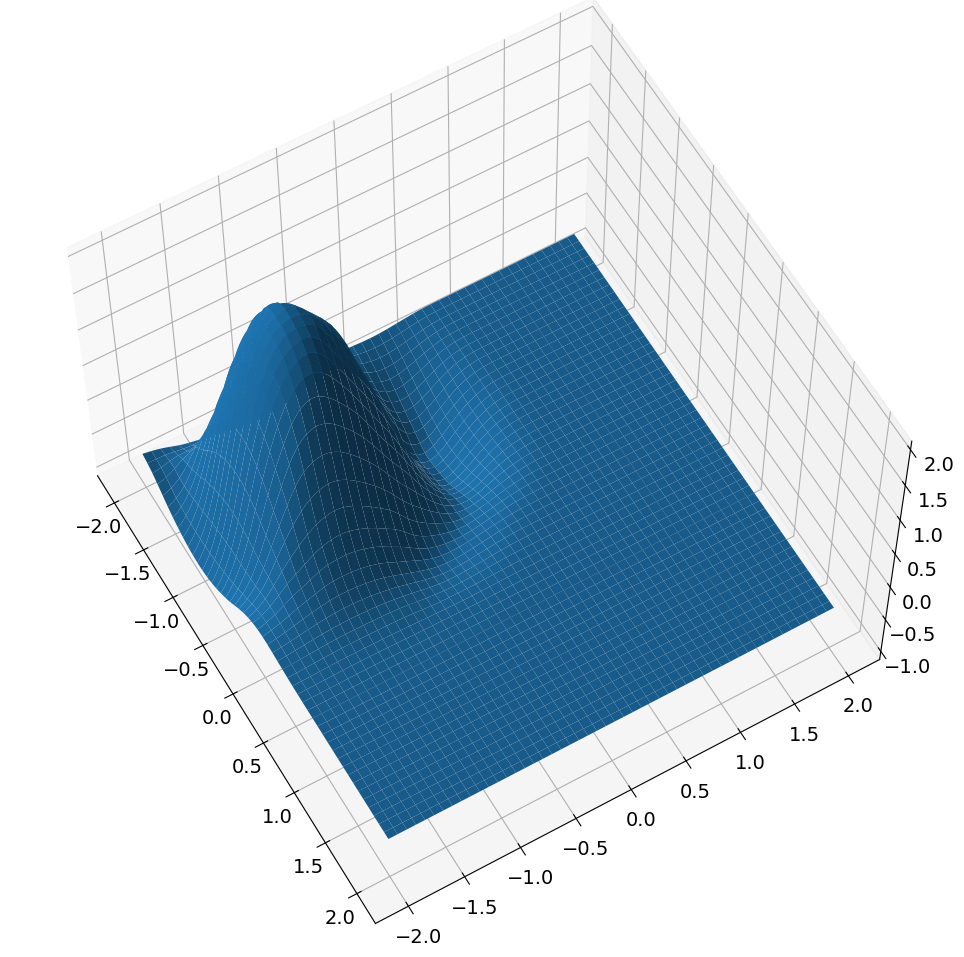

max h 2.052494
percent violation: 0.21875
new position is [-1.1 -1.1  0. ]
new time is 2160
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473


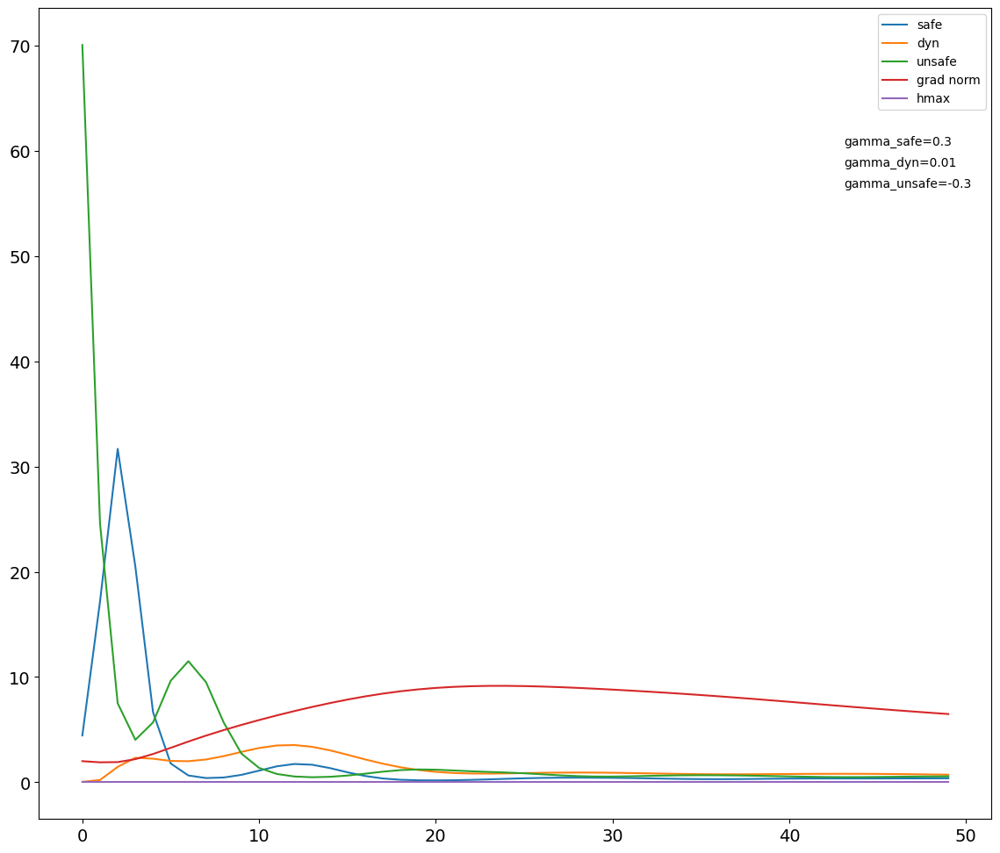

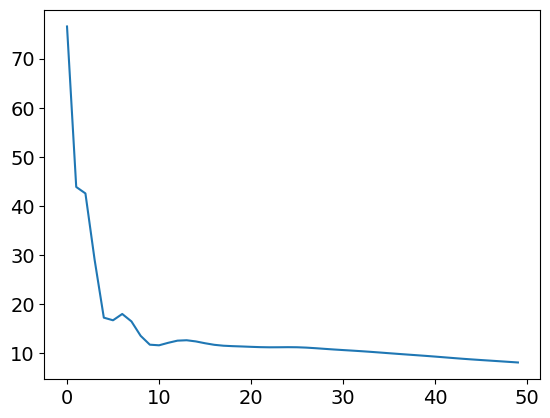

position is [-1.1 -1.1  0. ]
start time is 2160


  8%|███▎                                    | 336/4000 [00:28<05:04, 12.03it/s]

val [0.4        0.00053867] max 0.4
val [0.4        0.00190305] max 0.4
val [0.4        0.00326633] max 0.4


  8%|███▍                                    | 338/4000 [00:29<04:57, 12.33it/s]

val [0.4        0.00462696] max 0.4
val [0.4        0.00598122] max 0.4
val [0.4       0.0073242] max 0.4


  9%|███▍                                    | 342/4000 [00:29<04:38, 13.13it/s]

val [0.4        0.00864751] max 0.4
val [0.4        0.00994355] max 0.4
val [0.4        0.01119998] max 0.4


  9%|███▍                                    | 344/4000 [00:29<04:36, 13.24it/s]

val [0.4        0.01240685] max 0.4
val [0.4        0.01354822] max 0.4
val [0.4       0.0146097] max 0.4


  9%|███▍                                    | 348/4000 [00:29<04:36, 13.21it/s]

val [0.4       0.0155773] max 0.4
val [0.4       0.0164324] max 0.4
val [0.4        0.01716161] max 0.4


  9%|███▌                                    | 350/4000 [00:30<04:39, 13.06it/s]

val [0.4        0.01774737] max 0.4
val [0.4        0.01817343] max 0.4
val [0.4        0.01842698] max 0.4


  9%|███▌                                    | 354/4000 [00:30<04:34, 13.27it/s]

val [0.4        0.01849286] max 0.4
val [0.4        0.01835745] max 0.4
val [0.4        0.01801203] max 0.4


  9%|███▌                                    | 356/4000 [00:30<07:06,  8.55it/s]

val [0.4        0.01745523] max 0.4
val [0.4        0.01668276] max 0.4
val [0.4       0.0157032] max 0.4


  9%|███▌                                    | 360/4000 [00:31<05:42, 10.64it/s]

val [0.4        0.01452856] max 0.4
val [0.4        0.01318263] max 0.4
val [0.4        0.01169235] max 0.4


  9%|███▌                                    | 362/4000 [00:31<05:30, 11.01it/s]

val [0.4        0.01009202] max 0.4
val [0.4        0.00842284] max 0.4
val [0.4        0.00672628] max 0.4


  9%|███▋                                    | 366/4000 [00:31<04:56, 12.26it/s]

val [0.4        0.00504091] max 0.4
val [0.4        0.00340683] max 0.4
val [0.4        0.00185199] max 0.4


100%|███████████████████████████████████████| 4000/4000 [05:46<00:00, 11.54it/s]


### PLOTTING h(x(t)) ###


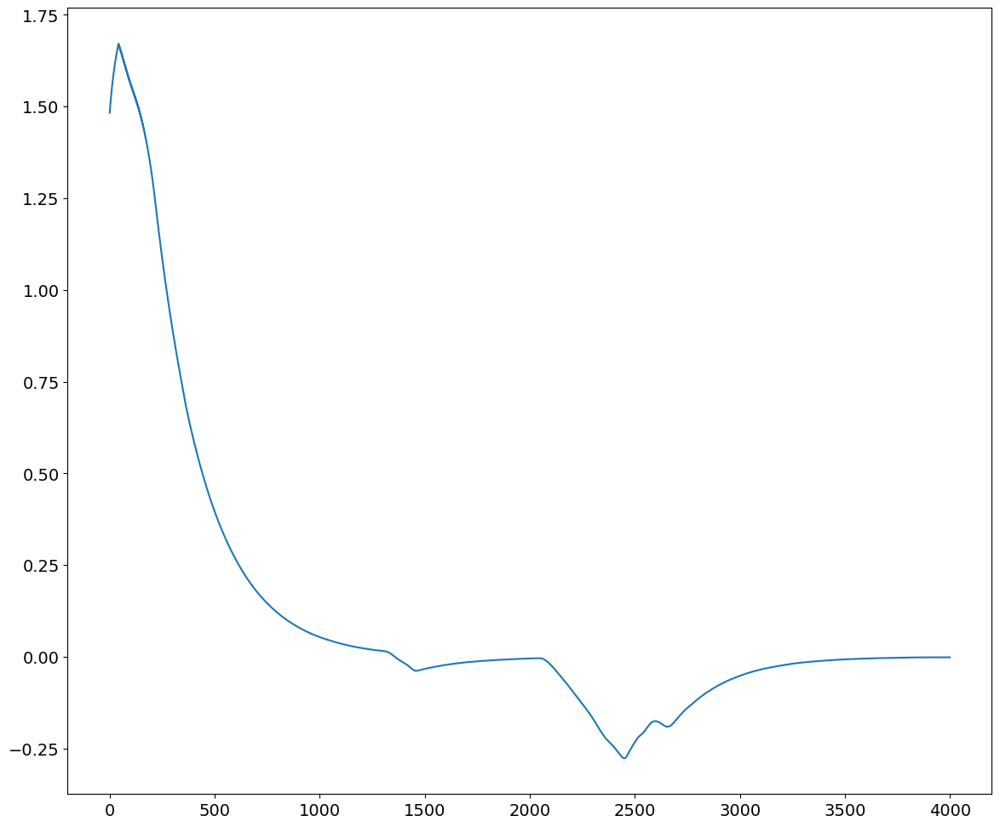

### PLOTTING CONTROL SIGNAL ###


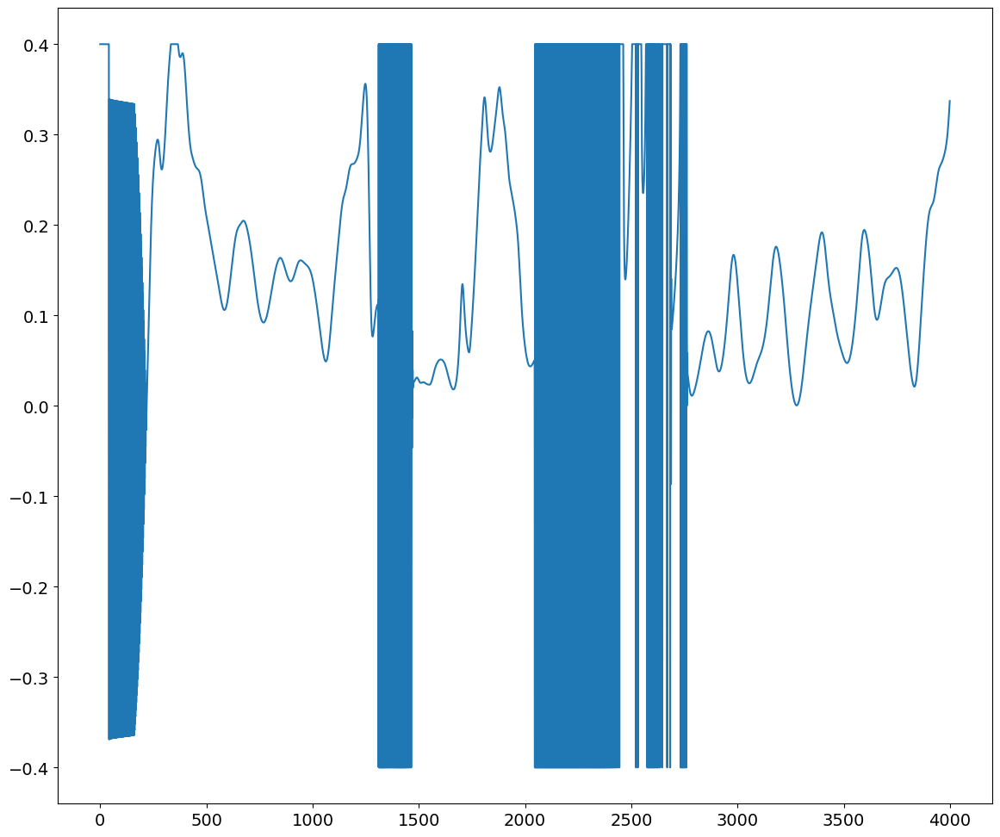

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.34it/s]


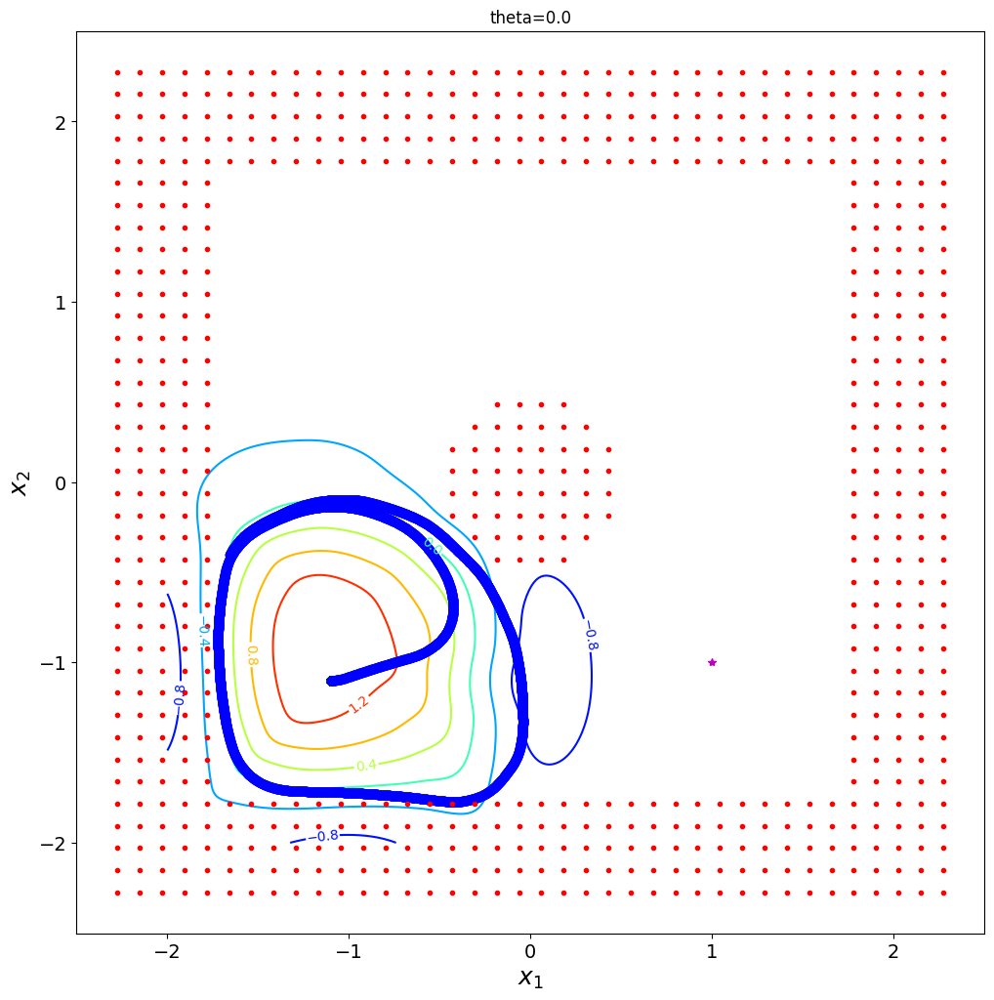

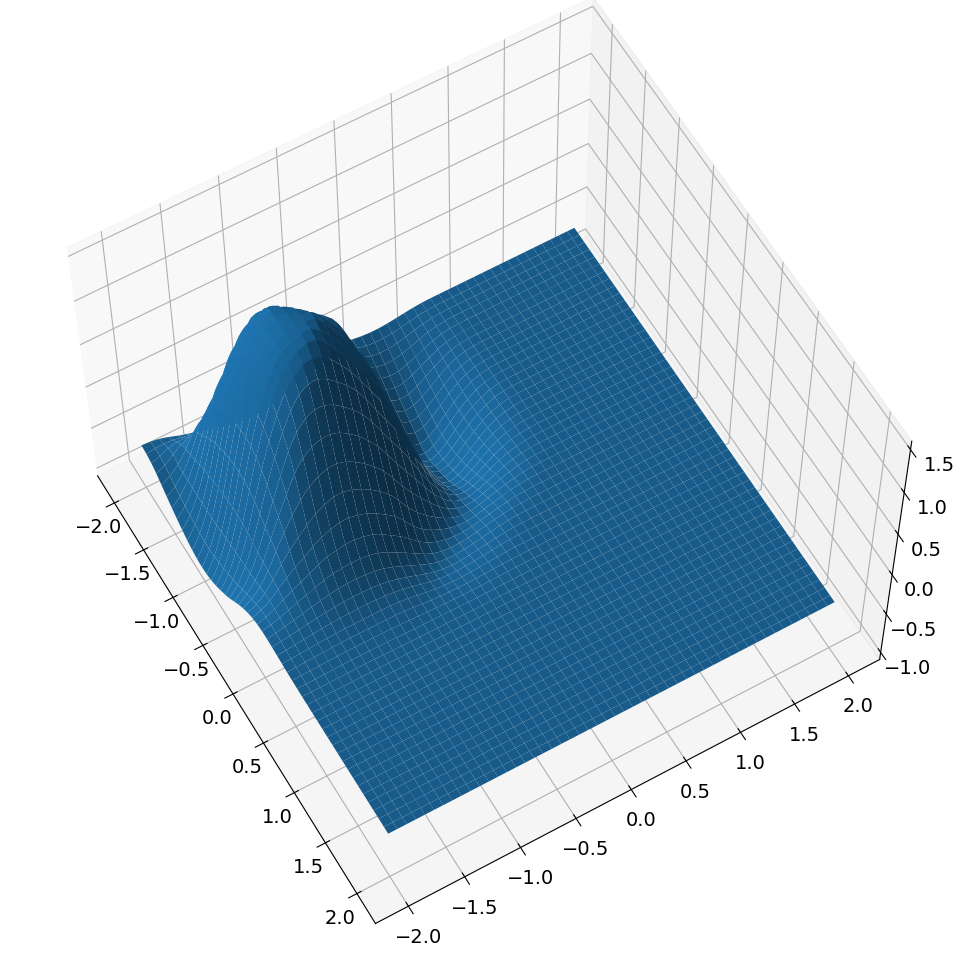

max h 1.5426049
percent violation: 0.1955
new position is [-1.1 -1.1  0. ]
new time is 2240
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191


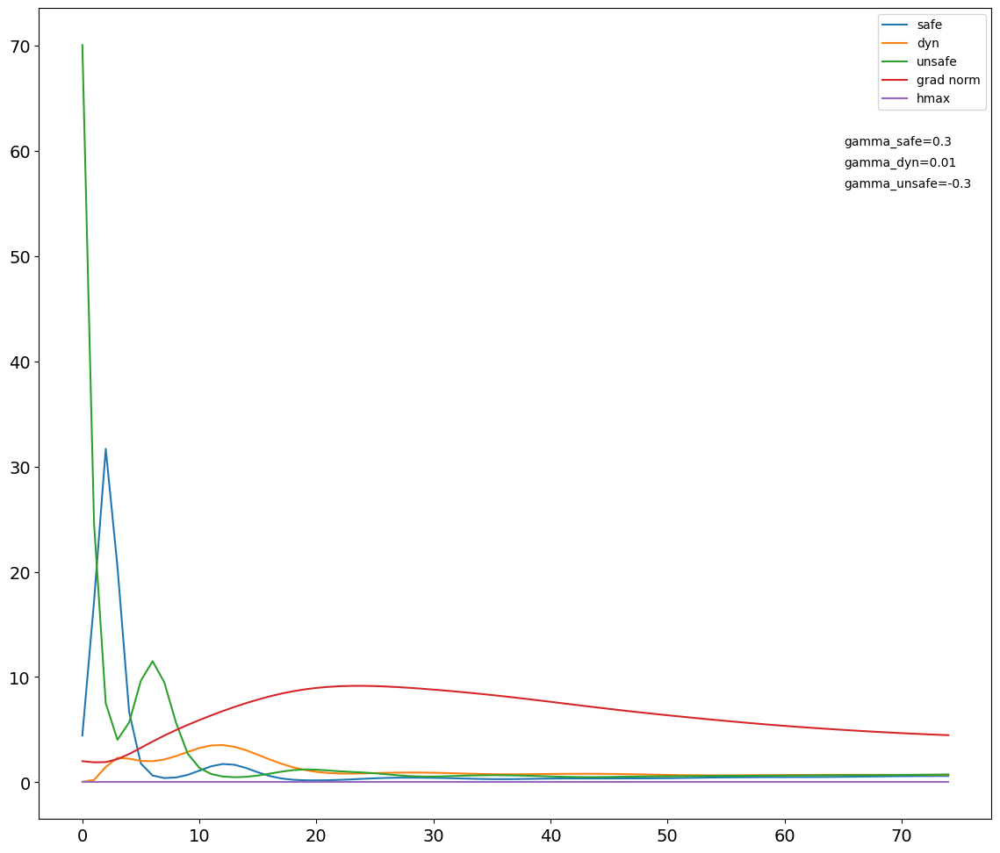

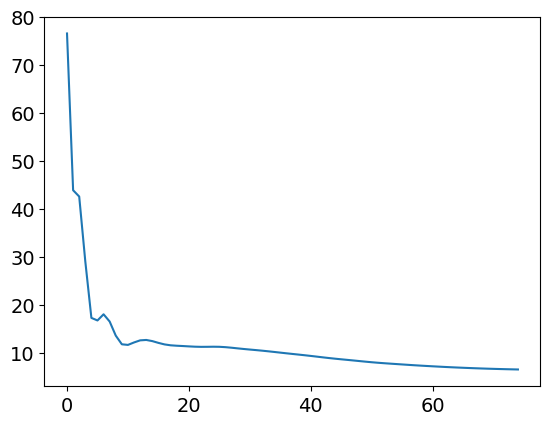

position is [-1.1 -1.1  0. ]
start time is 2240


  9%|███▌                                    | 351/4000 [00:34<07:04,  8.59it/s]

val [0.4        0.01027681] max 0.4
val [0.4        0.01299897] max 0.4
val [0.4        0.01566599] max 0.4


  9%|███▌                                    | 353/4000 [00:34<06:29,  9.37it/s]

val [0.4        0.01825599] max 0.4
val [0.4        0.02074404] max 0.4
val [0.4        0.02311095] max 0.4


  9%|███▌                                    | 357/4000 [00:34<05:44, 10.58it/s]

val [0.4        0.02533064] max 0.4
val [0.4        0.02738411] max 0.4
val [0.4        0.02924824] max 0.4


  9%|███▌                                    | 359/4000 [00:34<05:54, 10.28it/s]

val [0.4        0.03090583] max 0.4
val [0.4        0.03233746] max 0.4


  9%|███▌                                    | 361/4000 [00:35<05:58, 10.14it/s]

val [0.4        0.03352135] max 0.4
val [0.4        0.03444361] max 0.4
val [0.4        0.03508512] max 0.4


  9%|███▋                                    | 365/4000 [00:35<05:40, 10.68it/s]

val [0.4        0.03543179] max 0.4
val [0.4        0.03546808] max 0.4
val [0.4       0.0351846] max 0.4


  9%|███▋                                    | 367/4000 [00:35<05:31, 10.95it/s]

val [0.4        0.03457498] max 0.4
val [0.4        0.03364257] max 0.4
val [0.4        0.03239998] max 0.4


  9%|███▋                                    | 369/4000 [00:35<05:29, 11.03it/s]

val [0.4        0.03087616] max 0.4
val [0.4        0.02911527] max 0.4


  9%|███▋                                    | 371/4000 [00:36<05:44, 10.52it/s]

val [0.4       0.0271862] max 0.4


  9%|███▋                                    | 373/4000 [00:36<08:37,  7.00it/s]

val [0.4        0.02516894] max 0.4
val [0.4        0.02314202] max 0.4
val [0.4        0.02117118] max 0.4


  9%|███▊                                    | 377/4000 [00:36<06:44,  8.96it/s]

val [0.4        0.01930861] max 0.4
val [0.4        0.01758229] max 0.4
val [0.4        0.01601032] max 0.4


  9%|███▊                                    | 379/4000 [00:37<06:19,  9.55it/s]

val [0.4        0.01459762] max 0.4
val [0.4        0.01334534] max 0.4


 10%|███▊                                    | 381/4000 [00:37<06:18,  9.56it/s]

val [0.4        0.01225011] max 0.4
val [0.4       0.0113044] max 0.4
val [0.4        0.01050778] max 0.4


 10%|███▊                                    | 385/4000 [00:37<05:25, 11.09it/s]

val [0.4        0.00984796] max 0.4


 63%|████████████████████████▌              | 2525/4000 [04:06<03:05,  7.96it/s]

val [0.4        0.00115584] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:14<00:00, 10.68it/s]

### PLOTTING h(x(t)) ###


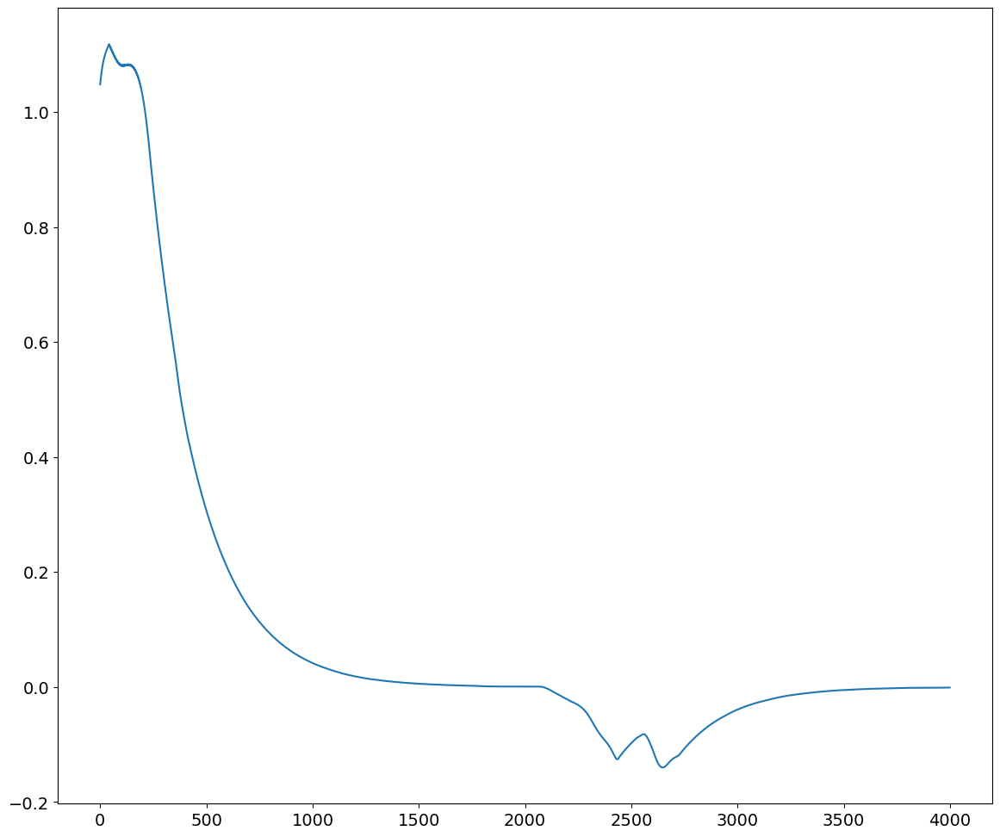

### PLOTTING CONTROL SIGNAL ###


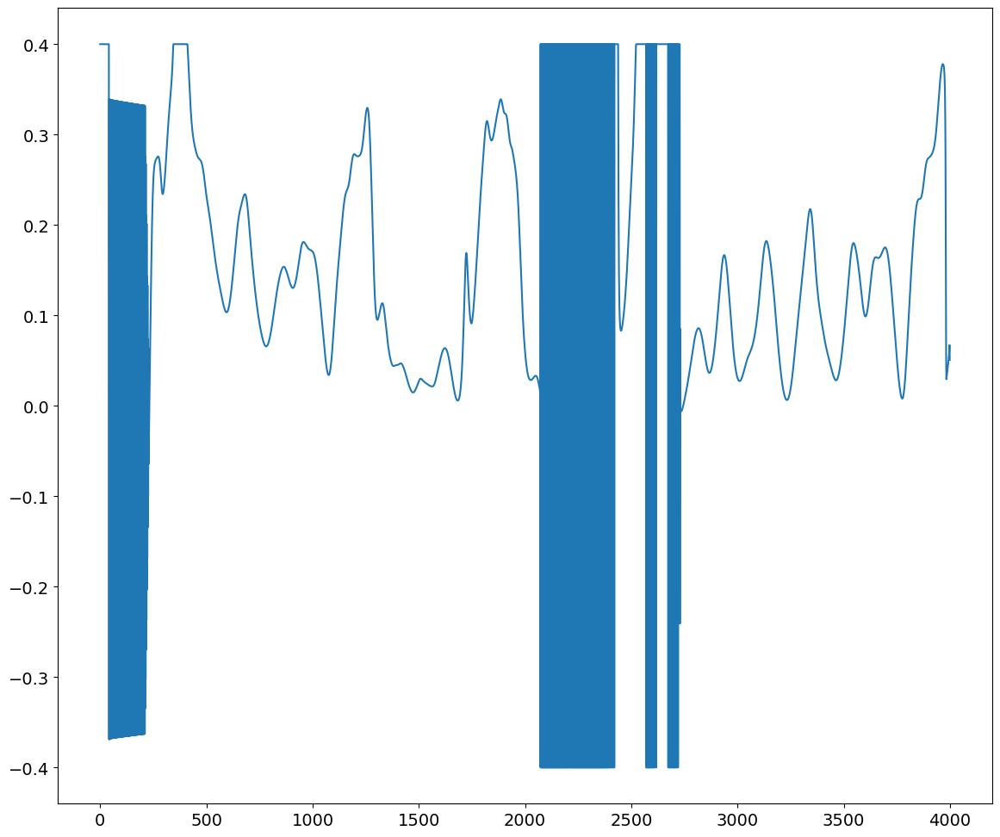

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.49it/s]


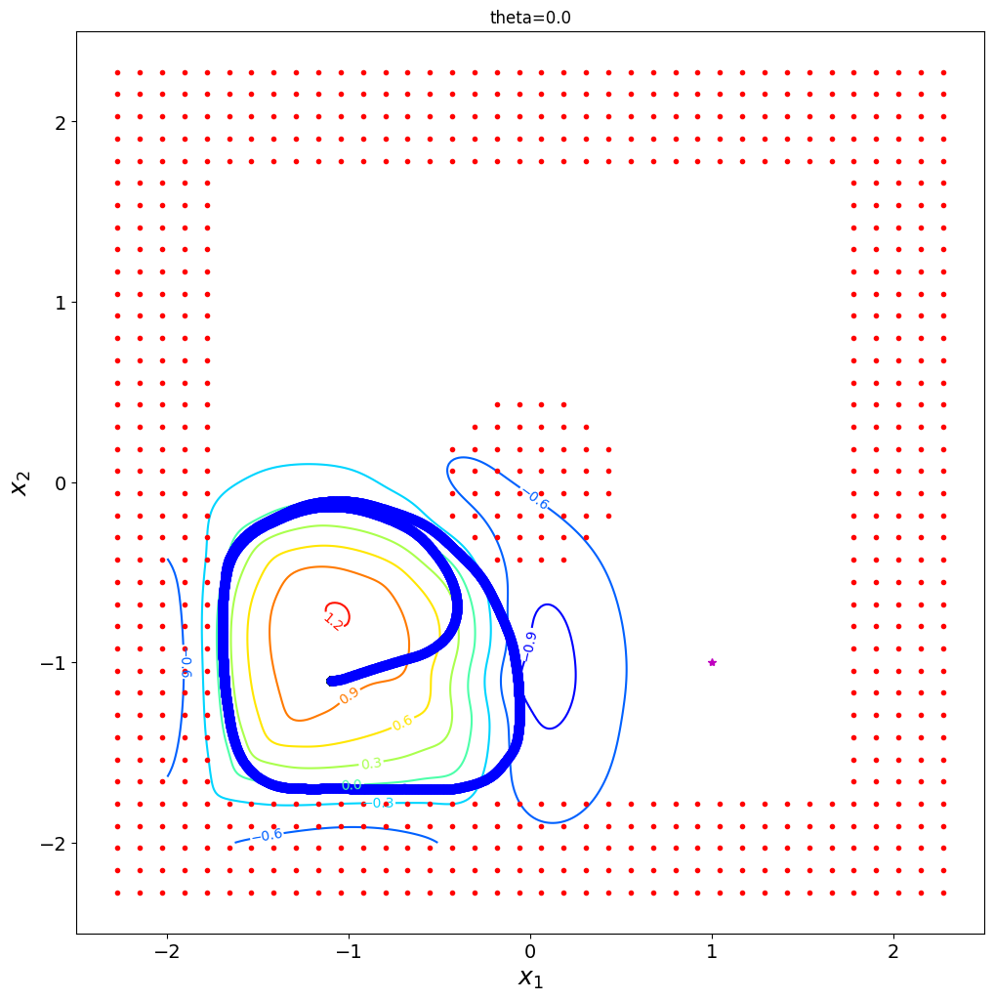

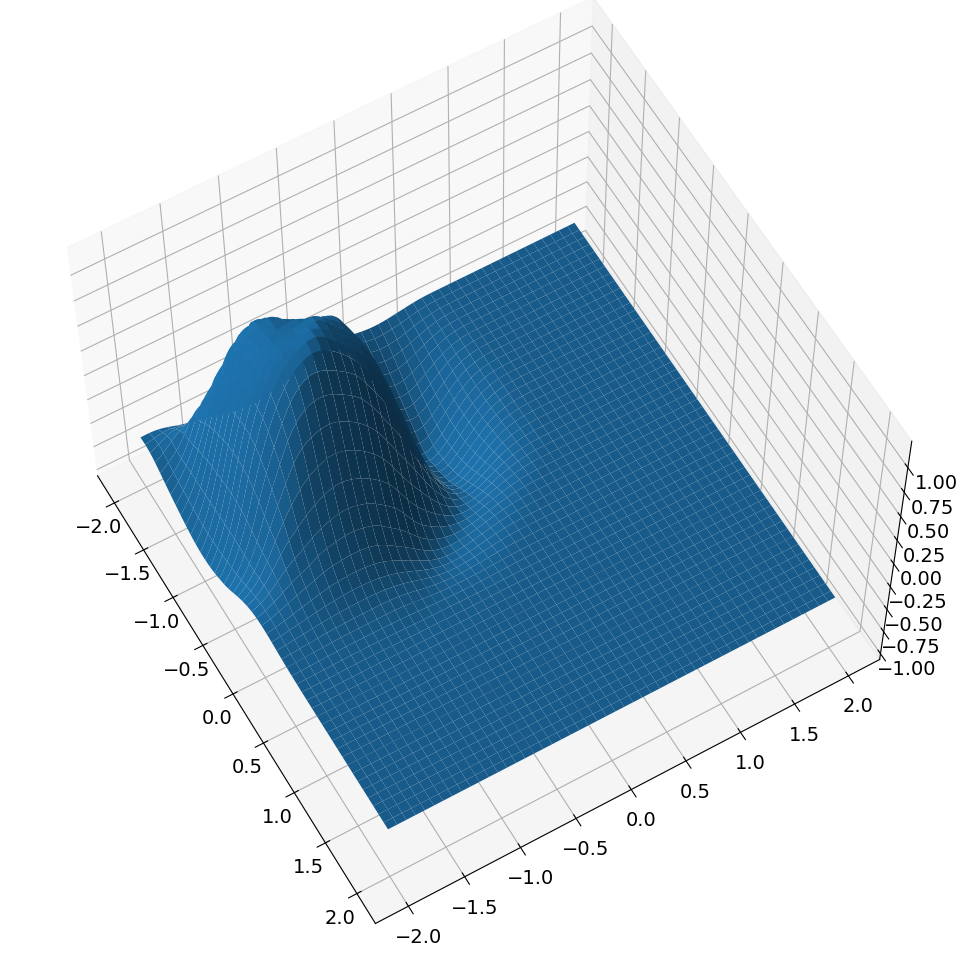

max h 1.217123
percent violation: 0.158
new position is [-1.1 -1.1  0. ]
new time is 2320
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544


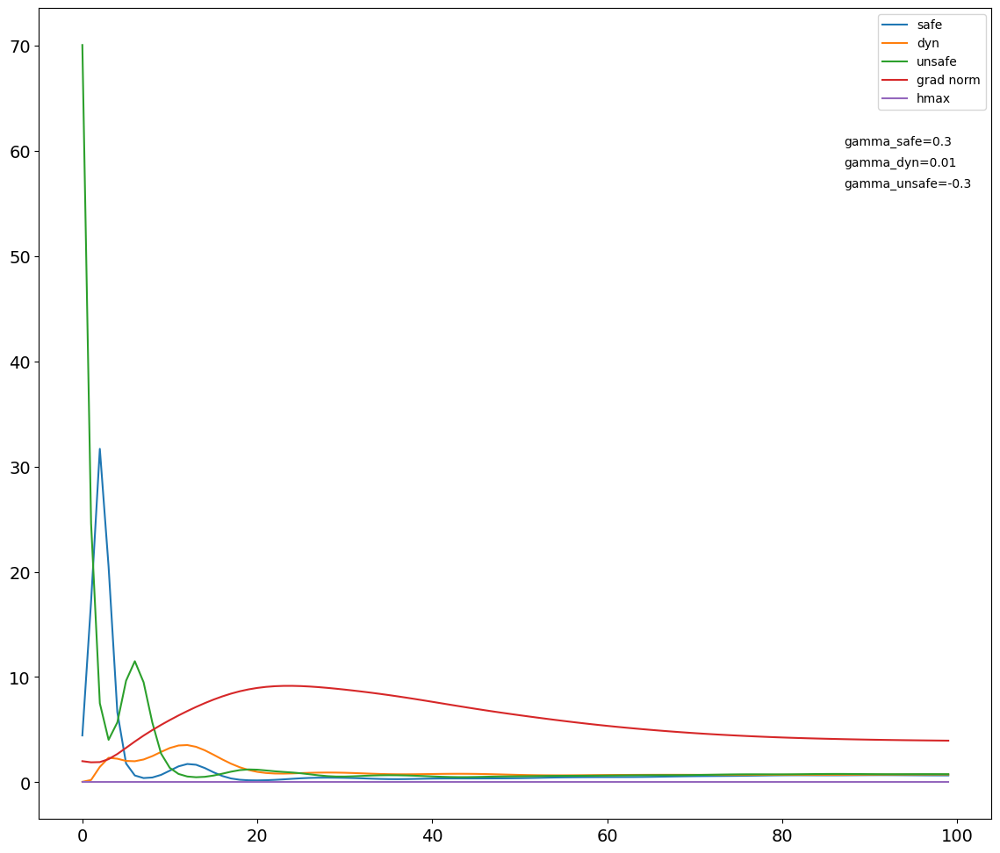

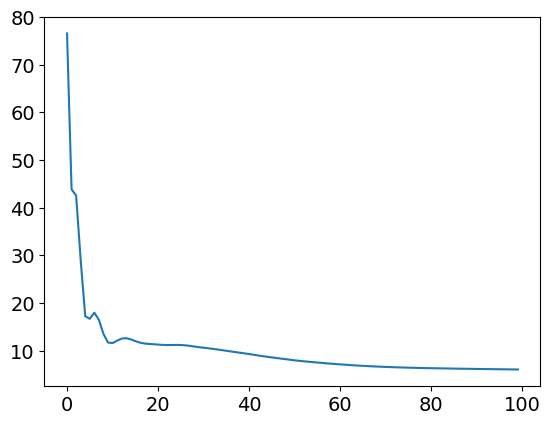

position is [-1.1 -1.1  0. ]
start time is 2320


  9%|███▍                                    | 348/4000 [00:32<05:18, 11.45it/s]

val [0.4        0.01225899] max 0.4
val [0.4        0.01534499] max 0.4
val [0.4        0.01845385] max 0.4


  9%|███▌                                    | 352/4000 [00:32<05:34, 10.90it/s]

val [0.4        0.02156197] max 0.4
val [0.4        0.02464116] max 0.4
val [0.4        0.02766614] max 0.4


  9%|███▌                                    | 354/4000 [00:33<05:43, 10.63it/s]

val [0.4        0.03060929] max 0.4
val [0.4        0.03344519] max 0.4


  9%|███▌                                    | 356/4000 [00:33<05:51, 10.36it/s]

val [0.4       0.0361488] max 0.4


  9%|███▌                                    | 358/4000 [00:33<08:24,  7.21it/s]

val [0.4        0.03870009] max 0.4
val [0.4        0.04107273] max 0.4
val [0.4        0.04324926] max 0.4


  9%|███▌                                    | 362/4000 [00:34<06:56,  8.74it/s]

val [0.4        0.04520608] max 0.4
val [0.4        0.04692865] max 0.4
val [0.4        0.04839508] max 0.4


  9%|███▋                                    | 364/4000 [00:34<06:17,  9.63it/s]

val [0.4        0.04958975] max 0.4
val [0.4        0.05049661] max 0.4
val [0.4       0.0510996] max 0.4


  9%|███▋                                    | 368/4000 [00:34<05:27, 11.10it/s]

val [0.4        0.05138367] max 0.4
val [0.4      0.051338] max 0.4
val [0.4        0.05095372] max 0.4


  9%|███▋                                    | 370/4000 [00:34<05:13, 11.56it/s]

val [0.4        0.05022905] max 0.4
val [0.4        0.04917019] max 0.4
val [0.4        0.04779334] max 0.4


  9%|███▋                                    | 374/4000 [00:35<04:55, 12.28it/s]

val [0.4        0.04613289] max 0.4
val [0.4        0.04424121] max 0.4
val [0.4        0.04219122] max 0.4


  9%|███▊                                    | 376/4000 [00:35<04:51, 12.41it/s]

val [0.4        0.04006139] max 0.4
val [0.4        0.03792654] max 0.4


  9%|███▊                                    | 378/4000 [00:35<07:24,  8.16it/s]

val [0.4       0.0358543] max 0.4
val [0.4        0.03388349] max 0.4
val [0.4       0.0320431] max 0.4


 10%|███▊                                    | 382/4000 [00:35<05:58, 10.10it/s]

val [0.4        0.03034815] max 0.4
val [0.4        0.02880382] max 0.4
val [0.4       0.0274085] max 0.4


 10%|███▊                                    | 384/4000 [00:36<05:35, 10.78it/s]

val [0.4        0.02615853] max 0.4
val [0.4        0.02505015] max 0.4
val [0.4        0.02407728] max 0.4


 10%|███▉                                    | 388/4000 [00:36<05:05, 11.82it/s]

val [0.4        0.02323481] max 0.4
val [0.4        0.02251579] max 0.4
val [0.4        0.02191288] max 0.4


 10%|███▉                                    | 390/4000 [00:36<04:58, 12.09it/s]

val [0.4       0.0214211] max 0.4
val [0.4        0.02103116] max 0.4
val [0.4       0.0207378] max 0.4


 10%|███▉                                    | 394/4000 [00:36<04:49, 12.45it/s]

val [0.4        0.02052993] max 0.4
val [0.4        0.02039973] max 0.4
val [0.4        0.02033489] max 0.4


 10%|███▉                                    | 396/4000 [00:36<04:46, 12.60it/s]

val [0.4        0.02032474] max 0.4
val [0.4        0.02035526] max 0.4
val [0.4        0.02040624] max 0.4


 10%|████                                    | 400/4000 [00:37<04:38, 12.91it/s]

val [0.4        0.02046523] max 0.4
val [0.4        0.02051173] max 0.4
val [0.4        0.02052714] max 0.4


 10%|████                                    | 402/4000 [00:37<04:40, 12.85it/s]

val [0.4        0.02049456] max 0.4
val [0.4        0.02039594] max 0.4
val [0.4        0.02021597] max 0.4


 10%|████                                    | 404/4000 [00:37<04:39, 12.89it/s]

val [0.4        0.01994032] max 0.4
val [0.4        0.01955796] max 0.4


 10%|████                                    | 408/4000 [00:38<06:25,  9.31it/s]

val [0.4        0.01905641] max 0.4
val [0.4        0.01842865] max 0.4
val [0.4        0.01766821] max 0.4


 10%|████▏                                   | 420/4000 [00:39<04:45, 12.54it/s]

val [0.4        0.00061963] max 0.4


 63%|████████████████████████▌              | 2525/4000 [03:47<01:47, 13.77it/s]

val [0.4        0.00073769] max 0.4


 98%|██████████████████████████████████████▎| 3933/4000 [05:47<00:05, 11.93it/s]

val [0.4        0.00121676] max 0.4


100%|███████████████████████████████████████| 4000/4000 [05:53<00:00, 11.32it/s]

### PLOTTING h(x(t)) ###


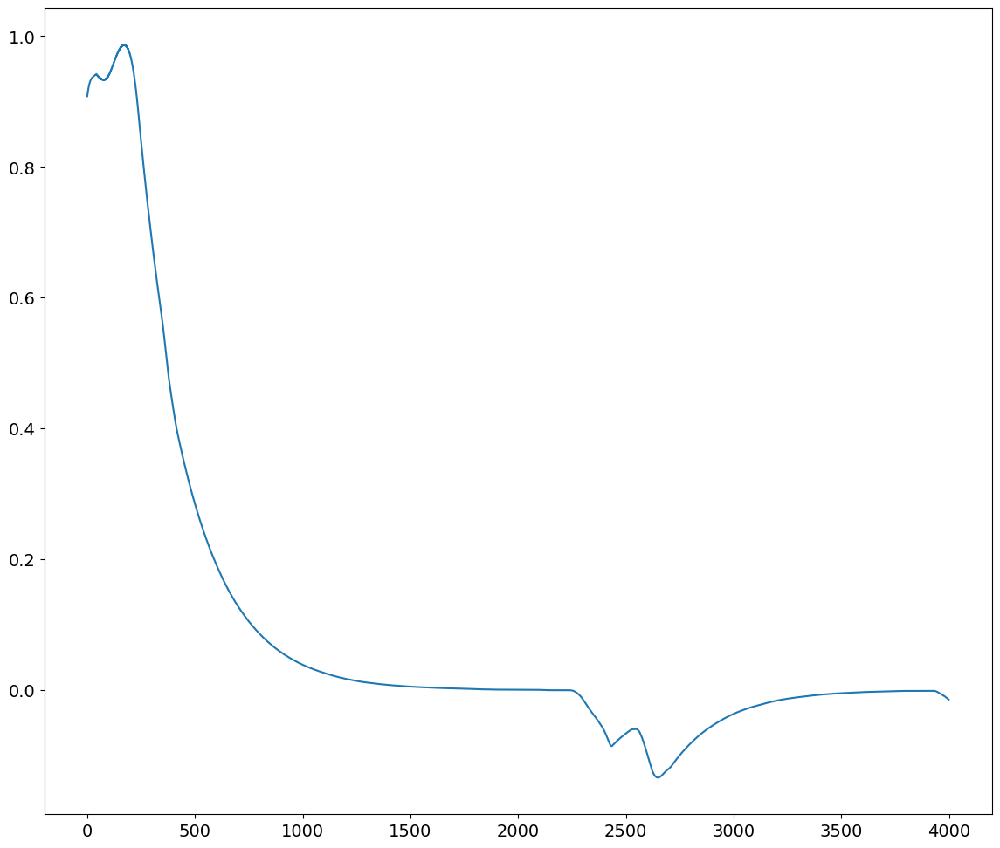

### PLOTTING CONTROL SIGNAL ###


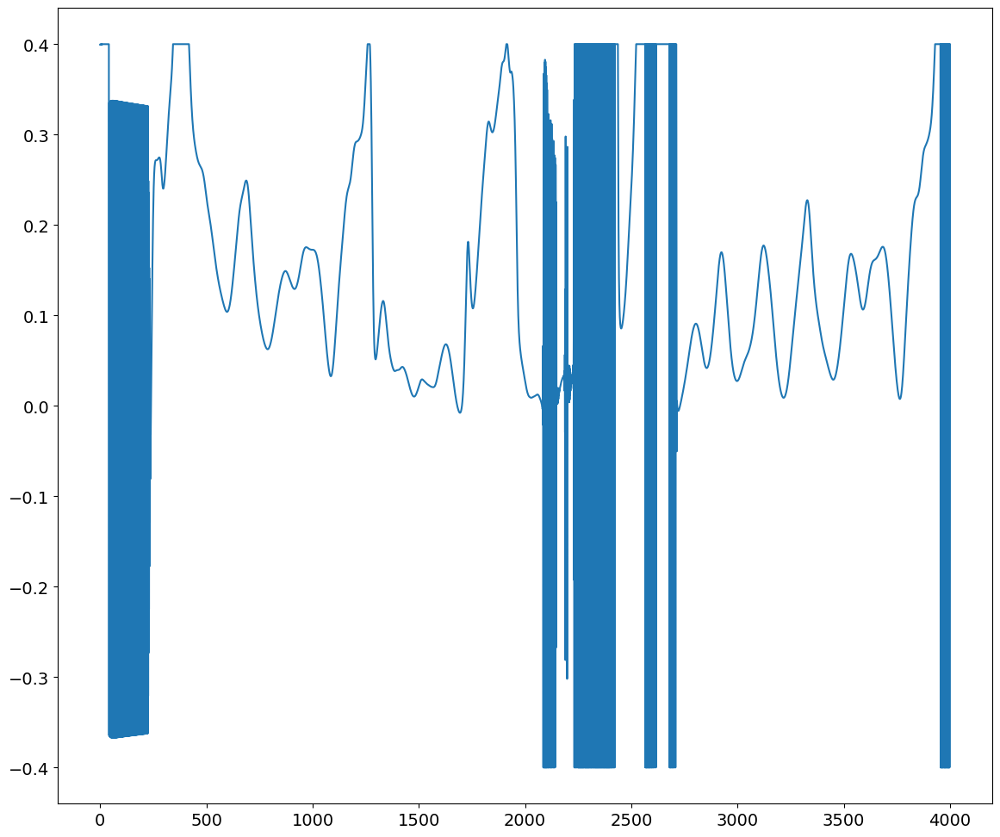

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.43it/s]


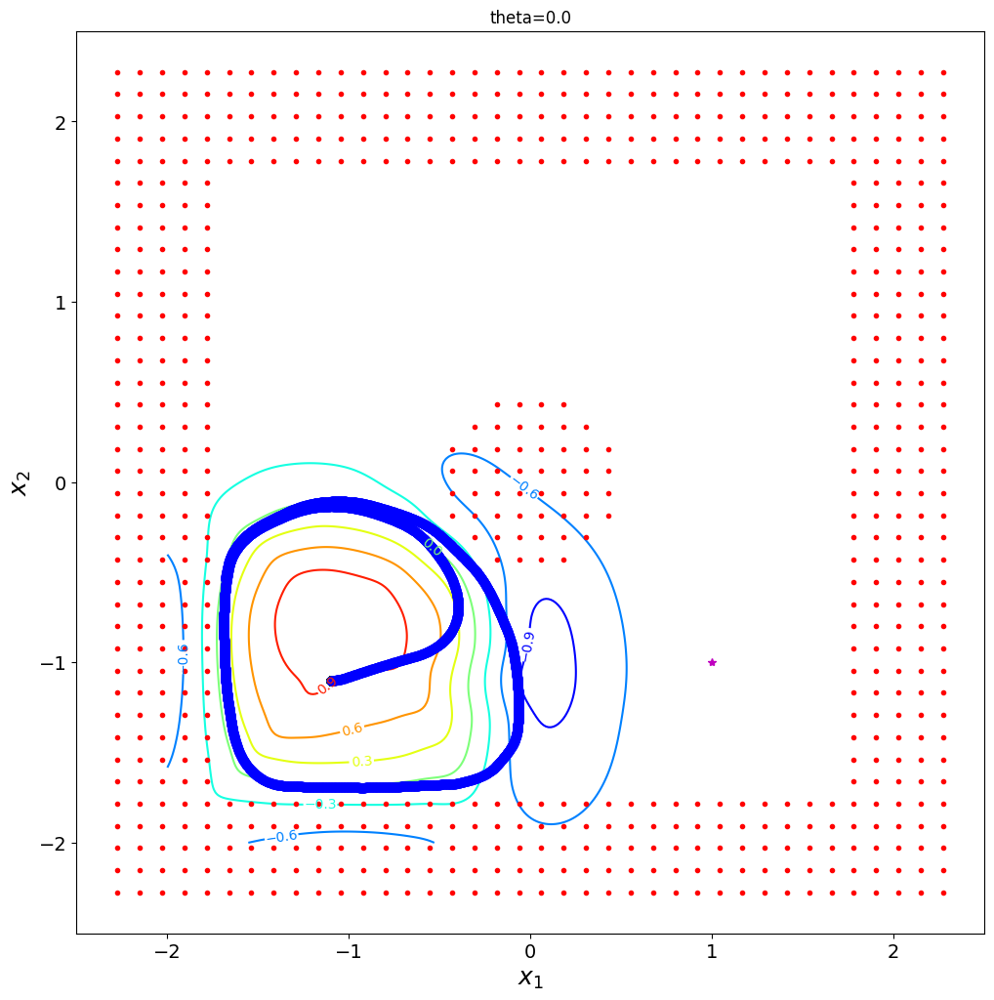

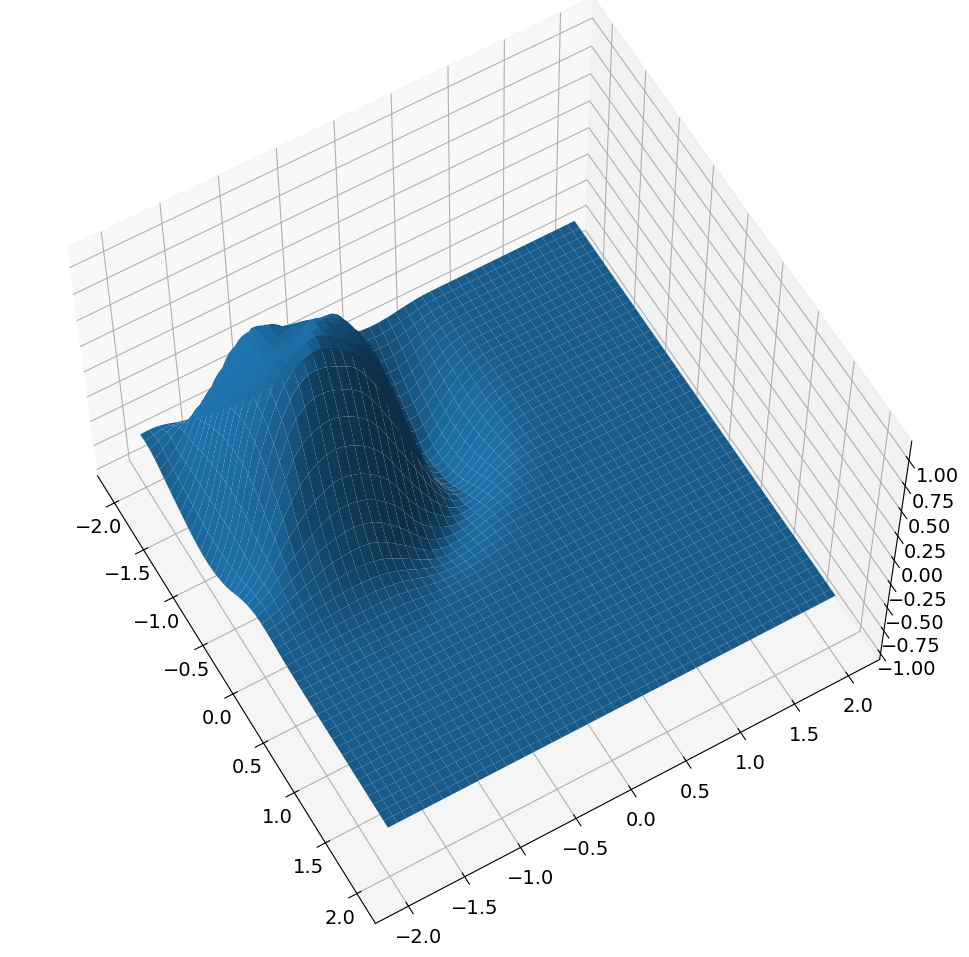

max h 1.1388469
percent violation: 0.13125
new position is [-1.1 -1.1  0. ]
new time is 2400
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544
it 100 loss: 6.061663
it 110 loss: 5.95527
it 120 loss: 5.8643136


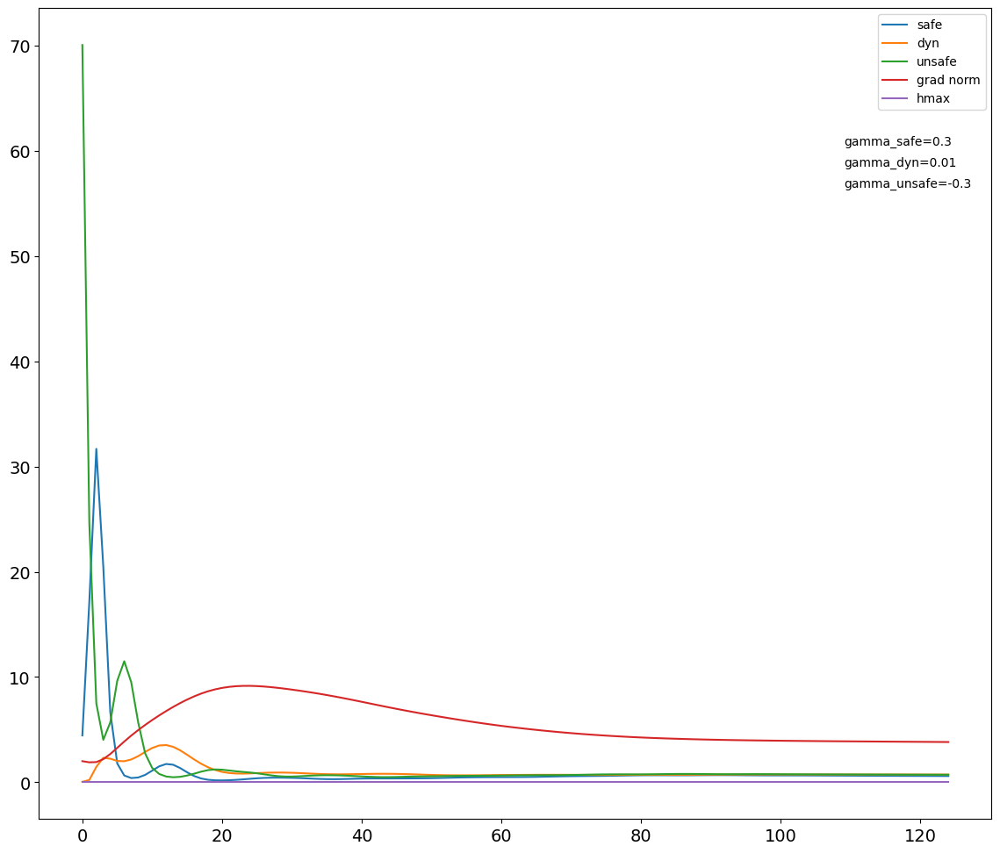

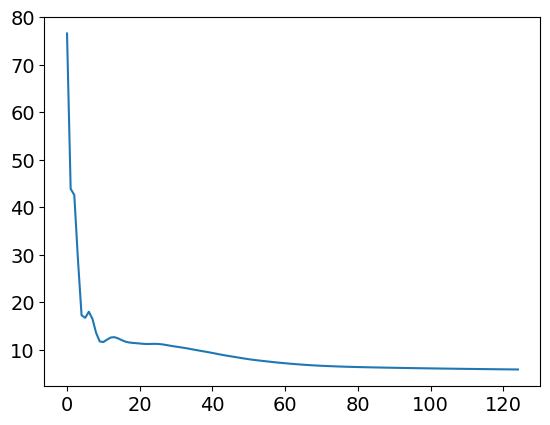

position is [-1.1 -1.1  0. ]
start time is 2400


  9%|███▍                                    | 349/4000 [00:36<05:14, 11.61it/s]

val [0.4        0.00053472] max 0.4


  9%|███▌                                    | 353/4000 [00:36<04:58, 12.21it/s]

val [0.4        0.01349168] max 0.4
val [0.4        0.01693903] max 0.4
val [0.4        0.02041289] max 0.4


  9%|███▌                                    | 355/4000 [00:36<04:56, 12.30it/s]

val [0.4        0.02388277] max 0.4
val [0.4        0.02731664] max 0.4
val [0.4        0.03068745] max 0.4


  9%|███▌                                    | 357/4000 [00:36<04:52, 12.45it/s]

val [0.4       0.0339632] max 0.4
val [0.4        0.03711674] max 0.4
val [0.4        0.04012196] max 0.4


  9%|███▌                                    | 361/4000 [00:37<05:05, 11.89it/s]

val [0.4        0.04295288] max 0.4
val [0.4        0.04558953] max 0.4
val [0.4        0.04800917] max 0.4


  9%|███▋                                    | 363/4000 [00:37<04:59, 12.13it/s]

val [0.4        0.05019068] max 0.4
val [0.4        0.05211786] max 0.4


  9%|███▋                                    | 367/4000 [00:37<06:44,  8.99it/s]

val [0.4        0.05377182] max 0.4
val [0.4        0.05513439] max 0.4
val [0.4        0.05619617] max 0.4


  9%|███▋                                    | 369/4000 [00:38<06:08,  9.84it/s]

val [0.4        0.05693616] max 0.4
val [0.4        0.05734693] max 0.4
val [0.4        0.05741479] max 0.4


  9%|███▋                                    | 373/4000 [00:38<05:27, 11.06it/s]

val [0.4        0.05713254] max 0.4
val [0.4       0.0564994] max 0.4
val [0.4        0.05552311] max 0.4


  9%|███▊                                    | 375/4000 [00:38<05:14, 11.52it/s]

val [0.4        0.05422043] max 0.4
val [0.4        0.05262217] max 0.4
val [0.4        0.05078642] max 0.4


  9%|███▊                                    | 379/4000 [00:38<04:57, 12.17it/s]

val [0.4        0.04877556] max 0.4
val [0.4        0.04667037] max 0.4
val [0.4        0.04454725] max 0.4


 10%|███▊                                    | 381/4000 [00:39<04:57, 12.18it/s]

val [0.4       0.0424681] max 0.4
val [0.4        0.04047755] max 0.4
val [0.4        0.03860422] max 0.4


 10%|███▊                                    | 385/4000 [00:39<04:53, 12.34it/s]

val [0.4        0.03686223] max 0.4
val [0.4        0.03525839] max 0.4
val [0.4        0.03379434] max 0.4


 10%|███▊                                    | 387/4000 [00:39<04:55, 12.22it/s]

val [0.4       0.0324647] max 0.4
val [0.4        0.03126661] max 0.4
val [0.4        0.03019306] max 0.4


 10%|███▉                                    | 391/4000 [00:40<06:40,  9.02it/s]

val [0.4        0.02924097] max 0.4
val [0.4        0.02840282] max 0.4
val [0.4        0.02767569] max 0.4


 10%|███▉                                    | 393/4000 [00:40<06:13,  9.66it/s]

val [0.4        0.02705156] max 0.4
val [0.4       0.0265261] max 0.4
val [0.4        0.02609168] max 0.4


 10%|███▉                                    | 397/4000 [00:40<05:36, 10.69it/s]

val [0.4        0.02574224] max 0.4
val [0.4        0.02546808] max 0.4
val [0.4        0.02525805] max 0.4


 10%|███▉                                    | 399/4000 [00:40<05:27, 10.99it/s]

val [0.4        0.02510404] max 0.4
val [0.4        0.02499173] max 0.4
val [0.4        0.02490842] max 0.4


 10%|████                                    | 403/4000 [00:41<05:10, 11.58it/s]

val [0.4        0.02483908] max 0.4
val [0.4        0.02476577] max 0.4
val [0.4        0.02467404] max 0.4


 10%|████                                    | 405/4000 [00:41<05:05, 11.76it/s]

val [0.4        0.02454618] max 0.4
val [0.4        0.02436731] max 0.4
val [0.4        0.02412264] max 0.4


 10%|████                                    | 407/4000 [00:41<05:04, 11.81it/s]

val [0.4      0.023798] max 0.4
val [0.4        0.02338108] max 0.4


 10%|████                                    | 411/4000 [00:42<06:45,  8.85it/s]

val [0.4        0.02286475] max 0.4
val [0.4        0.02223441] max 0.4
val [0.4        0.02148819] max 0.4


 10%|████▏                                   | 413/4000 [00:42<06:15,  9.55it/s]

val [0.4        0.02061662] max 0.4
val [0.4       0.0196146] max 0.4
val [0.4        0.01848117] max 0.4


 11%|████▎                                   | 425/4000 [00:43<05:01, 11.87it/s]

val [0.4        0.00081797] max 0.4


 31%|████████████▏                          | 1254/4000 [02:01<03:40, 12.44it/s]

val [0.4        0.00087419] max 0.4


 48%|██████████████████▌                    | 1910/4000 [03:04<02:52, 12.13it/s]

val [0.4        0.00080846] max 0.4
val [0.4        0.00125083] max 0.4


 63%|████████████████████████▋              | 2532/4000 [03:57<01:44, 13.99it/s]

val [0.4        0.00116076] max 0.4


 98%|██████████████████████████████████████▎| 3929/4000 [05:58<00:05, 13.34it/s]

val [0.4        0.00096737] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:04<00:00, 10.97it/s]

### PLOTTING h(x(t)) ###


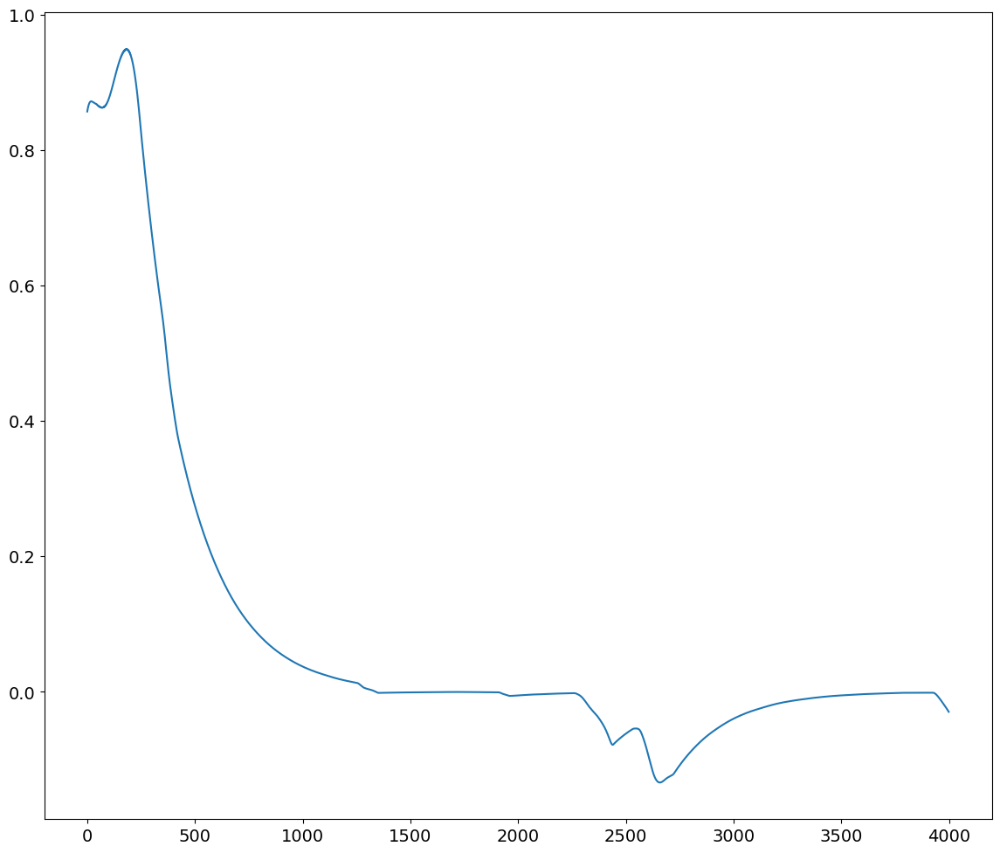

### PLOTTING CONTROL SIGNAL ###


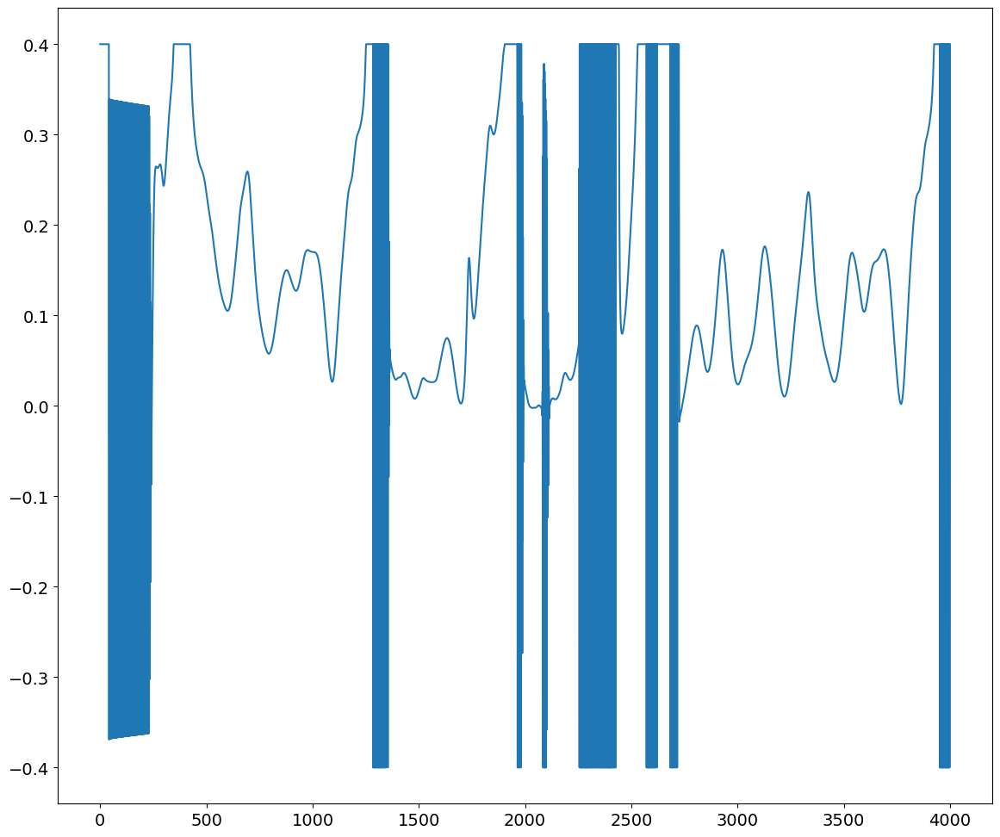

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.52it/s]


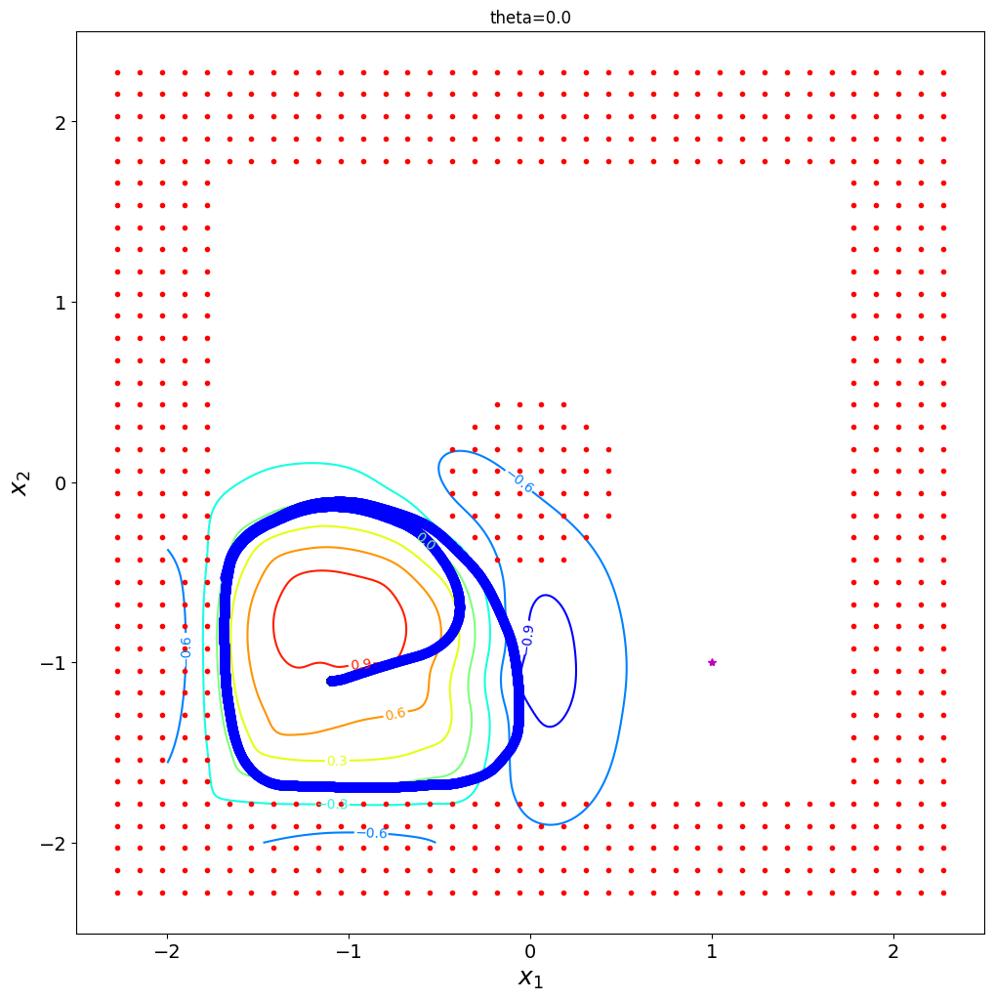

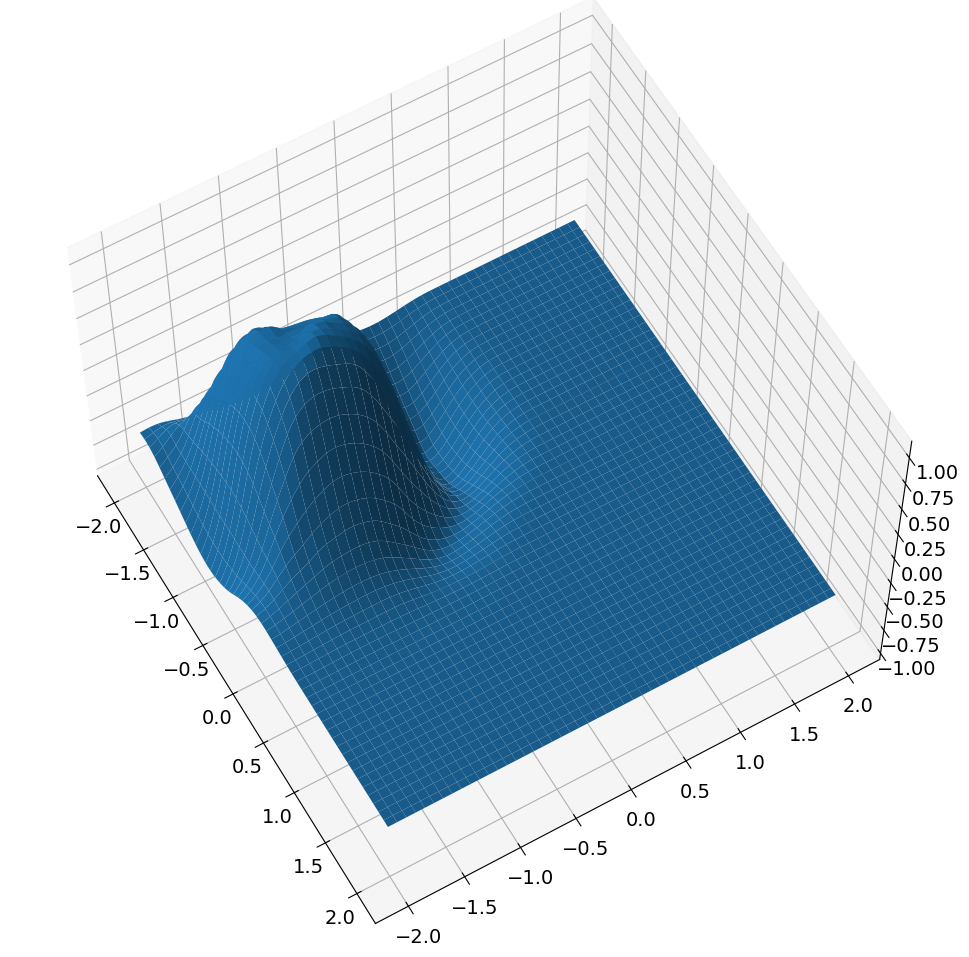

max h 1.1126478
percent violation: 0.1695
new position is [-1.1 -1.1  0. ]
new time is 2480
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544
it 100 loss: 6.061663
it 110 loss: 5.95527
it 120 loss: 5.8643136
it 130 loss: 5.7854557
it 140 loss: 5.7161074


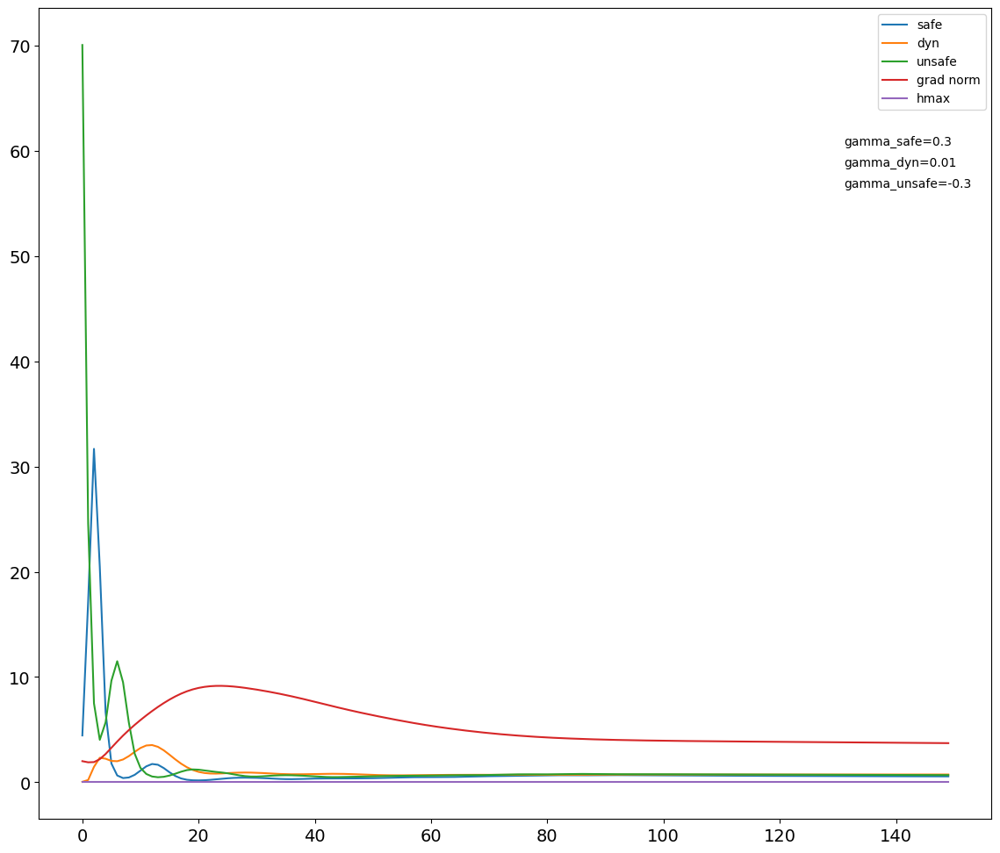

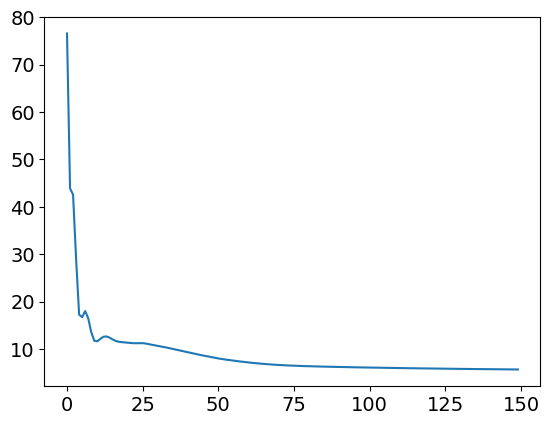

position is [-1.1 -1.1  0. ]
start time is 2480


  9%|███▍                                    | 348/4000 [00:33<04:43, 12.88it/s]

val [4.00000000e-01 3.78813945e-04] max 0.4


  9%|███▌                                    | 354/4000 [00:34<06:00, 10.12it/s]

val [0.4        0.01394904] max 0.4
val [0.4        0.01756738] max 0.4
val [0.4        0.02121507] max 0.4


  9%|███▌                                    | 358/4000 [00:34<05:18, 11.43it/s]

val [0.4        0.02485817] max 0.4
val [0.4        0.02845897] max 0.4
val [0.4        0.03199044] max 0.4


  9%|███▌                                    | 360/4000 [00:34<05:10, 11.74it/s]

val [0.4        0.03541912] max 0.4
val [0.4        0.03871659] max 0.4
val [0.4        0.04185493] max 0.4


  9%|███▋                                    | 364/4000 [00:34<04:59, 12.14it/s]

val [0.4        0.04480879] max 0.4
val [0.4        0.04755529] max 0.4
val [0.4        0.05007304] max 0.4


  9%|███▋                                    | 366/4000 [00:35<04:56, 12.27it/s]

val [0.4        0.05234225] max 0.4
val [0.4        0.05434462] max 0.4
val [0.4        0.05606445] max 0.4


  9%|███▋                                    | 370/4000 [00:35<05:02, 11.99it/s]

val [0.4       0.0574853] max 0.4
val [0.4        0.05859367] max 0.4
val [0.4        0.05937911] max 0.4


  9%|███▋                                    | 372/4000 [00:35<05:17, 11.43it/s]

val [0.4        0.05982559] max 0.4
val [0.4        0.05992629] max 0.4


  9%|███▋                                    | 374/4000 [00:36<07:48,  7.74it/s]

val [0.4        0.05967659] max 0.4
val [0.4        0.05907194] max 0.4
val [0.4        0.05812812] max 0.4


  9%|███▊                                    | 378/4000 [00:36<06:14,  9.66it/s]

val [0.4        0.05685917] max 0.4
val [0.4        0.05529888] max 0.4
val [0.4        0.05349604] max 0.4


 10%|███▊                                    | 380/4000 [00:36<05:49, 10.36it/s]

val [0.4        0.05151778] max 0.4
val [0.4        0.04943408] max 0.4
val [0.4        0.04732033] max 0.4


 10%|███▊                                    | 384/4000 [00:36<05:25, 11.10it/s]

val [0.4        0.04523297] max 0.4
val [0.4        0.04321959] max 0.4
val [0.4        0.04130545] max 0.4


 10%|███▊                                    | 386/4000 [00:37<05:14, 11.49it/s]

val [0.4        0.03951246] max 0.4
val [0.4        0.03784581] max 0.4
val [0.4        0.03630709] max 0.4


 10%|███▉                                    | 390/4000 [00:37<05:14, 11.48it/s]

val [0.4        0.03489354] max 0.4
val [0.4        0.03360432] max 0.4
val [0.4        0.03243238] max 0.4


 10%|███▉                                    | 392/4000 [00:37<08:39,  6.94it/s]

val [0.4        0.03137442] max 0.4
val [0.4        0.03042446] max 0.4
val [0.4        0.02957919] max 0.4


 10%|███▉                                    | 396/4000 [00:38<06:59,  8.59it/s]

val [0.4        0.02883245] max 0.4
val [0.4        0.02817996] max 0.4
val [0.4        0.02761711] max 0.4


 10%|███▉                                    | 398/4000 [00:38<06:53,  8.72it/s]

val [0.4        0.02713659] max 0.4
val [0.4        0.02673014] max 0.4


 10%|████                                    | 401/4000 [00:38<06:07,  9.78it/s]

val [0.4        0.02639036] max 0.4
val [0.4        0.02610622] max 0.4
val [0.4        0.02586783] max 0.4


 10%|████                                    | 403/4000 [00:38<06:09,  9.73it/s]

val [0.4       0.0256631] max 0.4
val [0.4        0.02547759] max 0.4


 10%|████                                    | 405/4000 [00:39<05:52, 10.20it/s]

val [0.4        0.02529598] max 0.4
val [0.4        0.02510646] max 0.4
val [0.4        0.02488963] max 0.4


 10%|████                                    | 409/4000 [00:39<05:16, 11.34it/s]

val [0.4        0.02463179] max 0.4
val [0.4        0.02432015] max 0.4
val [0.4        0.02394086] max 0.4


 10%|████                                    | 411/4000 [00:39<05:06, 11.70it/s]

val [0.4        0.02348092] max 0.4
val [0.4        0.02293289] max 0.4
val [0.4        0.02228489] max 0.4


 10%|████▏                                   | 415/4000 [00:39<04:49, 12.37it/s]

val [0.4        0.02152955] max 0.4
val [0.4        0.02066257] max 0.4
val [0.4        0.01967444] max 0.4


 10%|████▏                                   | 417/4000 [00:40<04:49, 12.40it/s]

val [0.4        0.01856635] max 0.4


 31%|████████████▏                          | 1255/4000 [02:09<05:16,  8.67it/s]

val [0.4        0.00120099] max 0.4


 48%|██████████████████▌                    | 1904/4000 [03:13<03:59,  8.75it/s]

val [0.4        0.00099188] max 0.4


 99%|██████████████████████████████████████▌| 3949/4000 [06:16<00:04, 12.20it/s]

val [0.4        0.00083192] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:20<00:00, 10.50it/s]

### PLOTTING h(x(t)) ###


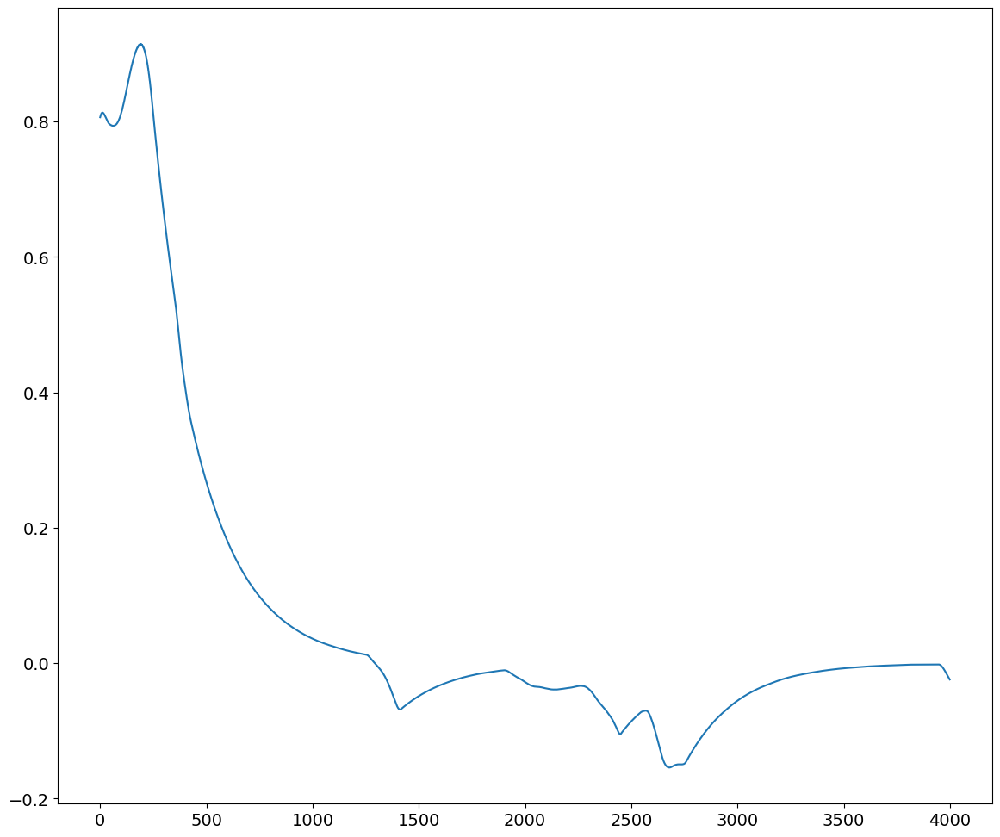

### PLOTTING CONTROL SIGNAL ###


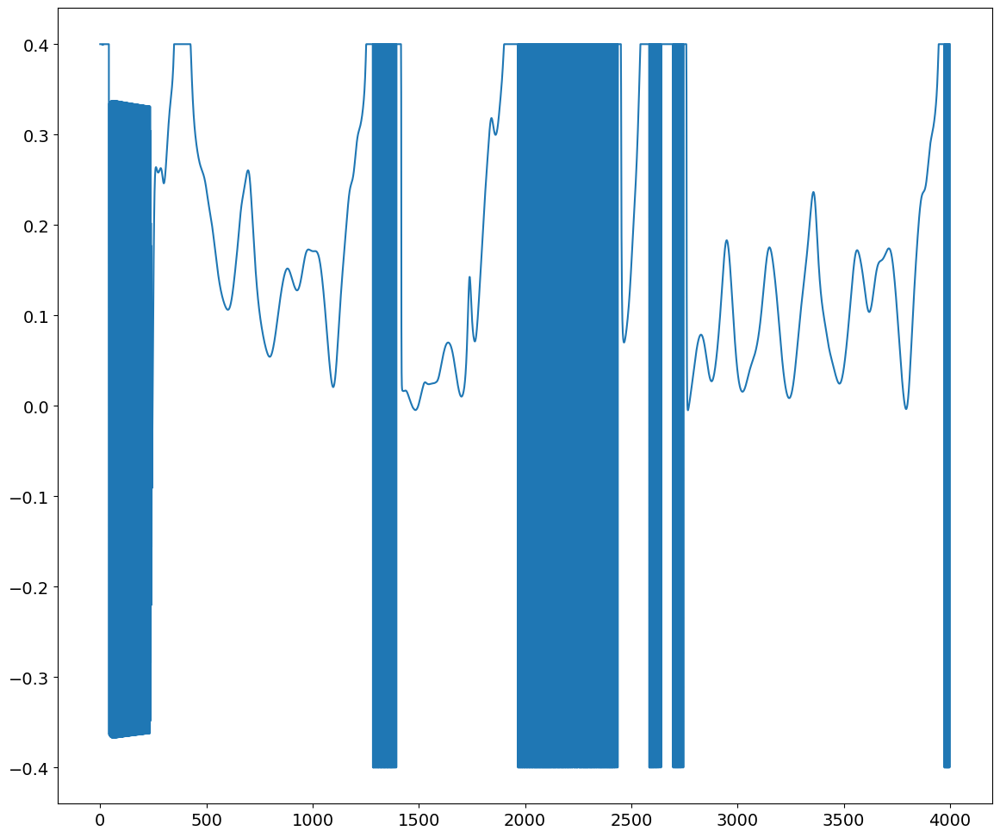

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.45it/s]


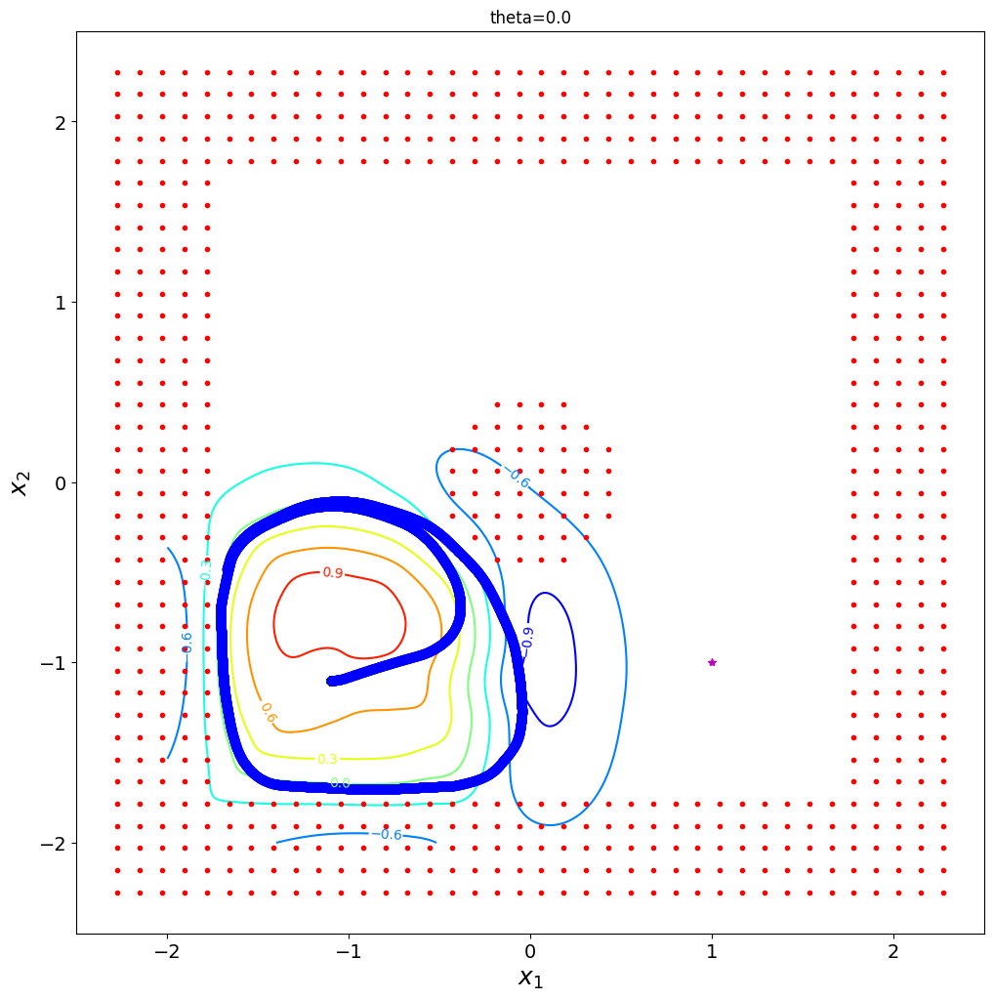

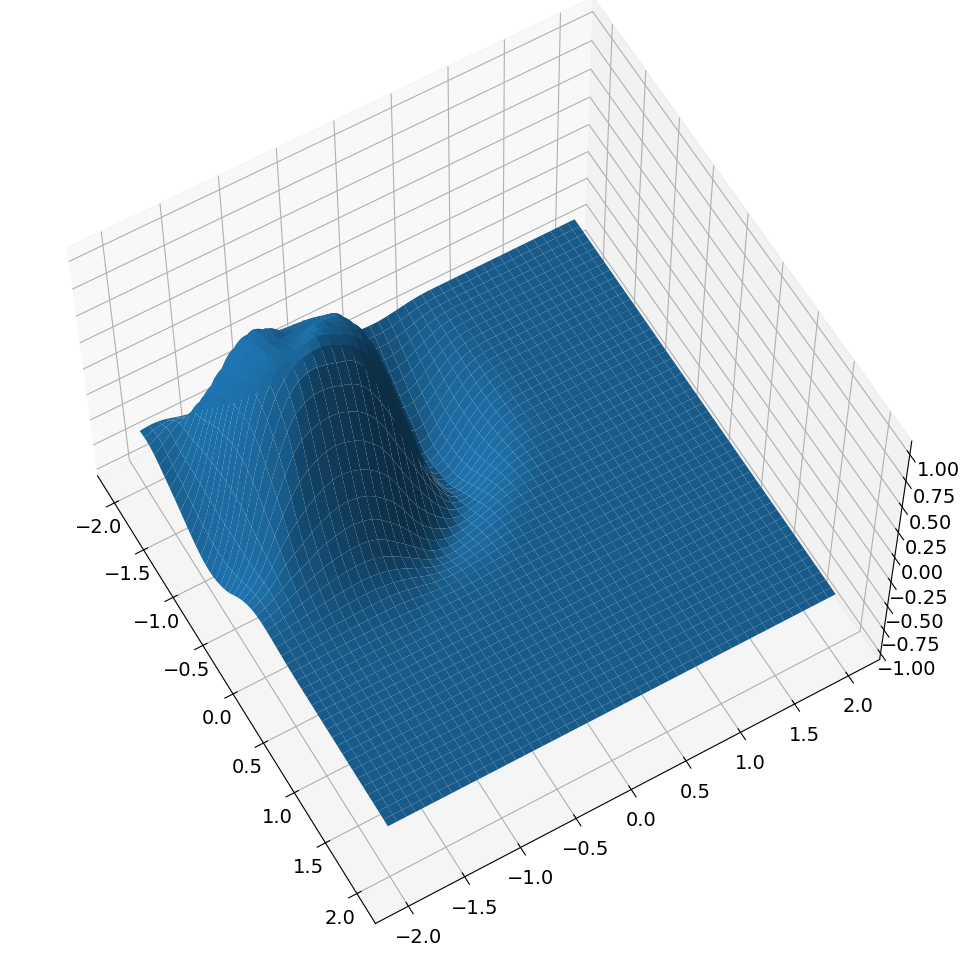

max h 1.0803332
percent violation: 0.26175
new position is [-1.1 -1.1  0. ]
new time is 2560
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544
it 100 loss: 6.061663
it 110 loss: 5.95527
it 120 loss: 5.8643136
it 130 loss: 5.7854557
it 140 loss: 5.7161074
it 150 loss: 5.6544423
it 160 loss: 5.599442
it 170 loss: 5.5499773


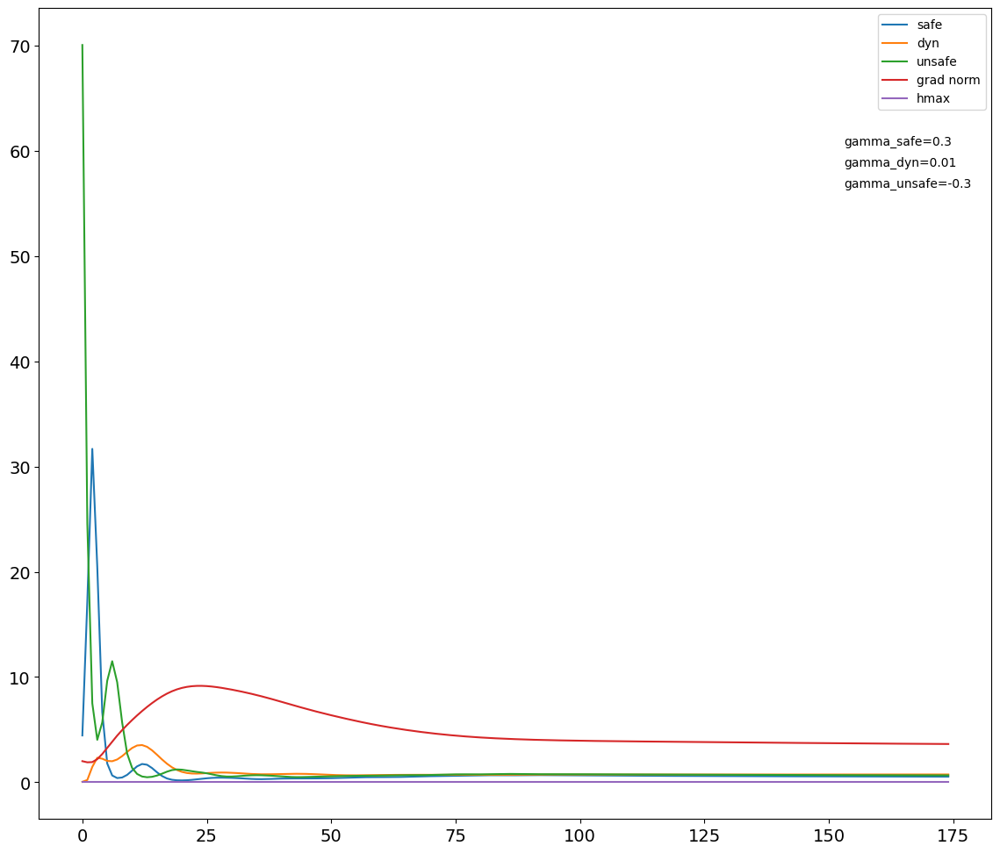

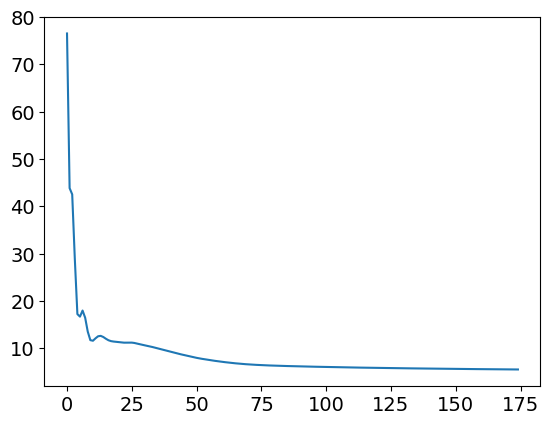

position is [-1.1 -1.1  0. ]
start time is 2560


  9%|███▌                                    | 355/4000 [00:36<07:19,  8.29it/s]

val [0.4        0.01456913] max 0.4
val [0.4        0.01823505] max 0.4
val [0.4        0.02192715] max 0.4


  9%|███▌                                    | 359/4000 [00:36<06:23,  9.49it/s]

val [0.4        0.02561198] max 0.4
val [0.4        0.02925245] max 0.4
val [0.4        0.03282083] max 0.4


  9%|███▌                                    | 361/4000 [00:36<06:14,  9.71it/s]

val [0.4        0.03627982] max 0.4
val [0.4        0.03960142] max 0.4
val [0.4       0.0427608] max 0.4


  9%|███▋                                    | 365/4000 [00:37<05:58, 10.13it/s]

val [0.4        0.04572837] max 0.4
val [0.4        0.04848188] max 0.4
val [0.4        0.05100212] max 0.4


  9%|███▋                                    | 367/4000 [00:37<05:46, 10.47it/s]

val [0.4        0.05326848] max 0.4
val [0.4        0.05526298] max 0.4
val [0.4        0.05697161] max 0.4


  9%|███▋                                    | 369/4000 [00:37<05:51, 10.33it/s]

val [0.4        0.05837769] max 0.4


  9%|███▋                                    | 371/4000 [00:37<09:04,  6.66it/s]

val [0.4        0.05946806] max 0.4
val [0.4        0.06023062] max 0.4


  9%|███▋                                    | 373/4000 [00:38<08:07,  7.44it/s]

val [0.4        0.06065448] max 0.4
val [0.4        0.06073262] max 0.4
val [0.4        0.06046068] max 0.4


  9%|███▊                                    | 377/4000 [00:38<06:30,  9.29it/s]

val [0.4        0.05983887] max 0.4
val [0.4        0.05887974] max 0.4
val [0.4       0.0575994] max 0.4


  9%|███▊                                    | 379/4000 [00:38<06:05,  9.90it/s]

val [0.4        0.05603256] max 0.4
val [0.4        0.05422801] max 0.4
val [0.4        0.05224829] max 0.4


 10%|███▊                                    | 383/4000 [00:38<05:29, 10.99it/s]

val [0.4        0.05016161] max 0.4
val [0.4        0.04803683] max 0.4
val [0.4        0.04593261] max 0.4


 10%|███▊                                    | 385/4000 [00:39<05:23, 11.17it/s]

val [0.4        0.04389146] max 0.4
val [0.4        0.04194472] max 0.4
val [0.4        0.04010773] max 0.4


 10%|███▉                                    | 389/4000 [00:39<05:32, 10.84it/s]

val [0.4       0.0383907] max 0.4
val [0.4        0.03679583] max 0.4
val [0.4        0.03532225] max 0.4


 10%|███▉                                    | 391/4000 [00:39<05:29, 10.96it/s]

val [0.4        0.03396518] max 0.4
val [0.4        0.03272316] max 0.4
val [0.4       0.0315906] max 0.4


 10%|███▉                                    | 393/4000 [00:39<05:31, 10.87it/s]

val [0.4        0.03056335] max 0.4
val [0.4       0.0296365] max 0.4


 10%|███▉                                    | 395/4000 [00:40<05:47, 10.38it/s]

val [0.4        0.02880667] max 0.4
val [0.4        0.02807036] max 0.4


 10%|███▉                                    | 399/4000 [00:40<07:33,  7.94it/s]

val [0.4        0.02742004] max 0.4
val [0.4        0.02685294] max 0.4
val [0.4        0.02635899] max 0.4


 10%|████                                    | 402/4000 [00:41<06:40,  8.99it/s]

val [0.4       0.0259322] max 0.4
val [0.4        0.02556142] max 0.4
val [0.4        0.02523968] max 0.4


 10%|████                                    | 404/4000 [00:41<06:15,  9.57it/s]

val [0.4        0.02495284] max 0.4
val [0.4        0.02468899] max 0.4
val [0.4        0.02443408] max 0.4


 10%|████                                    | 408/4000 [00:41<05:40, 10.54it/s]

val [0.4        0.02417364] max 0.4
val [0.4        0.02389248] max 0.4
val [0.4        0.02357553] max 0.4


 10%|████                                    | 410/4000 [00:41<05:35, 10.71it/s]

val [0.4        0.02320958] max 0.4
val [0.4        0.02278413] max 0.4
val [0.4        0.02228299] max 0.4


 10%|████                                    | 412/4000 [00:41<05:27, 10.96it/s]

val [0.4        0.02169788] max 0.4
val [0.4        0.02102154] max 0.4
val [0.4        0.02024374] max 0.4


 10%|████▏                                   | 416/4000 [00:42<05:25, 11.00it/s]

val [0.4        0.01935911] max 0.4
val [0.4       0.0183609] max 0.4


 31%|████████████▏                          | 1256/4000 [02:03<03:43, 12.26it/s]

val [0.4        0.00144767] max 0.4


 46%|██████████████████                     | 1853/4000 [02:59<03:01, 11.86it/s]

val [0.4        0.00048665] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:12<00:00, 10.74it/s]

### PLOTTING h(x(t)) ###


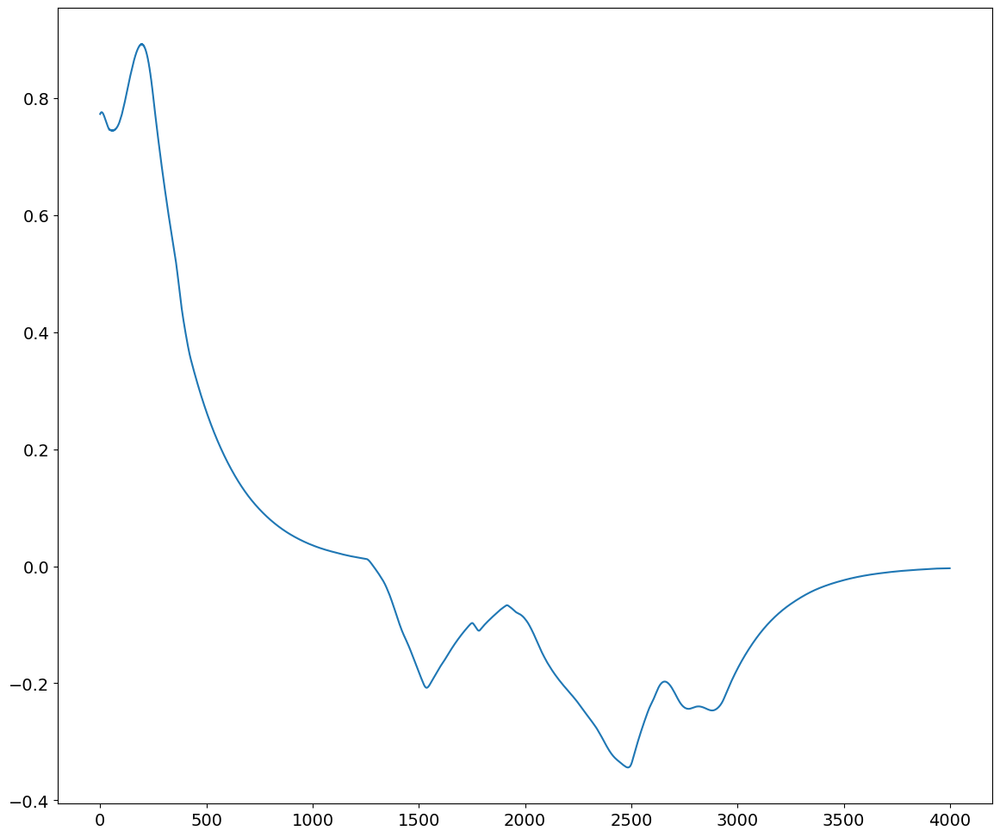

### PLOTTING CONTROL SIGNAL ###


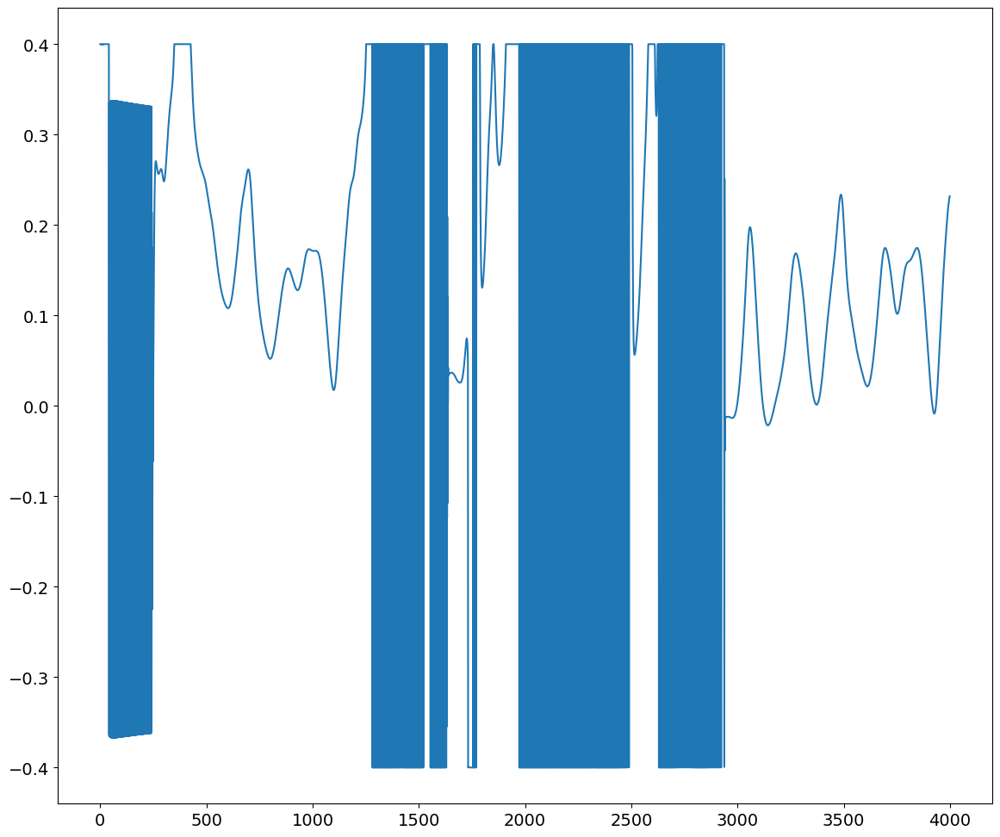

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████████▎| 60/61 [00:17<00:00,  3.44it/s]


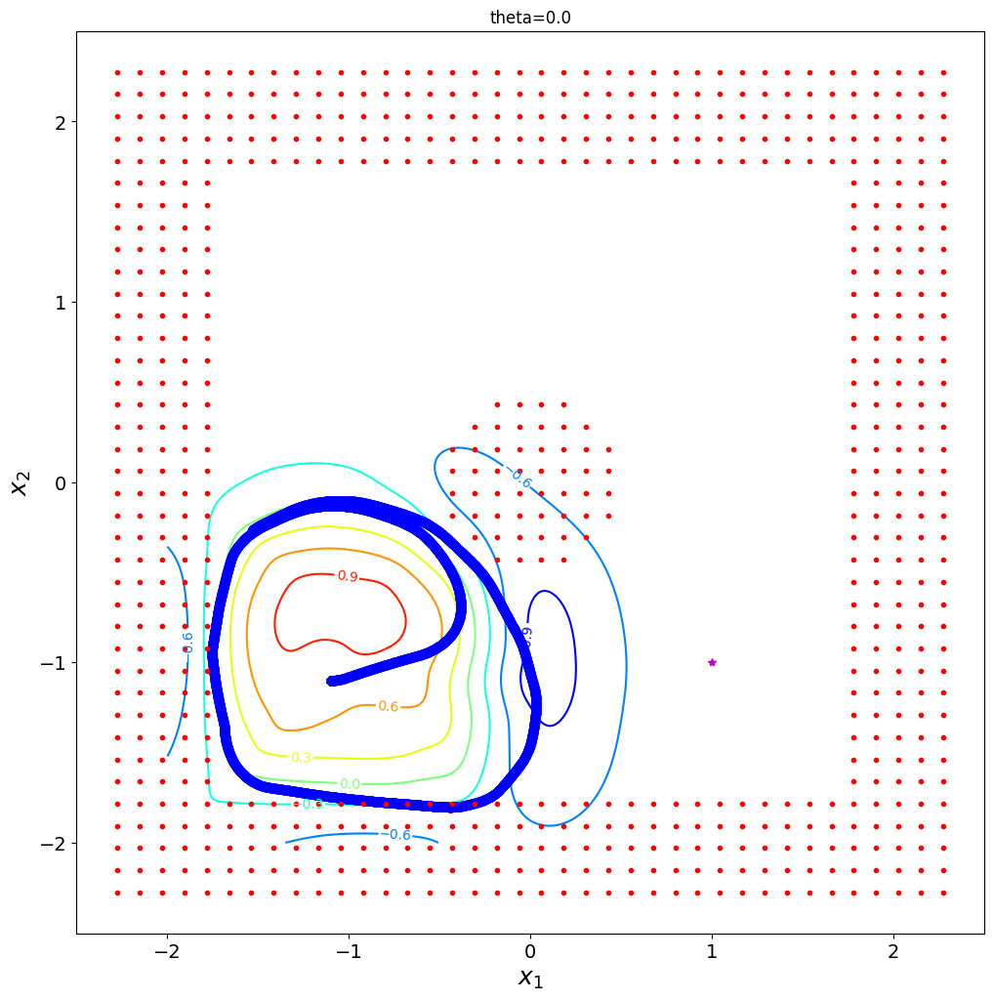

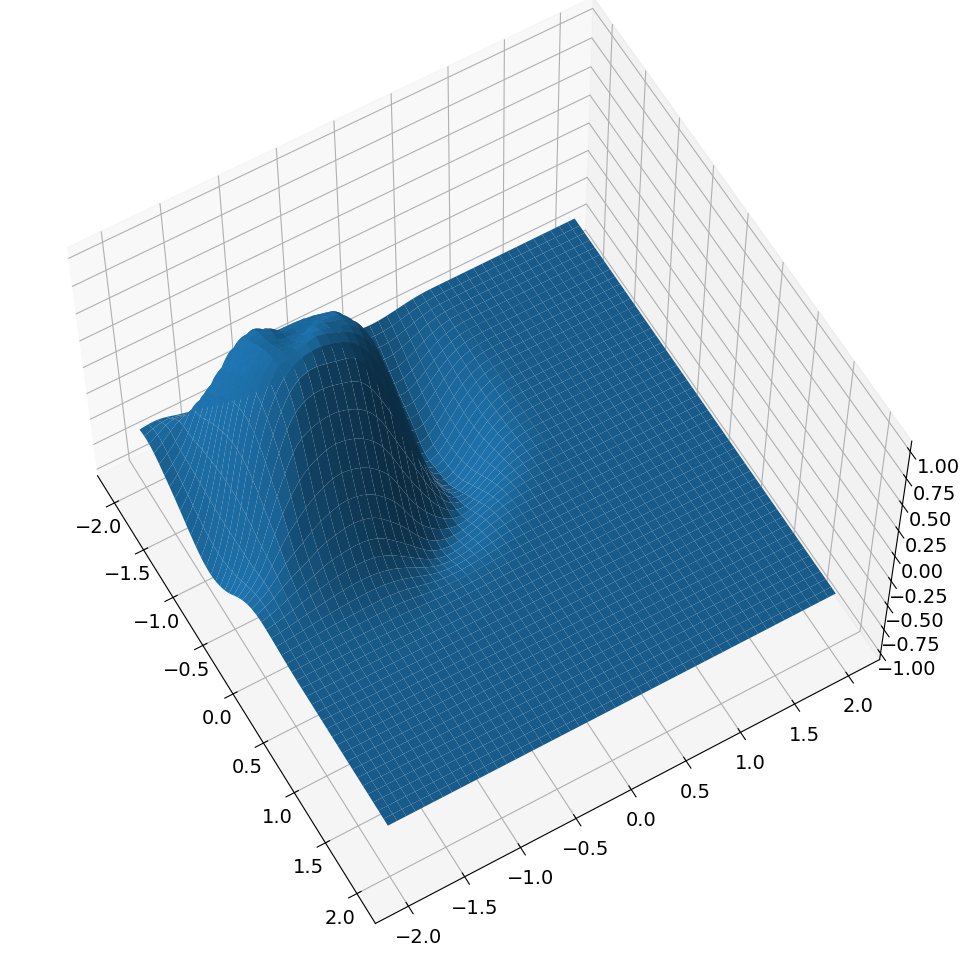

max h 1.0517459
percent violation: 0.35825
new position is [-1.1 -1.1  0. ]
new time is 2640
[ -1.5984802  -0.6010246   1.6762848 ...  -2.4819946 -11.753845
  11.490635 ]
gamma_safe: 0.3
gamma_dyn: 0.01
gamma_unsafe -0.3
lam safe 1
lam_dyn 0.1
lam_unsafe 1
lam_dh 0.0001
lam_th 0.0
hmax 10
it 0 loss: 76.55019
it 10 loss: 11.605278
it 20 loss: 11.293823
it 30 loss: 10.635479
it 40 loss: 9.306473
it 50 loss: 7.9898863
it 60 loss: 7.141364
it 70 loss: 6.608191
it 80 loss: 6.342764
it 90 loss: 6.185544
it 100 loss: 6.061663
it 110 loss: 5.95527
it 120 loss: 5.8643136
it 130 loss: 5.7854557
it 140 loss: 5.7161074
it 150 loss: 5.6544423
it 160 loss: 5.599442
it 170 loss: 5.5499773
it 180 loss: 5.50518
it 190 loss: 5.4644375


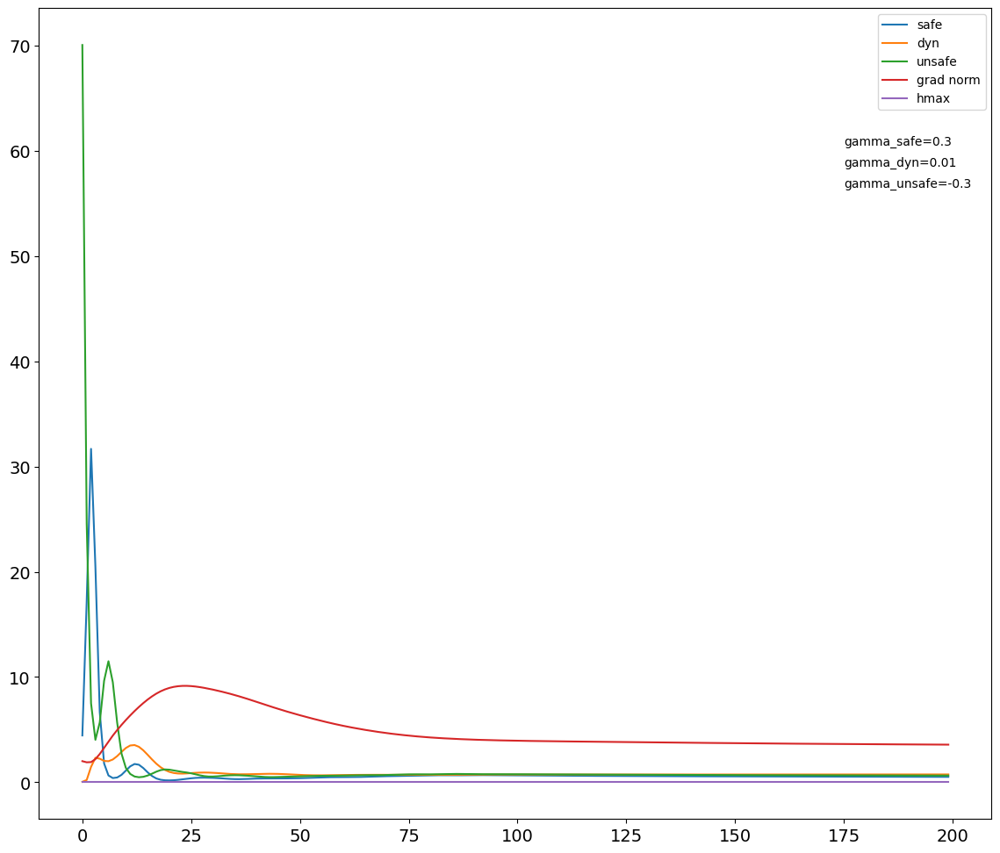

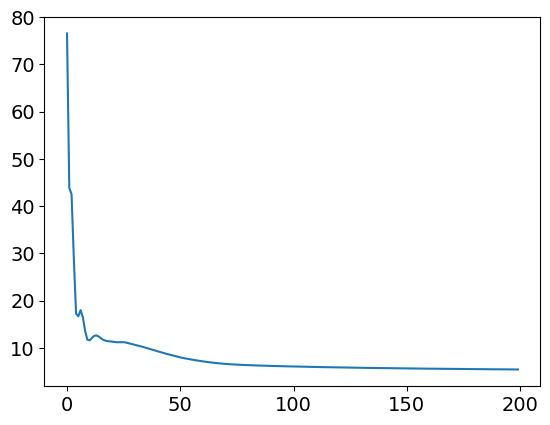

position is [-1.1 -1.1  0. ]
start time is 2640


  9%|███▌                                    | 356/4000 [00:33<04:59, 12.18it/s]

val [0.4        0.01489498] max 0.4
val [0.4        0.01860648] max 0.4
val [0.4        0.02233969] max 0.4


  9%|███▌                                    | 360/4000 [00:34<05:00, 12.12it/s]

val [0.4        0.02605591] max 0.4
val [0.4        0.02972354] max 0.4
val [0.4        0.03330539] max 0.4


  9%|███▌                                    | 362/4000 [00:34<04:59, 12.14it/s]

val [0.4        0.03677218] max 0.4
val [0.4        0.04009552] max 0.4
val [0.4        0.04324486] max 0.4


  9%|███▋                                    | 364/4000 [00:34<04:59, 12.13it/s]

val [0.4        0.04619384] max 0.4
val [0.4        0.04892306] max 0.4


  9%|███▋                                    | 368/4000 [00:34<06:45,  8.96it/s]

val [0.4      0.051409] max 0.4
val [0.4        0.05363512] max 0.4
val [0.4        0.05558338] max 0.4


  9%|███▋                                    | 370/4000 [00:35<06:15,  9.68it/s]

val [0.4        0.05723732] max 0.4
val [0.4       0.0585853] max 0.4
val [0.4        0.05961378] max 0.4


  9%|███▋                                    | 374/4000 [00:35<05:33, 10.88it/s]

val [0.4        0.06031029] max 0.4
val [0.4        0.06066628] max 0.4
val [0.4        0.06067646] max 0.4


  9%|███▊                                    | 376/4000 [00:35<05:21, 11.26it/s]

val [0.4        0.06033575] max 0.4
val [0.4        0.05964916] max 0.4
val [0.4        0.05863137] max 0.4


 10%|███▊                                    | 380/4000 [00:35<05:09, 11.68it/s]

val [0.4        0.05730038] max 0.4
val [0.4        0.05569525] max 0.4
val [0.4        0.05386302] max 0.4


 10%|███▊                                    | 382/4000 [00:36<05:09, 11.71it/s]

val [0.4        0.05186885] max 0.4
val [0.4        0.04977751] max 0.4
val [0.4        0.04765668] max 0.4


 10%|███▊                                    | 386/4000 [00:36<05:04, 11.88it/s]

val [0.4        0.04555783] max 0.4
val [0.4        0.04352165] max 0.4
val [0.4        0.04157712] max 0.4


 10%|███▉                                    | 388/4000 [00:36<05:03, 11.92it/s]

val [0.4        0.03974036] max 0.4
val [0.4        0.03801675] max 0.4


 10%|███▉                                    | 390/4000 [00:37<07:40,  7.85it/s]

val [0.4        0.03641127] max 0.4
val [0.4        0.03492337] max 0.4
val [0.4        0.03354772] max 0.4


 10%|███▉                                    | 394/4000 [00:37<06:14,  9.62it/s]

val [0.4       0.0322815] max 0.4
val [0.4        0.03112046] max 0.4
val [0.4        0.03006231] max 0.4


 10%|███▉                                    | 396/4000 [00:37<05:51, 10.27it/s]

val [0.4        0.02910085] max 0.4
val [0.4        0.02823367] max 0.4
val [0.4        0.02745652] max 0.4


 10%|████                                    | 400/4000 [00:37<05:22, 11.15it/s]

val [0.4        0.02676379] max 0.4
val [0.4        0.02615066] max 0.4
val [0.4        0.02560949] max 0.4


 10%|████                                    | 402/4000 [00:38<05:15, 11.42it/s]

val [0.4        0.02513574] max 0.4
val [0.4        0.02471554] max 0.4
val [0.4        0.02434333] max 0.4


 10%|████                                    | 406/4000 [00:38<05:04, 11.82it/s]

val [0.4        0.02400665] max 0.4
val [0.4        0.02369307] max 0.4
val [0.4        0.02338767] max 0.4


 10%|████                                    | 408/4000 [00:38<07:35,  7.88it/s]

val [0.4       0.0230781] max 0.4
val [0.4        0.02274794] max 0.4
val [0.4        0.02238611] max 0.4


 10%|████                                    | 412/4000 [00:39<06:09,  9.71it/s]

val [0.4        0.02197767] max 0.4
val [0.4        0.02150944] max 0.4
val [0.4        0.02096967] max 0.4


 10%|████▏                                   | 414/4000 [00:39<05:48, 10.30it/s]

val [0.4        0.02035092] max 0.4
val [0.4        0.01964265] max 0.4
val [0.4        0.01883745] max 0.4


 10%|████▏                                   | 418/4000 [00:39<05:17, 11.29it/s]

val [0.4        0.01792754] max 0.4


 11%|████▎                                   | 428/4000 [00:40<04:51, 12.26it/s]

val [0.4        0.00082543] max 0.4


 31%|████████████▏                          | 1256/4000 [01:56<03:44, 12.24it/s]

val [0.4        0.00157886] max 0.4


100%|███████████████████████████████████████| 4000/4000 [06:14<00:00, 10.67it/s]


### PLOTTING h(x(t)) ###


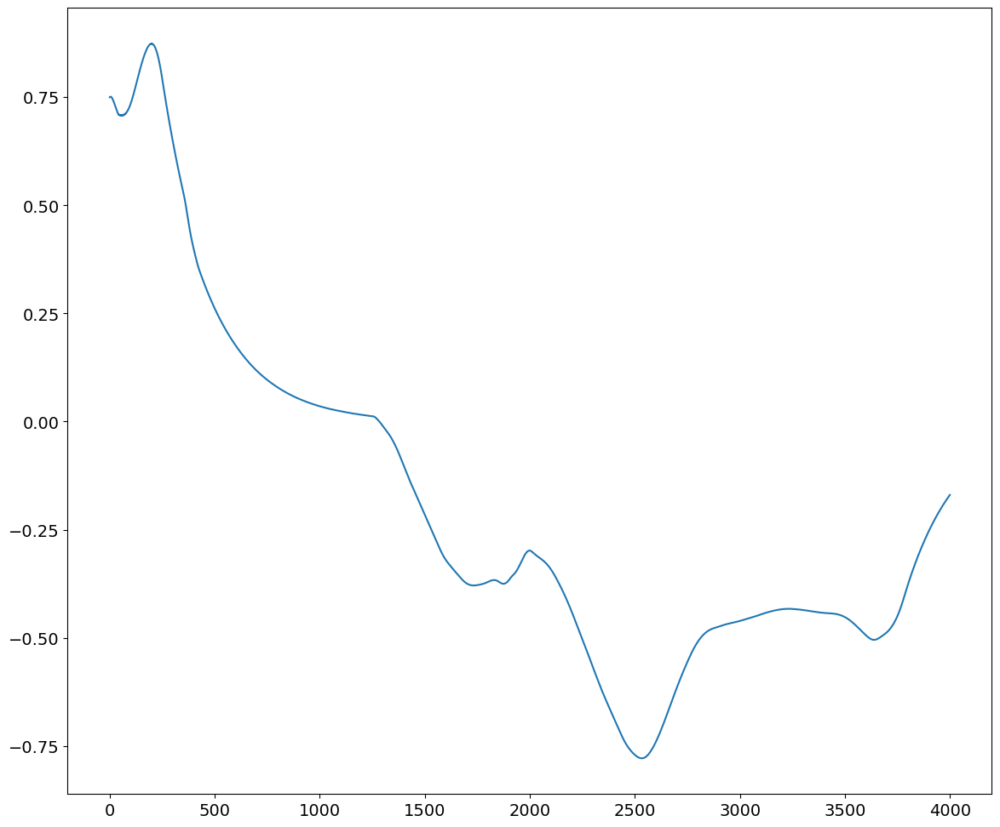

### PLOTTING CONTROL SIGNAL ###


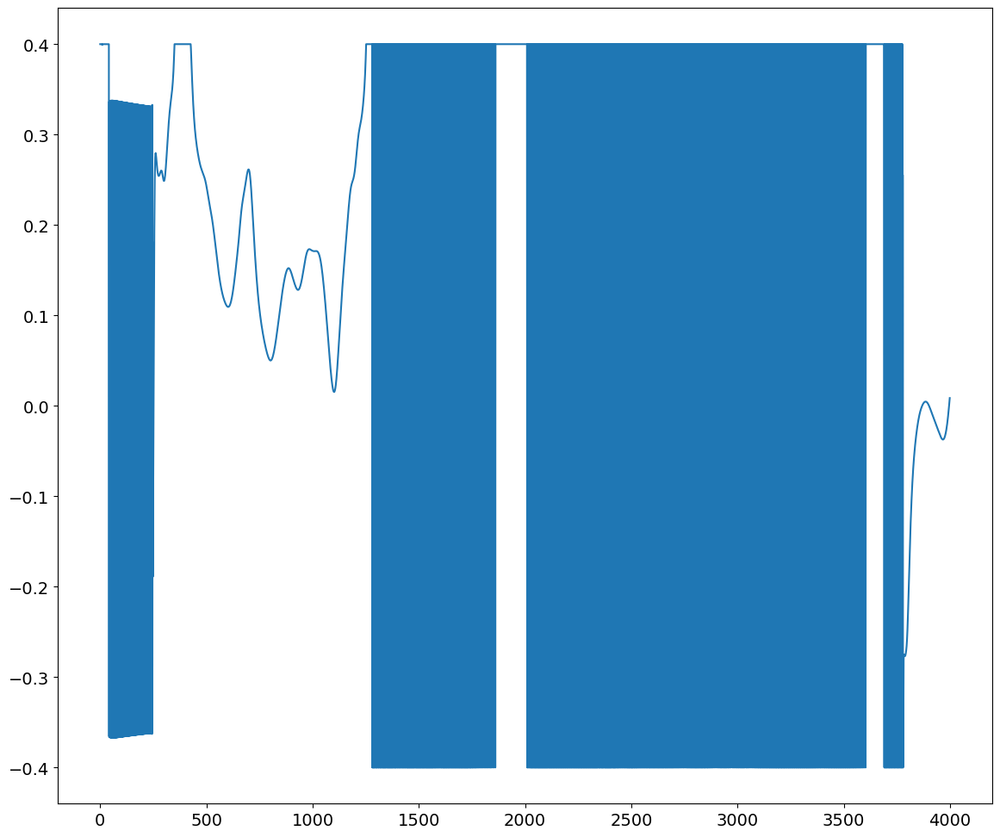

### PLOTTING CBF AND TRAJECTORY ###
num data 90000
partition 1500
remainder 0


 98%|██████████████████████████████████████▎| 60/61 [14:22:46<14:22, 862.77s/it]


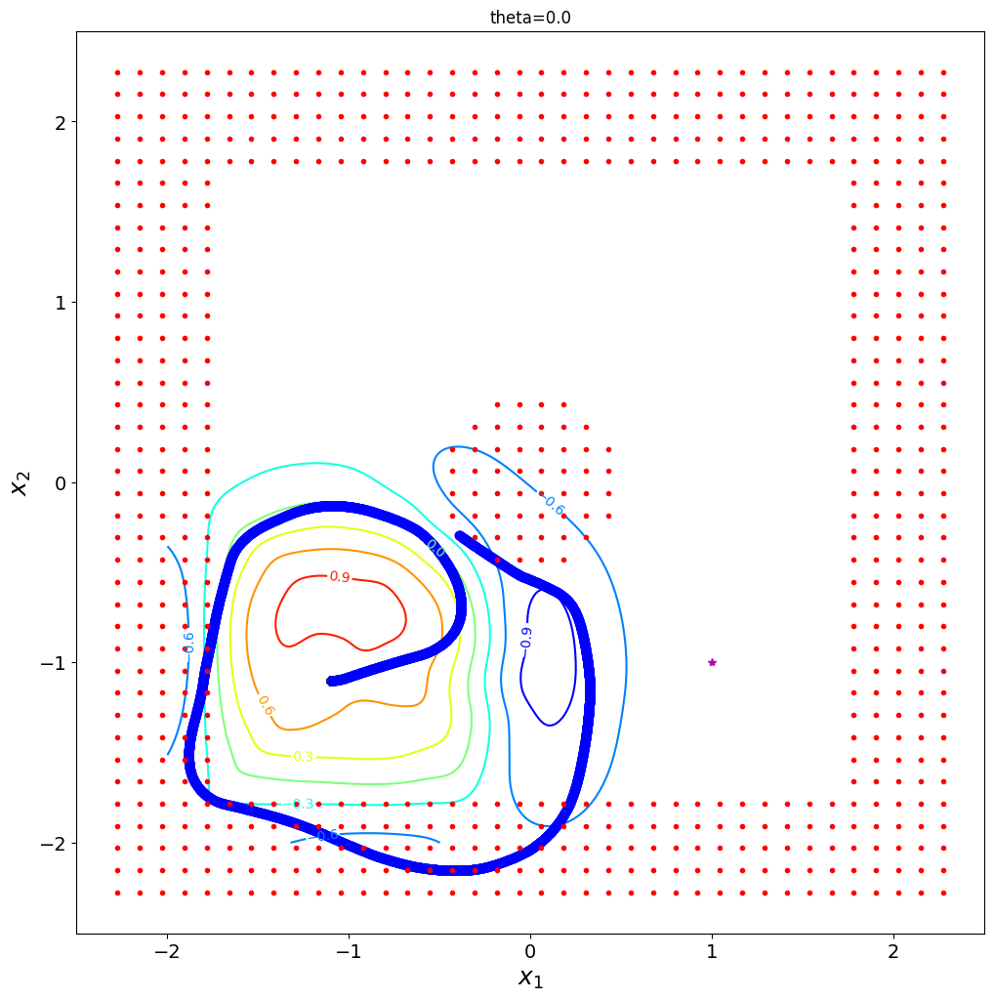

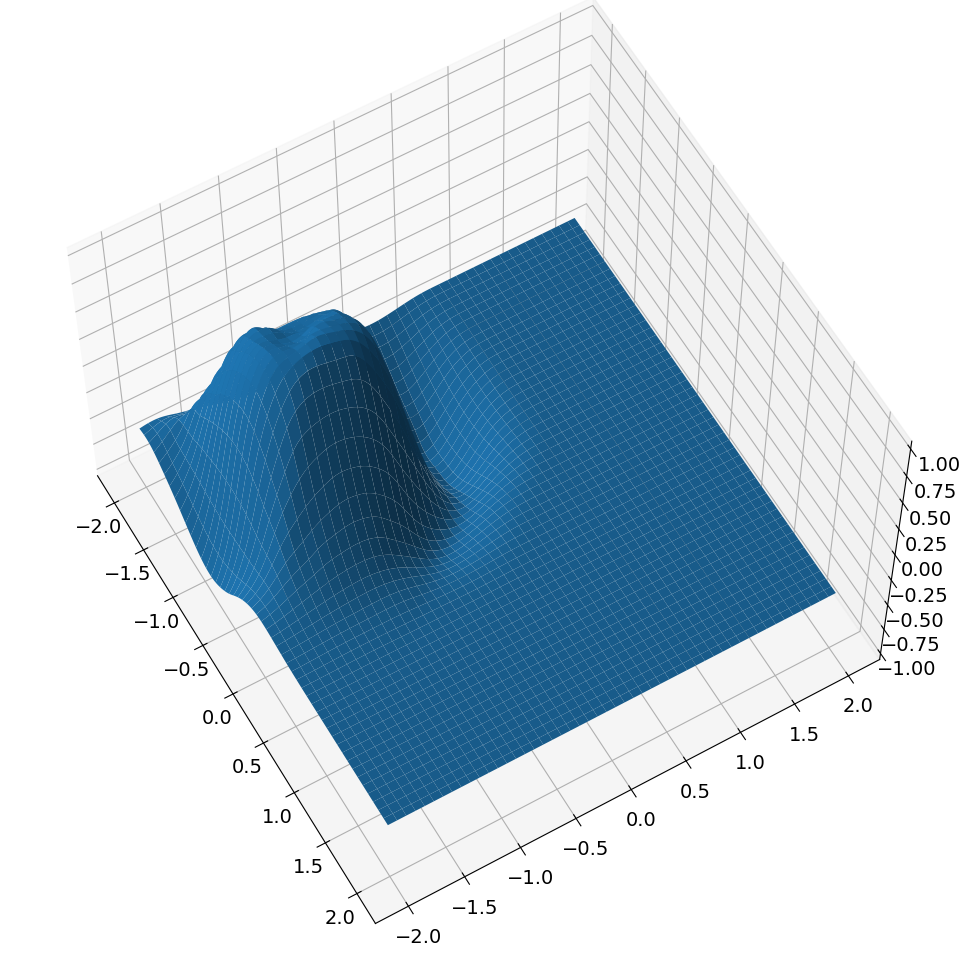

max h 1.0270449
percent violation: 0.64975
new position is [-1.1 -1.1  0. ]
new time is 2720


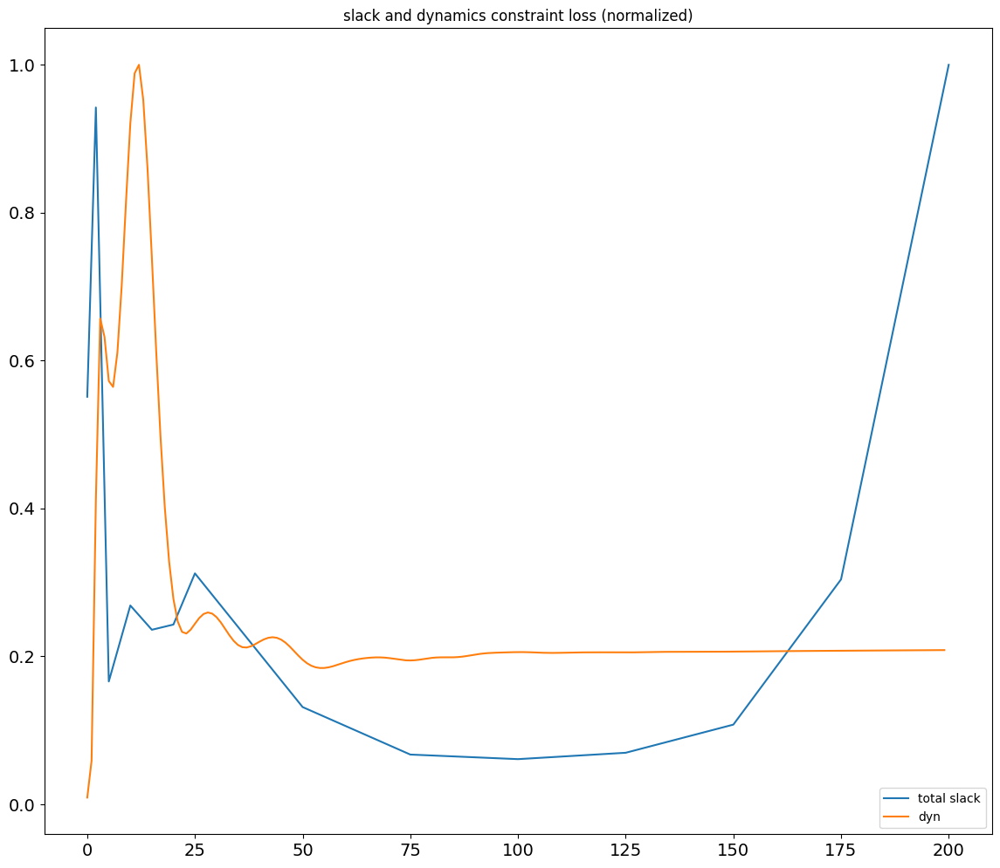

centers shape before:
(6400, 3)
numc 6400
cmax before 6400
numc <= self.cmax
Cnew shape before (6400, 3)
Cnew shape after (6400, 3)
theta shape before (6400,)
theta_shape after (6400,)
cmax after 6400
centers shape after
(6400, 3)


In [26]:
#########################
### Solve Initial CBF ###
#########################

# get h as a function of agent parameter
h = get_h(a)

#print(x2pi)
#print(x0)
#L = get_learning_cbfs_lagrangian_hj_optim(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, gamma_safe, gamma_dyn, gamma_unsafe)
#theta, _, _ = scipy.optimize.fmin_l_bfgs_b(L, np.random.rand(C.shape[0], 1), approx_grad=False, iprint=50)
#theta = cvx_train_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, lam_dh=lam_dh, lam_sp=lam_sp, verbose=True)
#theta = np.array(clarabel_solve_cbf(a, x_safe.astype(np.float64), u_safe.astype(np.float64), x_buffer.astype(np.float64), 
#                                       u_buffer.astype(np.float64), x_unsafe.astype(np.float64), gamma_safe, gamma_dyn, gamma_unsafe))#,
#                                       x2pi=x2pi.astype(np.float64), x0=x0.astype(np.float64) ))
# prepare data 
#theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))
#C = loc_hjb_grid.states.reshape(-1, 3)


target = np.array([1, -1, 0])
slack = []
IT = [0, 2, 5, 10, 15, 20, 25, 50, 75, 100, 125, 150, 175, 200]
for it in IT:
    a.centers = [C]
    interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    rhs = interpv(loc_V, C)
    theta = fit_cbf_w_inv(a, C, rhs)
    #h_max = plot_cbf(a, C[np.newaxis,...], theta[np.newaxis,...], angle=a.pos[-1], obstacles=obstacles, N_part=60)
    print(theta)
    #it = 5; 
    eps=3e-2; tol=1e-8; mu=0.90; hm=10 #mu = 0.90 #170e-10
    theta, loss, Lsafe, Ldyn, Lunsafe = gradient_descent(a, theta, it, eps, mu, tol, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe,\
                                        gamma_dyn, gamma_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, lam_th, hm, use_jax=True)
    plt.plot(loss)
    plt.show()
    a.thetas = [theta]
 
    # GET TOTAL SLACK #
    DT   = 0.02    # numerical integration timestep
    tol  = 0.000   # h-value at which to halt approach
    eps  = 0.00#0.001
    dx   = 0.5     # if |x'-x|<dx, approach again
    tend = 80      # Duration of boundary approach
    T    = 0.3     # MPC horizon (default timestep is 0.05)
    N    = 3       # number of CBFs to learn
    a.pos = np.array([init_x, init_y, init_theta])
    traj,usig,total_slack = a.goto(target, T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, eps=eps, N_part=60, 
                                   plot_usig=True, plot_hxt=True)
    slack.append(total_slack)


plt.figure(figsize=(14,12))
IT = np.array(IT)
slack = np.array(slack)
slack = slack / np.max(slack)
Ldyn = np.array(Ldyn)
Ldyn = Ldyn / np.max(Ldyn)
plt.plot(IT, slack, label="total slack")
#plt.plot(Lsafe, label="safe")
plt.plot(Ldyn, label="dyn")
#plt.plot(Lunsafe, label="unsafe")
plt.legend()
plt.title("slack and dynamics constraint loss (normalized)")
#plt.ylim(0, 100)
plt.show()



a.thetas.append(theta)
a.rectify_c_and_theta()

# initialize plotting objects
init_pos       = np.copy(a.pos)
curr_centers   = np.copy(np.array(a.centers))
curr_thetas    = np.copy(np.array(a.thetas))
curr_data      = np.copy(np.vstack((x_safe, x_buffer, x_unsafe)))
curr_traj      = np.copy(a.pos.reshape(-1, 3))
quad_plot_args =[(0, curr_centers, curr_thetas, curr_data)]
data_safe = np.vstack((x_buffer, x_safe))
data_unsafe = x_unsafe
all_C = C

In [ ]:
print(np.array(a.centers).shape)
print(theta.shape)
print(np.array(a.thetas).shape)
print(np.linalg.norm(theta)**2)

In [ ]:
########################
### Plot Initial CBF ###
########################

h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, N_part=10)
#a.thetas[-1] *= 1 / h_max
#h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, N_part=10)
#h_max = plot_cbf(a, loc_hjb_grid.states.reshape(-1, 3)[np.newaxis,:], theta[np.newaxis, :], angle=a.pos[-1], obstacles=obstacles)
#h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=2*np.pi, obstacles=obstacles)
plot_angles(a, grid, loc_hjb_grid, obs_dict, pos=a.pos, N_part=10)

In [ ]:
##################################
### Configure Safe Exploration ###
##################################

DT   = 0.02   # numerical integration timestep
tol  = 0.000   # h-value at which to halt approach
eps  = gamma_dyn
dx   = 0.5     # if |x'-x|<dx, approach again
tend = 80      # Duration of boundary approach
T    = 0.3     # MPC horizon (default timestep is 0.05)
N    = 3       # number of CBFs to learn

In [ ]:
########################
### Safe Exploration ###
########################

a.pos = np.array([init_x, init_y, init_theta])

targets   = [np.array([1, -1,       0]),
             np.array([1, -1,       0]),
             np.array([1,  1, np.pi/2]),
             np.array([1,  1, np.pi/2])]
#targets   = None

for i in range(N):
    ######################
    ### Go to boundary ###
    ######################
    
    prev_pos = a.pos  
    if targets is not None:
        print("target:", targets[i]) 
        traj,usig = a.goto(targets[i], T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, eps=eps)  
        print("dx:", np.linalg.norm(a.pos - prev_pos))
    else: 
        while np.linalg.norm(a.pos - prev_pos) <= dx:    
            target_pos   = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)  
            target_angle = np.array([2 * np.pi * np.random.rand()])
            target       = np.hstack((target_pos, target_angle)) 
            while h(target, np.array(a.centers), np.array(a.thetas))[0] > 0:
                target_pos   = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)
                target_angle = np.array([2 * np.pi * np.random.rand()])
                target       =  np.hstack((target_pos, target_angle)) 
            print("target:", target) 
            traj,usig = a.goto(target, T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, eps=eps) 
            print("dx:", np.linalg.norm(a.pos - prev_pos))

    ####################
    ### Collect data ###
    ####################

    # scan states 
    pts_safe, pts_unsafe, in_scan_f = a.scan(ret_in_scan_f=True)
    scan_funcs.append(in_scan_f)
    samples, gparams, is_obs_sample,\
    x2pi_samp, x0_samp = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True, bicycle=True, boundary_condition=True)
    sample_funcs.append(is_obs_sample)
    loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], thn, rx=rx, T=500, mult=mult)
    scan_safe, scan_unsafe,\
    x2pi_scan, x0_scan = a.scan_hjb(loc_V, loc_hjb_grid, bicycle=True, boundary_condition=True)
    n_safe             = len(scan_safe) #len(pts_safe)
    print("n safe", n_safe)
    print("scan safe shape", scan_safe.shape)
    x_buffer, x_safe   = a.make_buffer(scan_safe, int(nm * n_safe), pct, bicycle=True)

    x2pi = np.vstack((x2pi_samp, x2pi_scan))
    x0   = np.vstack((x0_samp, x0_scan))
    
    # unsafe states 
    if scan_unsafe.shape[0] != 0:
        x_unsafe = np.vstack((scan_unsafe, samples))
    else: 
        x_unsafe = samples    
        
    # centers
    C = []
    for x in c_grid:
        if np.linalg.norm(x[:2] - a.pos[:2]) <= rc:
            C.append(x)
    C = np.array(C)    
    tmp = []
    for p in C:
        c = np.repeat(p.reshape(1, -1), hjb_grid.states.shape[2], axis=0)
        c = np.hstack((c, np.array(hjb_grid.coordinate_vectors[2]).reshape(-1, 1)))
        cend = np.array([p[0], p[1], 2*np.pi]).astype(np.float32)
        tmp.append(np.vstack((c, cend)))
    C = np.vstack(tmp)  
    a.centers.append(C)

    # plot CBF data
    plot_angle_data(C, grid, obs_dict, spacing, safe=x_safe, buffer=x_buffer, unsafe=scan_unsafe, samples=samples)

    # safe and buffer control
    u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
    if x_buffer.shape[0] != 0:
        u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
    else:
        u_buffer = np.array([])

    # total data 
    from data import check_obs
    all_obs_func = lambda x: check_obs(x, obs_funcs) or (check_obs(x, sample_funcs) and not check_obs(x, scan_funcs))
    out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
    obsamp_f     = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
    for x in grid:
        if obsamp_f(x):
            plt.plot(x[0], x[1], color='red', marker='o', linestyle='none')           
        else:
            plt.plot(x[0], x[1], color='black', marker='o', linestyle='none')
    plt.show()

    
    #####################
    ### Learn new CBF ###
    ##################### 
    interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    b = interpv(loc_V, C)
    theta = fit_cbf_w_inv(a, C, b)
    it = 3000; eps=5e-3; tol=1e-4; 
    theta, loss = gradient_descent(a, theta, it, eps, tol, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh)
    plt.plot(loss) 
    #theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))#, x2pi=x2pi, x0=x0))
    a.thetas.append(theta)
    a.rectify_c_and_theta()

    # plot new CBF
    h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles)
    a.thetas[-1] *= 1/h_max
    plot_angles(a, grid, hjb_grid, obs_dict)

    # collect quad plot data
    curr_data    = np.copy(np.vstack( ( curr_data, np.vstack((x_safe, x_buffer, x_unsafe)) ) ))
    curr_centers = np.copy(np.array(a.centers))
    curr_thetas  = np.copy(np.array(a.thetas))
    curr_traj    = np.copy(np.vstack( (curr_traj, traj) ))
    quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)
    quad_plot_args.append((i+1, curr_centers, curr_thetas, curr_data))

    data_safe   = union(data_safe, np.vstack((x_buffer, x_safe)))
    data_unsafe = difference(union(data_unsafe, x_unsafe), data_safe)

    all_C = union(all_C, C)
    plot_angle_data(all_C, grid, obs_dict, spacing, safe=data_safe, unsafe=data_unsafe, title="ALL DATA")

final_pos = np.copy(a.pos)
quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)

In [ ]:
#vmin, vmax = loc_V.min(), loc_V.max()
#levels = np.linspace(round(vmin), round(vmax), 10*(round(vmax) - round(vmin) + 1))
X = np.linspace(lo[0], hi[0], n[0])
Y = np.linspace(lo[1], hi[1], n[1])
Th = np.linspace(0, 2*np.pi, thn, endpoint=True)
hvals = np.empty((n[0], n[1], thn))
h = get_h_curr(a)
pts = []
for i, x, in enumerate(X):
    for j, y in enumerate(Y):
        for k, th in enumerate(Th):
            pts.append(np.array([x, y, th]))
pts = np.array(pts)
hvals = h(pts)[0].reshape(n[0], n[1], thn)
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

In [ ]:
#######################################
### Sequential plot of learned CBFs ###
#######################################

fig = plt.figure(figsize=(15, 15))
axs = [fig.add_subplot(2,2,i+1) for i in range(4)]

for ax in axs:
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal') 
    
fig.subplots_adjust(wspace=0, hspace=0)

for i, args in enumerate(quad_plot_args):
    quad_plot(a, axs[i], args[0], args[1], args[2], args[3], args[4], grid, obs_dict)
plt.show()

In [ ]:
##################################################
### Learn a single CBF from all data collected ###
##################################################

n_safe = len(pts_safe)
all_obs_func = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
gparams = get_gparams(np.vstack((data_safe, data_unsafe)), hjb_grid)
loc_V, loc_hjb_grid = a.get_local_V(gparams, all_obs_func, thn, rx=None, out_func=out_func, T=500, mult=mult)
print("number of gridpoints:", loc_hjb_grid.states.flatten().shape)
all_x_buffer, all_x_safe = a.make_buffer(data_safe, int(nm * n_safe), pct, bicycle=True) 
all_u_safe = hjb_controls_parallel(a, all_x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    all_u_buffer = hjb_controls_parallel(a, all_x_buffer, loc_hjb_grid, loc_V)
else:
    all_u_buffer = np.array([])
interpv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
b = interpv(loc_V, C)
all_theta = fit_cbf_w_inv(a, C, b)
it = 3000; eps=1e-3; tol=1e-4; 
all_theta, loss = gradient_descent(a, all_theta, it, eps, tol, all_x_safe, all_u_safe, all_x_buffer, all_u_buffer, data_unsafe, gamma_safe, gamma_dyn, gamma_unsafe,\
                                   lam_safe, lam_dyn, lam_unsafe, lam_dh, centers=all_C)
plt.plot(loss)
#all_theta = np.array(clarabel_solve_cbf(a, all_x_safe, all_u_safe, all_x_buffer, all_u_buffer, data_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, centers=all_C))
h_max = plot_cbf(a, np.array(all_C)[np.newaxis,...], np.array(all_theta)[np.newaxis,...], angle=a.pos[-1], obstacles=obstacles)
_plot_angles(a, np.array(all_C)[np.newaxis,...], np.array(all_theta)[np.newaxis,...], grid, hjb_grid, obs_dict)

In [ ]:
#############################
### Plot velocity curves ####
#############################
import copy

a2 = copy.copy(a)
a2.thetas = [all_theta]
a2.centers= [all_C]

start_pos = np.array([-1.2 ,-1, 0])
target    = np.array([1, 0, 0])
a.pos = start_pos
a2.pos= start_pos

DT   = 0.001
mpc_DT = 0.01
T    = 0.3
tol  = 0.05
tend = 30

traj ,usig = a.goto(target, T=T, tend=tend, tol=tol, angle=a.pos[-1], manual=True, DT=DT, mpc_DT=mpc_DT, eps=eps, bicycle=True)  
traj2,usig2= a2.goto(target, T=T, tend=tend, tol=tol, angle=a2.pos[-1], manual=True, DT=DT, mpc_DT=mpc_DT, eps=eps, bicycle=True) 


v1 = np.linalg.norm(np.vstack((traj[1:, :-1],np.array([0,0])))  - traj, axis=1)/DT
v2 = np.linalg.norm(np.vstack((traj2[1:,:-1],np.array([0,0])))  - traj2, axis=1)/DT
plt.plot(v1[:-1], color="red", label="max of local cbfs")
plt.plot(v2[:-1], color="blue", label="baseline")
plt.ylabel("velocity")
plt.xlabel("time")
plt.legend()
plt.show()

plt.plot(usig , color="red" , label="max cbf, |u|" )
plt.plot(usig2, color="blue", label="baseline, |u|")
plt.ylabel("norm of control")
plt.xlabel("time")
plt.legend()
plt.show()

In [ ]:
X = np.linspace(lo[0], hi[0], n[0])
Y = np.linspace(lo[1], hi[1], n[1])
Th = np.linspace(0, 2*np.pi, thn, endpoint=True)
hvals = np.empty((n[0], n[1], thn))
h = get_h_curr(a2)
for i, x, in enumerate(X):
    for j, y in enumerate(Y):
        for k, th in enumerate(Th):
            hvals[i, j, k] = h(jnp.array([x, y, th]))[0]
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(vmax) - round(vmin) + 1))
fig    = plt.figure(figsize=(13, 8))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

In [ ]:
y =-0.66
Nx = 200
Nth = 200
X = np.linspace(-2, 2, Nx)
Theta = np.linspace(0-0.5, 2*np.pi+0.5, Nth)
xx, thth = np.meshgrid(X, Theta)
h = get_h_curr(a)
hvals = np.zeros((Nx, Nth))
for i, x in enumerate(X):
    for j, th in enumerate(Theta):
        hvals[i, j] = h(np.array([x, y, th]))[0]
fig = plt.figure(figsize=(14, 12))
from mpl_toolkits.mplot3d import Axes3D
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=60, azim=-30)
ax.plot_surface(xx, thth, hvals)
ax.set_xlabel("x", fontsize=20)
ax.set_ylabel("theta", fontsize=20)
ax.set_zlabel("h", fontsize=20)
ax.set_title("cbf for (x, y=" + str(np.round(y, 3)) + ", theta)", fontsize=20)
plt.show()

h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), angle=a.pos[-1], obstacles=obstacles, line=y)

In [ ]:
#########################################################
### Plot Dh(x)@(f(x)+g(x)u^*) + h(x) for CBF and CBVF ###
#########################################################
 
from controls import cbf_controls, cbf_controls_parallel
from optim import get_Dphi_curr
from tqdm import tqdm
N_part = 25
dynamics = a.dynamics
f = dynamics.open_loop_dynamics
g = dynamics.control_jacobian
fv = jax.vmap(f, in_axes=(0, None))
gv = jax.vmap(g, in_axes=(0, None))
mult=1
Nx = int(mult*loc_hjb_grid.states.shape[0])
Ny = int(mult*loc_hjb_grid.states.shape[1])
Nth = int(mult*thn)
#Nx = int(mult*n[0]); print("Nx", Nx)
#Ny = int(mult*n[1]); print("Ny", Ny)
#Nth= int(mult*thn); print("Nth", Nth)
for ftype in ["cbf"]:#, "hjb"]:
    X = np.linspace(loc_hjb_grid.domain.lo[0], loc_hjb_grid.domain.hi[0], Nx)
    Y = np.linspace(loc_hjb_grid.domain.lo[1], loc_hjb_grid.domain.hi[1], Ny)
    Th = np.linspace(0, 2*np.pi, Nth, endpoint=True)
    #X = np.linspace(lo[0], hi[0], Nx)
    #Y = np.linspace(lo[1], hi[1], Ny)
    #Th = np.linspace(0, 2*np.pi, Nth, endpoint=True)
    hvals = np.empty((Nx, Ny, Nth))
    onlyh = np.empty_like(hvals)
    if ftype == "cbf": 
        h = get_h_curr(a)
        Dphi = get_Dphi_curr(a)
    pts = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):  
                pts.append(np.array([x,y,th]))
    pts = np.array(pts) 
    print("#################")
    print("### PTS SHAPE ###:", pts.shape)
    print("#################")
    U = cbf_controls_parallel(a, pts, N_part=N_part, verbose=False)
    print("###############")
    print("### U SHAPE ###:", U.shape)
    print("###############")

    N = pts.shape[0]
    partition = int(N / N_part)
    remainder = N - (N_part * partition)
    dhX = None
    hmax = None
    for i in range(N_part + 1): 
        if i == N_part and remainder != 0:
            idx_start = i * partition
            idx_end = idx_start + remainder
        elif i == N_part and remainder == 0:
            break
        else:
            idx_start = i * partition
            idx_end = (i + 1) * partition
        P = pts[idx_start:idx_end]
        hmaxX, argmax = h(P)  
        thetas_max = np.array(a.thetas)[argmax,:]
        if dhX is None:
            dhX = np.einsum('ij,ijk->ik', thetas_max, Dphi(P))
            hmax = hmaxX
        else:
            dhX = np.vstack((dhX, np.einsum('ij,ijk->ik', thetas_max, Dphi(P))))
            hmax = np.concatenate((hmax, hmaxX))
        print("dhX shape", dhX.shape)
    dhX = dhX#.reshape(Nx, Ny, Nth, 3); print("dhX shape", dhX.shape)
    hmax = hmax#.reshape(Nx,Ny,Nth); print("hmax shape", hmax.shape)
    #onlyh = hmax  
    print("pts shape", pts.shape)
    fX = fv(pts,0)#.reshape(Nx,Ny,Nth,3); print("fX shape", fX.shape)
    gX = gv(pts,0)#.reshape(Nx,Ny,Nth,3); print("gX shape", gX.shape)
    l = 0
    grad = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):
                #p = np.array([x,y,th])
                if ftype == "cbf":
                    #u = cbf_controls(a, p) 
                    #hmax, argmax = h(p)
                    #hvals[i, j, k] = (a.thetas[argmax][np.newaxis,:] @ Dphi(p).squeeze() @ (f(p,0) + g(p,0) @ u) + hmax)[0]
                    grad.append(np.linalg.norm(dhX[l])**2)
                    #hvals[i,j,k] = (dhX[i,j,k][np.newaxis,...] @ (fX[i,j,k][...,np.newaxis] + gX[i,j,k][...,np.newaxis] @ U[l,:][...,np.newaxis]) + a.gamma*hmax[i,j,k]).item()
                    hvals[i,j,k] = (dhX[l][np.newaxis,...] @ (fX[l][...,np.newaxis] + gX[l] @ U[l,:][...,np.newaxis]) + (1/a.gamma)*hmax[l]).item()
                    #hvals[i, j, k] = (a.thetas[argmax] @ Dphi(p) @ (f(p,0) + g(p,0) @ U[l,:]) + a.gamma*hmax)[0]
                    onlyh[i,j,k] = hmax[l]
                    l += 1
grad = np.array(grad)
print("##################")
print("### ||grad||^2 ###:", np.max(grad))
print("##################")
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(hmax) - round(hmin) + 1))
fig    = plt.figure(figsize=(15, 15))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)
    plt.contour(X,
                Y,
                onlyh[:, :, i].T,
                levels=0,
                colors="cyan",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation

In [ ]:
#########################################################
### Plot Dh(x)@(f(x)+g(x)u^*) + h(x) for CBF and CBVF ###
#########################################################
 
from controls import cbf_controls, cbf_controls_parallel, hjb_controls_parallel_partitioned
from optim import get_Dphi_curr
from tqdm import tqdm
dynamics = a.dynamics
f = dynamics.open_loop_dynamics
g = dynamics.control_jacobian
mult=1
for ftype in ["cbvf"]:#, "hjb"]:
    X = np.linspace(loc_hjb_grid.domain.lo[0], loc_hjb_grid.domain.hi[0], int(mult*loc_hjb_grid.states.shape[0]))
    Y = np.linspace(loc_hjb_grid.domain.lo[1], loc_hjb_grid.domain.hi[1], int(mult*loc_hjb_grid.states.shape[1]))
    Th = np.linspace(0, 2*np.pi, int(mult*thn), endpoint=True)
    hvals = np.empty((int(mult*loc_hjb_grid.states.shape[0]), int(mult*loc_hjb_grid.states.shape[1]), int(mult*thn)))
    onlyh = np.empty_like(hvals)
    '''
    if ftype == "cbvf": 
        h = get_h_curr(a)
        Dphi = get_Dphi_curr(a)
    '''
    pts = []
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):  
                pts.append(np.array([x,y,th]))
    pts = np.array(pts) 
    print("#################")
    print("### PTS SHAPE ###:", pts.shape)
    print("#################")
    U = hjb_controls_parallel_partitioned(a, pts, loc_hjb_grid, loc_V, N_part=30, verbose=False)
    print("###############")
    print("### U SHAPE ###:", U.shape)
    print("###############")
    intv = jax.vmap(loc_hjb_grid.interpolate, in_axes=(None, 0))
    hmax = intv(loc_V, pts)
    grad_h = intv(loc_hjb_grid.grad_values(loc_V), pts)
    l = 0
    for i, x, in tqdm(enumerate(X)):
        for j, y in enumerate(Y):
            for k, th in enumerate(Th):
                p = np.array([x,y,th])
                if ftype == "cbvf":
                    #u = cbf_controls(a, p) 
                    #hmax = loc_hjb_grid.interpolate(loc_V, p)
                    #hvals[i, j, k] = (a.thetas[argmax][np.newaxis,:] @ Dphi(p).squeeze() @ (f(p,0) + g(p,0) @ u) + hmax)[0]
                    hvals[i, j, k] = grad_h[l,:] @ (f(p,0) + g(p,0) @ U[l,:]) + (1/a.gamma)*hmax[l]
                    onlyh[i, j, k] = hmax[l]
                    l += 1
hmin, hmax = hvals.min(), hvals.max() 
levels = np.linspace(hmin, hmax, 10*(round(hmax) - round(hmin) + 1))
fig    = plt.figure(figsize=(15, 15))
def render_frame(i, colorbar=False):
    plt.contourf(X,
                 Y,
                 hvals[:, :, i].T,
                 vmin=hmin,
                 vmax=hmax,
                 levels=levels)
    plt.axis('square')
    if colorbar:
        plt.colorbar()
    plt.title("theta: " + str(np.round(Th[i], 2)))
    plt.contour(X,
                Y,
                hvals[:, :, i].T,
                levels=0,
                colors="black",
                linewidths=1)
    plt.contour(X,
                Y,
                onlyh[:, :, i].T,
                levels=0,
                colors="cyan",
                linewidths=1)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, thn, interval=48).to_html5_video())
plt.close()
animation